# This should be the main notebook for working with the South Pole firn compaction data.
## I also have SP_metdata to process the met data from pole, and SP_model to make the CFM forcing files. (and also play a bit with the model output; comparing monthly to daily, etc.)

### Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import scipy.signal as sps
import pickle
# from datetime import datetime as dt
import datetime as DT
from datetime import datetime, timedelta
import time
import seaborn as sns
import matplotlib as mpl
import h5py as h5
# %matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import scipy.stats as stats
import csv
import os
import warnings
import scipy as sp
import re
import calendar
# %matplotlib notebook
sns.set()
import matplotlib
from matplotlib.dates import date2num
matplotlib.rcParams.update({'font.size': 22})
sns.set(font_scale=2)

### Set plot parameters (seaborn, matplotlib)

In [2]:

sb=True
if sb:
    sns.set()
    sns.set_context('paper', font_scale=1.5, rc={"lines.linewidth": 1.5})
#     sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
    sns.set_style("whitegrid",{"xtick.top":True, "xtick.bottom":True,"ytick.left":True, "ytick.right":True})
# plt.style.use('seaborn-notebook')

# pd.set_option('display.height', 500)
pd.set_option('display.max_rows', 500)
mpl.rcParams['axes.formatter.useoffset'] = False
mpl.rcParams.update({'figure.autolayout': True})
fontsz = 20
plt.rc('xtick',labelsize=20)
plt.rc('ytick',labelsize=20)
plt.rcParams['axes.titlesize'] = 22
plt.rcParams["axes.labelsize"] = 22
plt.rcParams['figure.figsize'] = [12, 10]

palette = sns.color_palette()

In [3]:
%matplotlib inline
# %matplotlib notebook

### Definitions

In [4]:
def toYearFraction(date):
    def sinceEpoch(date): # returns seconds since epoch
        return calendar.timegm(date.timetuple())
    s = sinceEpoch

    year = date.year
    startOfThisYear = datetime(year=year, month=1, day=1)
    startOfNextYear = datetime(year=year+1, month=1, day=1)

    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed/yearDuration

    return date.year + fraction

def decyeartodatetime(din):
    start = din
    year = int(start)
    rem = start - year
    base = datetime(year, 1, 1)
    result = base + timedelta(seconds=(base.replace(year=base.year + 1) - base).total_seconds() * rem)
    if result.hour<12:
        result2 = result.replace(hour=0, minute=0, second=0, microsecond=0)
    else:
        result = result + timedelta(days=1)
        result2 = result.replace(hour=0, minute=0, second=0, microsecond=0)
    return result2

def smooth(x,window_len=12,window='hanning'):
    """smooth the data using a window with requested size.
    
    This method is based on the convolution of a scaled window with the signal.
    The signal is prepared by introducing reflected copies of the signal 
    (with the window size) in both ends so that transient parts are minimized
    in the begining and end part of the output signal.
    
    input:
        x: the input signal 
        window_len: the dimension of the smoothing window; should be an odd integer
        window: the type of window from 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'
            flat window will produce a moving average smoothing.

    output:
        the smoothed signal
        
    example:

    t=linspace(-2,2,0.1)
    x=sin(t)+randn(len(t))*0.1
    y=smooth(x)
    
    see also: 
    
    numpy.hanning, numpy.hamming, numpy.bartlett, numpy.blackman, numpy.convolve
    scipy.signal.lfilter
 
    TODO: the window parameter could be the window itself if an array instead of a string
    NOTE: length(output) != length(input), to correct this: return y[(window_len/2-1):-(window_len/2)] instead of just y.
    """

    if x.ndim != 1:
        raise ValueError("smooth only accepts 1 dimension arrays.")

    if x.size < window_len:
        raise ValueError("Input vector needs to be bigger than window size.")


    if window_len<3:
        return x


    if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
        raise ValueError("Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'")


    s=np.r_[x[window_len-1:0:-1],x,x[-2:-window_len-1:-1]]
    #print(len(s))
    if window == 'flat': #moving average
        w=np.ones(window_len,'d')
    else:
        w=eval('np.'+window+'(window_len)')

    y=np.convolve(w/w.sum(),s,mode='valid')

    return y[int(window_len/2-1):-int(window_len/2)]

In [5]:
palette

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

In [6]:
def get_plotdeets(modelname):
    palette = sns.color_palette()
    if modelname =='data':
        colo = 'black'
        legname = 'Data'
    elif modelname =='HLdynamic':
        colo = palette[1]
        legname = 'Herron & Langway (1980)'
    elif modelname == 'MaxSP':
        colo = palette[3]
        legname = 'This work'
    elif modelname == 'Ligtenberg2011':
        colo = palette[2]
        legname = 'Ligtenberg et al. (2011)'
    elif modelname == 'GSFC2020':
        colo = palette[0]
        legname = 'GSFC (Medley et al., 2020)'
    elif modelname == 'Li2015':
        colo = palette[4]
        legname = 'Li & Zwally (2015)'
    elif modelname == 'Crocus':
        colo = palette[5]
        legname = 'Crocus (Vionnet et al. 2012)'
        
    elif modelname == 'MaxSP60':
        colo = palette[3]
        legname = '60 kJ/mol'
    elif modelname == 'MaxSP50':
        colo = palette[7]
        legname = '50 kJ/mol'
    elif modelname == 'MaxSP55':
        colo = palette[8]
        legname = '55 kJ/mol'
    elif modelname == 'MaxSP65':
        colo = palette[9]
        legname = '65 kJ/mol'
    elif modelname == 'MaxSP70':
        colo = palette[6]
        legname = '70 kJ/mol'
    elif modelname == 'MaxSP40':
        colo = palette[5]
        legname = '40 kJ/mol'
        
#     elif modelname == 'Goujon2003':
#         colo = (0.7686274509803922, 0.3058823529411765, 0.3215686274509804)
# #         colo = (0, 0.5172, 0.5862)
#         legname = 'Goujon et al. (2003)'        
#     elif modelname == 'KuipersMunneke2015':
#         colo = (0.6207, 0.3103, 0.2759)
#         legname = 'Kuipers-Munneke et al. (2015)'
#     elif modelname == 'Simonsen2013':
#         colo = (1.0000, 0.8276, 0)      
#         legname = 'Simonsen et al. (2013)'
#     elif modelname == 'HLSigfus':
#         colo = (1.0000, 0, 0)
#         legname = 'Herron & Langway (1980), Sigfus'
#     elif modelname == 'Helsen2008':
#         colo = (0, 1.0000, 0)
#         legname = 'Helsen et al., (2008)'
#     elif modelname == 'Arthern2010S':
#         colo = (0, 0, 0.1724)
#         legname = 'Arthern et al. (2010)'
#     elif modelname == 'Arthern2010T':
#         colo = (1.0000, 0.1034, 0.7241)
#         legname = 'Arthern et al. (2010) Transient'


    return colo, legname

datacolor = (0.5058823529411764, 0.4470588235294118, 0.6980392156862745)
datacolor2 = (0.8, 0.7254901960784313, 0.4549019607843137)
hcolor = (0.2980392156862745, 0.4470588235294118, 0.6901960784313725)
gcolor = (0.7686274509803922, 0.3058823529411765, 0.3215686274509804)

In [7]:
def convert_partial_year(number):

    year = int(number)
    d = timedelta(days=(number - year)*365)
    day_one = datetime(year,1,1)
    date = d + day_one
    return date

In [8]:
def rmscalc(holedep,inum,data_decimaldates,tsteps,dfp3,d2,mname):
#     co_rate_i = np.interp(data_decimaldates,tsteps+1,d2[fil][mname]['crate%s' %holedep])
    co_rate_i = np.interp(data_decimaldates,tsteps,d2[fil][mname]['crate%s' %holedep])
    idx = np.where(data_decimaldates>=2017.2)[0][0]
    modelmean = co_rate_i[idx:-28].mean()
    datamean = dfp3['compaction_rate_yr%s' %inum][idx:-28].mean()
    rmse = (np.sum((dfp3['compaction_rate_yr%s' %inum][idx:-28]-co_rate_i[idx:-28])**2)/len(dfp3['compaction_rate_yr%s' %inum][idx:-28]))**(0.5)
#     pdiff = (dfp3['compaction_rate_yr%s' %inum][idx:-28]-co_rate_i[idx:-28])/(co_rate_i[idx:-28])
#     rmsp = ((np.sum(pdiff**2))/len(dfp3['compaction_rate_yr%s' %inum][idx:-28]))**(0.5)
    rmsp = rmse/(dfp3['compaction_rate_yr%s' %inum][idx:-28].mean())
    return rmse, rmsp, modelmean, datamean

def rmscalc_daily(holedep,inum,mname,ist,ien):#,dfp_daily,d2,mname):
#     co_rate_i = np.interp(data_decimaldates,tsteps+1,d2[fil][mname]['crate%s' %holedep])
    model_cr = d2[fil][mname]['crate%s' %holedep][ist:ien]
    data_cr = dfp_daily['compaction_rate_yr{}'.format(inum)][ist:ien].values
    modelmean = np.mean(model_cr)
    datamean = np.mean(data_cr)
    rmse = (np.sum((model_cr-data_cr)**2)/len(model_cr))**(0.5)
#     pdiff = (model_cr-data_cr)/data_cr
#     rmsp = (np.sum((pdiff)**2)/len(model_cr))**(0.5)
    rmsp = rmse/datamean
    return rmse, rmsp, modelmean, datamean, (1-modelmean/datamean)
    # rms error, rms percent, mean model over the time period, mean data over the time period

In [9]:
def getINU(HL):
    if HL == 106:
        INU = 6
    elif HL ==80:
        INU = 2
    elif HL ==40:
        INU = 3
    elif HL ==30:
        INU = 4
    elif HL ==25:
        INU = 8
    elif HL ==20:
        INU = 7
    elif HL ==15:
        INU = (5,9)
    elif HL ==10:
        INU = 11
    elif HL ==5:
        INU = (1,12)
    return INU

## Run script to process and load data

In [10]:
run SP_PotsandTherm_new.py

/Users/maxstev/Documents/Grad_School/Research/SouthPole/SP_PotsandTherm_new.py:287: RuntimeWarning: divide by zero encountered in true_divide
  viscosity = 0.5 * stress_holebot[ii]/strain_rate
/Users/maxstev/Documents/Grad_School/Research/SouthPole/SP_PotsandTherm_new.py:288: RuntimeWarning: divide by zero encountered in true_divide
  viscosity_unfilt = 0.5 * stress_holebot[ii]/strain_rate_unfilt


In [11]:
dfp4.loc[:'2018-01-01','viscosity10']=-9999
df14D = dfp6.resample('14D').median()
diff_visc = df_dc.filter(regex='visc').copy()
dftest = dfp4[['hole_length5','hole_length10']].copy()
dftest['dif'] = dftest.hole_length5 - dftest.hole_length10
dftest['ddif'] = dftest['dif'].diff()
df2=df_dc.copy()
df2[((df2.columns.str.contains('compaction')) & (df2<0))]=0

In [12]:
dft4.to_csv('USP50_firn_temperatures_170109-181224.csv')

In [21]:
### Cumulative strain, sort of
# dfp10 = dfp6.resample('1d').mean()
# f1,a1=plt.subplots()
# ((dfp10['pot_length_unfilt9'][0]-dfp10['pot_length_unfilt9'])/14.43).plot(ax=a1)
# ((dfp10['pot_length_unfilt11'][0]-dfp10['pot_length_unfilt11'])/9.6).plot(ax=a1)
# a1.legend()
# # dfp6[['pot_length_unfilt9','pot_length_unfilt11']].plot(ax=a1)

In [24]:
# f4,a4=plt.subplots()
# # (dfp3['compaction9']-dfp3['compaction11']).plot(ax=a4)
# dfp4['strain_rate11'].plot(ax=a4)
# dfp4['strain_rate9'].plot(ax=a4)
# a4.legend()
# # dftest.dif.plot(ax=a4)

In [25]:
# dtest_comp = df_dc['hole_length1_11'][0]-df_dc['hole_length1_11']
# dtest_comprate = np.gradient(dtest_comp,deltat)
# dtest_comprate = dtest_comprate*SPY
# dtest_strain = dtest_comp/df_dc['hole_length1_11'][0]
# dtest_strain = df_dc['compaction1_11']/df_dc['hole_length1_11'][0]
# dtest_strainrate = np.gradient(dtest_strain,deltat)
# dtest_viscosity = 0.5*stress_holebot[10]/dtest_strainrate
# f78,a78 = plt.subplots()
# # dfp4[['strain_rate1','strain_rate11']]['2017-11-14':'2017-11-21'].plot(ax=a78)
# a78.plot(dtest_viscosity[0:-70])
# # a78.plot(-1*df_dc['viscosity111'].values[0:-70])

In [26]:
# f1,a1=plt.subplots()
# dfp4.iloc[0:-70].viscosity11.plot(ax=a1)

In [28]:
### Plot the two years in different colors
### to demonstrate the value of 2 years' measurement
# lw = 2.5
# i1yr = dfp3.index<'2018'
# i2yr = dfp3.index<'2018-12-15'
# f1,a1=plt.subplots(figsize=(12,8))
# # a1.plot(dfp3.index[i1yr],dfp3.compaction_rate_yr2[i1yr],color='g',linewidth=lw,label='Year 1')
# # a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr2[i2yr],'--',color='g',linewidth=lw,label='Year 2')

# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr5[i2yr],color='r',linewidth=lw,label='Year 2')
# a1.plot(dfp3.index[i1yr],dfp3.compaction_rate_yr5[i1yr],color='b',linewidth=lw,label='Year 1')
# a1.set_xlabel('Date')
# a1.set_ylabel(r'Compaction rate (m yr$^{-1}$)')
# a1.set_title('South Pole firn compaction: surface to 15 m')
# a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
# f1.savefig('2yearcompaction.pdf')

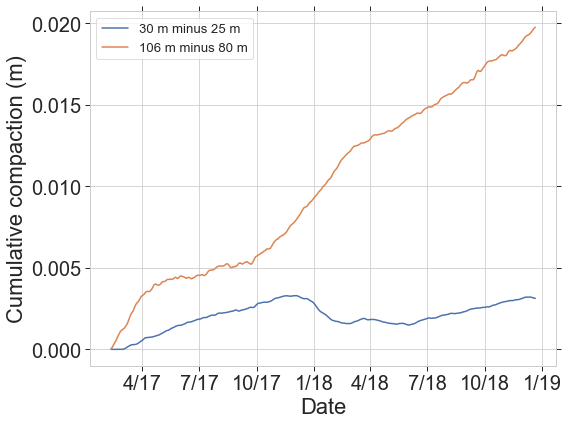

In [13]:
# f1,(a1,a2)=plt.subplots(2)
f1,a1=plt.subplots(figsize=(8,6))
a1.plot(df_dc.index,df_dc.compaction8_4,label='30 m minus 25 m')
a1.plot(df_dc.index,df_dc.compaction2_6,label='106 m minus 80 m')
# df_dc[['compaction8_4','compaction2_6']].plot(ax=a1)
a1.set_xlabel('Date')
a1.set_ylabel('Cumulative compaction (m)')
a1.legend()
a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
# df_dc['compaction8_4'].plot(ax=a2)
f1.savefig('DiffComp8426.pdf')
f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/DiffComp8426.pdf');

In [14]:
# Print out the total compaction for some boreholes
# This goes in section Results, Firn Compaction
for ii in list([1,12,5,9,6]):
    print('Hole: ',ii)
    s_cp = dfp3['compaction{}'.format(ii)][-1]-dfp3['compaction{}'.format(ii)][0]
    s_cp106 = dfp3['compaction6'][-1]-dfp3['compaction6'.format(ii)][0]
    print('total compaction: {:.3f}'.format(s_cp))
    print('% of 106 {:.3f}'.format(s_cp/s_cp106))
    print('total/year: {:.3f}'.format(dfp3['compaction{}'.format(ii)][-1]/(len(dfp3.index)/4)*365.25))
    print('-------------------')

Hole:  1
total compaction: 0.083
% of 106 0.316
total/year: 0.045
-------------------
Hole:  12
total compaction: 0.088
% of 106 0.334
total/year: 0.047
-------------------
Hole:  5
total compaction: 0.155
% of 106 0.592
total/year: 0.083
-------------------
Hole:  9
total compaction: 0.149
% of 106 0.567
total/year: 0.080
-------------------
Hole:  6
total compaction: 0.262
% of 106 1.000
total/year: 0.141
-------------------


In [15]:
dfp3['compaction_rate_yr6'][dfp3['compaction_rate_yr6']>0.22]

TIMESTAMP
2017-02-12 18:00:00    0.221391
2017-02-13 00:00:00    0.225210
2018-01-28 18:00:00    0.220276
2018-01-29 00:00:00    0.220803
2018-01-29 12:00:00    0.220332
Name: compaction_rate_yr6, dtype: float64

In [17]:
SPmetT = pd.read_pickle('SPmonthlyT_fromMET.pkl')

/Users/maxstev/miniconda3/envs/py38/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3444: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  exec(code_obj, self.user_global_ns, self.user_ns)


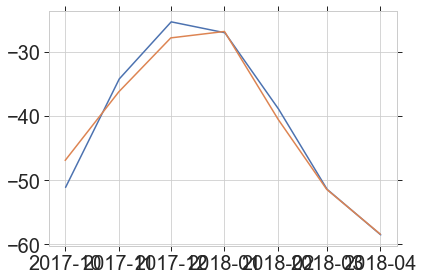

In [18]:
f1,a1=plt.subplots()
a1.plot(SPmetT['10-2016':'4-2017'].index+pd.Timedelta('1y'),SPmetT['10-2016':'4-2017'].values)
a1.plot(SPmetT['10-2017':'4-2018'].index,SPmetT['10-2017':'4-2018'].values)
# SPmetT['11-2016':'2-2017'].plot(ax=a1)
# SPmetT['11-2017':'2-2018'].plot(ax=a1)

/var/folders/q1/4kscqxkx4gd5hcq5dzc4586m0000gn/T/ipykernel_16054/1752303926.py:2: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  a1.plot(dfp5['2017'].index,dfp5['2017']['T_box1'].values)
/var/folders/q1/4kscqxkx4gd5hcq5dzc4586m0000gn/T/ipykernel_16054/1752303926.py:6: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  a2.plot(dfp5['2018'].index,dfp5['2018']['T_box1'].values,color='r')


(17532.0, 17896.0)

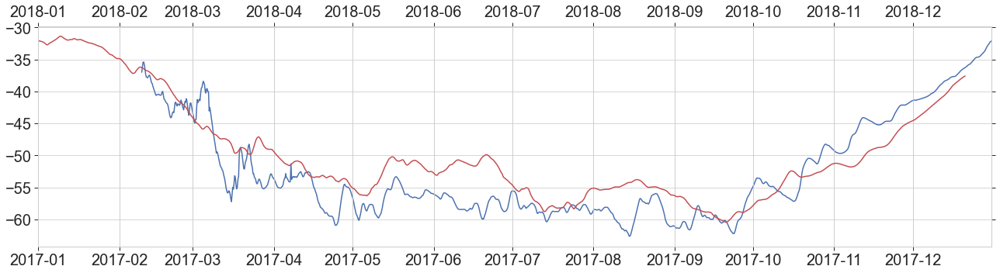

In [19]:
f1,a1=plt.subplots(figsize=(18,5))
a1.plot(dfp5['2017'].index,dfp5['2017']['T_box1'].values)
# a1.set_xlim(date2num(dfp3.index[0]), date2num(dfp3.index[-1]))
a1.set_xlim(date2num(datetime(2017,1,1)), date2num(datetime(2017,12,31)))
a2=a1.twiny()
a2.plot(dfp5['2018'].index,dfp5['2018']['T_box1'].values,color='r')
# dfp5['T_box1']['2018'].plot(ax=a2,color='r')
a2.set_xlim(date2num(datetime(2018,1,1)), date2num(datetime(2018,12,31)))

<AxesSubplot:xlabel='TIMESTAMP'>

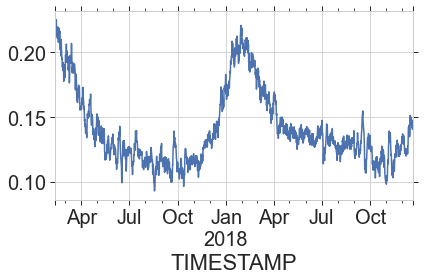

In [20]:
dfp3['compaction_rate_yr6'].plot()

In [21]:
# Total compaction, 106m hole, per year
dfp3['compaction6'][-1]/(len(dfp3.index)/4)*365.25

0.14090760981635558

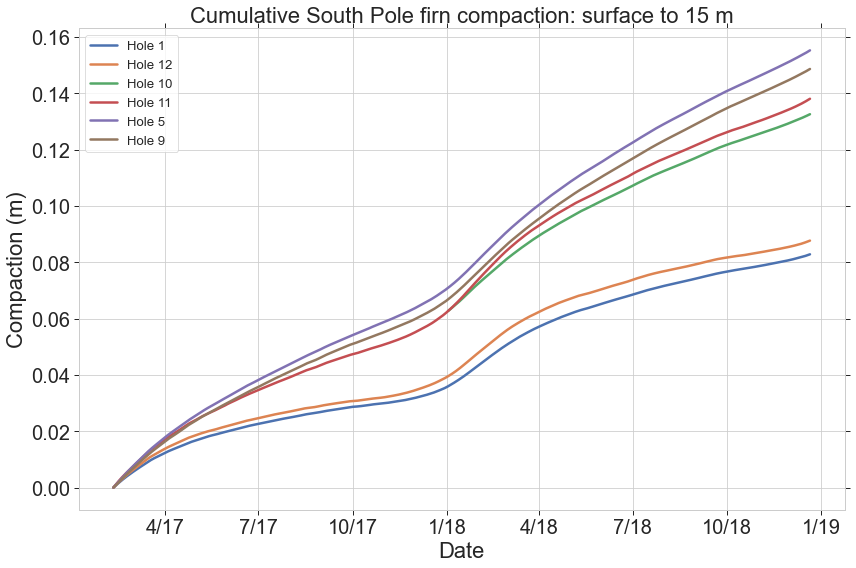

In [22]:
dfp3[['compaction5','compaction9','compaction6']]#.mean(axis=1)

lw = 2.5
holelist=['1','12','10','11','5','9']
# i1yr = dfp3.index<'2018'
# i2yr = dfp3.index<'2018-12-15'
f1,a1=plt.subplots(figsize=(12,8))
# a1.plot(dfp3.index[i1yr],dfp3.compaction_rate_yr2[i1yr],color='g',linewidth=lw,label='Year 1')
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr2[i2yr],'--',color='g',linewidth=lw,label='Year 2')
for ii,hh in enumerate(holelist):
    a1.plot(dfp3.index,dfp3['compaction{}'.format(hh)],color=palette[ii],linewidth=lw,label='Hole {}'.format(hh))
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr5[i2yr],'--',color='b',linewidth=lw,label='Year 2')
a1.set_xlabel('Date')
a1.set_ylabel(r'Compaction (m)')
a1.set_title('Cumulative South Pole firn compaction: surface to 15 m')
a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
a1.legend()
# f1.savefig('2yearcompaction.pdf')

In [23]:
dfp3['compaction_rate_yr1']

TIMESTAMP
2017-02-09 12:00:00    0.122119
2017-02-09 18:00:00    0.121474
2017-02-10 00:00:00    0.120783
2017-02-10 06:00:00    0.121777
2017-02-10 12:00:00    0.121963
                         ...   
2018-12-20 00:00:00    0.047290
2018-12-20 06:00:00    0.046496
2018-12-20 12:00:00    0.047224
2018-12-20 18:00:00    0.047442
2018-12-21 00:00:00    0.047246
Name: compaction_rate_yr1, Length: 2719, dtype: float64

In [24]:
ei=-1
eiS = 21*4
rms1_12 = (((dfp3['compaction_rate_yr1'][eiS:ei]-dfp3['compaction_rate_yr12'][eiS:ei])**2).sum()/len(dfp3['compaction_rate_yr1'][eiS:ei]))**(0.5)
mae1_12 = ((np.abs(dfp3['compaction_rate_yr1'][eiS:ei]-dfp3['compaction_rate_yr12'][eiS:ei])).sum()/len(dfp3['compaction_rate_yr1'][eiS:ei]))
mae10_11 = ((np.abs(dfp3['compaction_rate_yr10'][1318:ei]-dfp3['compaction_rate_yr11'][1318:ei])).sum()/len(dfp3['compaction_rate_yr11'][1318:ei]))
mae5_9 = ((np.abs(dfp3['compaction_rate_yr5'][eiS:ei]-dfp3['compaction_rate_yr9'][eiS:ei])).sum()/len(dfp3['compaction_rate_yr5'][eiS:ei]))

In [25]:
mean1_12 = np.mean((dfp3['compaction_rate_yr1'][eiS:ei]+dfp3['compaction_rate_yr12'][eiS:ei])/2)
mean10_11 = np.mean((dfp3['compaction_rate_yr10'][1318:ei]+dfp3['compaction_rate_yr11'][1318:ei])/2)
mean5_9 = np.mean((dfp3['compaction_rate_yr5'][eiS:ei]+dfp3['compaction_rate_yr9'][eiS:ei])/2)

In [26]:
pdiff1_12 = mae1_12/mean1_12
pdiff10_11 = mae10_11/mean10_11
pdiff5_9 = mae5_9/mean5_9

In [27]:
pdiff1_12

0.09569092491037813

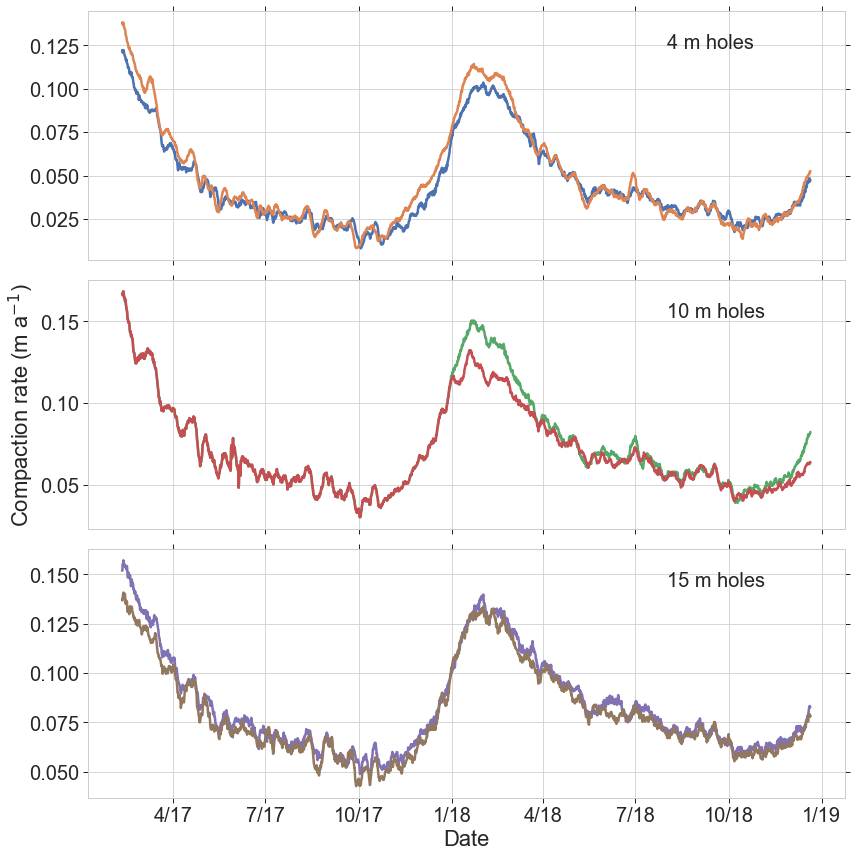

In [28]:
lw = 2.5
# ei=-32
# holelist=['1','12','10','11','5','9']
# i1yr = dfp3.index<'2018'
# i2yr = dfp3.index<'2018-12-15'
f1,(a1,a2,a3)=plt.subplots(3,figsize=(12,12))
# fig, (ax1, ax2) = plt.subplots(2)
# a1.plot(dfp3.index[i1yr],dfp3.compaction_rate_yr2[i1yr],color='g',linewidth=lw,label='Year 1')
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr2[i2yr],'--',color='g',linewidth=lw,label='Year 2')
a1.plot(dfp3.index[:ei],dfp3['compaction_rate_yr1'][:ei],color=palette[0],linewidth=lw,label='Hole 1')
a1.plot(dfp3.index[:ei],dfp3['compaction_rate_yr12'][:ei],color=palette[1],linewidth=lw,label='Hole 12')
a2.plot(dfp3.index[:ei],dfp3['compaction_rate_yr11'][:ei],color=palette[2],linewidth=lw,label='Hole 10')
a2.plot(dfp3.index[:ei],dfp3['compaction_rate_yr10'][:ei],color=palette[3],linewidth=lw,label='Hole 11')
a3.plot(dfp3.index[:ei],dfp3['compaction_rate_yr5'][:ei],color=palette[4],linewidth=lw,label='Hole 5')
a3.plot(dfp3.index[:ei],dfp3['compaction_rate_yr9'][:ei],color=palette[5],linewidth=lw,label='Hole 9')
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr5[i2yr],'--',color='b',linewidth=lw,label='Year 2')
a3.set_xlabel('Date')
a1.tick_params(labelbottom=False)
# a1.text(DT.date(2017, 4, 1), (a1.get_ylim()[1]-a1.get_ylim()[0])*0.75+a1.get_ylim()[0], "MAE = {:0.4f} m a$^{{-1}}$".format(mae1_12),fontsize=16)
# a2.text(DT.date(2017, 4, 1), (a2.get_ylim()[1]-a2.get_ylim()[0])*0.75+a2.get_ylim()[0], "MAE = {:0.4f} m a$^{{-1}}$".format(mae10_11),fontsize=16)
# a3.text(DT.date(2017, 4, 1), (a3.get_ylim()[1]-a3.get_ylim()[0])*0.75+a3.get_ylim()[0], "MAE = {:0.4f} m a$^{{-1}}$".format(mae5_9),fontsize=16)
a1.text(DT.date(2018, 8, 1), (a1.get_ylim()[1]-a1.get_ylim()[0])*0.85+a1.get_ylim()[0], "4 m holes",fontsize=20)
a2.text(DT.date(2018, 8, 1), (a2.get_ylim()[1]-a2.get_ylim()[0])*0.85+a2.get_ylim()[0], "10 m holes",fontsize=20)
a3.text(DT.date(2018, 8, 1), (a3.get_ylim()[1]-a3.get_ylim()[0])*0.85+a3.get_ylim()[0], "15 m holes",fontsize=20)
a2.tick_params(labelbottom=False)
a2.set_ylabel(r'Compaction rate (m a$^{-1}$)')
# a1.set_title('South Pole firn compaction')
a3.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
# a1.legend();
# a2.legend();
# a3.legend();
f1.savefig('RepeatInstrumentCR.pdf');
f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/RepeatInstrumentCR.pdf');

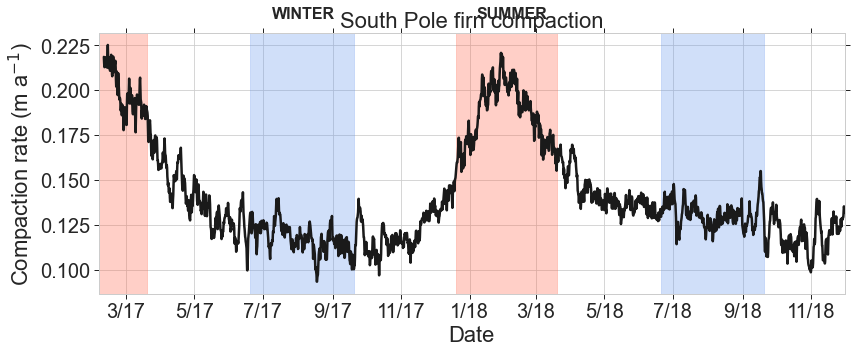

In [29]:
from matplotlib.dates import date2num
lw = 2.5
ei=-32
# holelist=['1','12','10','11','5','9']
# i1yr = dfp3.index<'2018'
# i2yr = dfp3.index<'2018-12-15'
f1,a1=plt.subplots(figsize=(12,5))
# fig, (ax1, ax2) = plt.subplots(2)
# a1.plot(dfp3.index[i1yr],dfp3.compaction_rate_yr2[i1yr],color='g',linewidth=lw,label='Year 1')
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr2[i2yr],'--',color='g',linewidth=lw,label='Year 2')
a1.plot(dfp6.index[:ei],dfp3['compaction_rate_yr6'][:ei],color='k',linewidth=lw,label='Hole 1')
# a1.plot(dfp3.index[:ei],dfp3['compaction_rate_yr12'][:ei],color=palette[1],linewidth=lw,label='Hole 12')
# a2.plot(dfp3.index[:ei],dfp3['compaction_rate_yr11'][:ei],color=palette[2],linewidth=lw,label='Hole 10')
# a2.plot(dfp3.index[:ei],dfp3['compaction_rate_yr10'][:ei],color=palette[3],linewidth=lw,label='Hole 11')
# a3.plot(dfp3.index[:ei],dfp3['compaction_rate_yr5'][:ei],color=palette[4],linewidth=lw,label='Hole 5')
# a3.plot(dfp3.index[:ei],dfp3['compaction_rate_yr9'][:ei],color=palette[5],linewidth=lw,label='Hole 9')
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr5[i2yr],'--',color='b',linewidth=lw,label='Year 2')
a1.axvspan(date2num(datetime(2017,12,20)), date2num(datetime(2018,3,20)), label="Summer", color="tomato", alpha=0.3)
a1.axvspan(date2num(datetime(2016,12,20)), date2num(datetime(2017,3,20)), label="Summer", color="tomato", alpha=0.3)
a1.axvspan(date2num(datetime(2017,6,20)), date2num(datetime(2017,9,20)), label="Winter", color="cornflowerblue", alpha=0.3)
a1.axvspan(date2num(datetime(2018,6,20)), date2num(datetime(2018,9,20)), label="Winter", color="cornflowerblue", alpha=0.3)
a1.set_xlabel('Date')
a1.tick_params(labelbottom=False)
a1.text(DT.date(2017, 7, 9), 0.24, "WINTER",fontsize=16,fontweight='bold')
a1.text(DT.date(2018, 1, 7), 0.24, "SUMMER",fontsize=16,fontweight='bold')
# a3.text(DT.date(2017, 4, 1), (a3.get_ylim()[1]-a3.get_ylim()[0])*0.75+a3.get_ylim()[0], "MAE = {:0.4f} m a$^{{-1}}$".format(mae5_9),fontsize=16)
# a1.text(DT.date(2018, 8, 1), (a1.get_ylim()[1]-a1.get_ylim()[0])*0.85+a1.get_ylim()[0], "5 m holes",fontsize=20)
# a2.text(DT.date(2018, 8, 1), (a2.get_ylim()[1]-a2.get_ylim()[0])*0.85+a2.get_ylim()[0], "10 m holes",fontsize=20)
# a3.text(DT.date(2018, 8, 1), (a3.get_ylim()[1]-a3.get_ylim()[0])*0.85+a3.get_ylim()[0], "15 m holes",fontsize=20)
a1.tick_params(labelbottom=True)
a1.set_ylabel(r'Compaction rate (m a$^{-1}$)')
a1.set_title('South Pole firn compaction')
a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
a1.set_xlim(date2num(datetime(2017,2,5)),date2num(datetime(2018,12,1)))
# a1.legend();
# a2.legend();
# a3.legend();
# f1.savefig('RepeatInstrumentCR.eps');
f1.savefig('Compaction_WinterSummer.pdf')
# f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/RepeatInstrumentCR.eps');

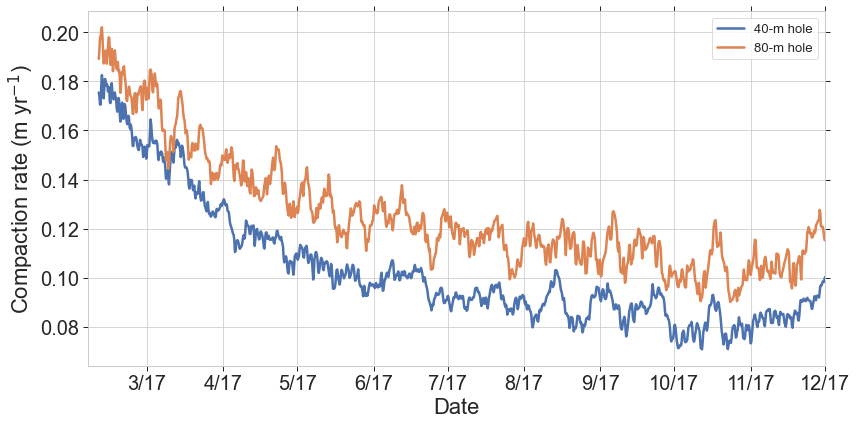

In [30]:
ei=-32
lw = 2.5
# holelist=['1','12','10','11','5','9']
# holelist = ['8','4','3']
holelist = ['3','2']
# i1yr = dfp3.index<'2018'
# i2yr = dfp3.index<'2018-12-15'
f1,a1=plt.subplots(figsize=(12,6))
# a1.plot(dfp3.index[i1yr],dfp3.compaction_rate_yr2[i1yr],color='g',linewidth=lw,label='Year 1')
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr2[i2yr],'--',color='g',linewidth=lw,label='Year 2')
for ii,hh in enumerate(holelist):
    if hh == '2':
        lbl = '80-m hole'
    elif hh == '3':
        lbl = '40-m hole'
    a1.plot(dfp3.index[:ei],dfp3['compaction_rate_yr{}'.format(hh)][:ei],color=palette[ii],linewidth=lw,label=lbl)
# a1.plot(dfp3.index[i2yr],dfp3.compaction_rate_yr5[i2yr],'--',color='b',linewidth=lw,label='Year 2')
a1.set_xlabel('Date')
a1.set_ylabel(r'Compaction rate (m yr$^{-1}$)')
a1.set_xlim(date2num(datetime(2017,2,5)),date2num(datetime(2017,12,1)))
# a1.set_title('South Pole firn compaction')
a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
a1.legend()
f1.savefig('compaction_40_80.pdf')

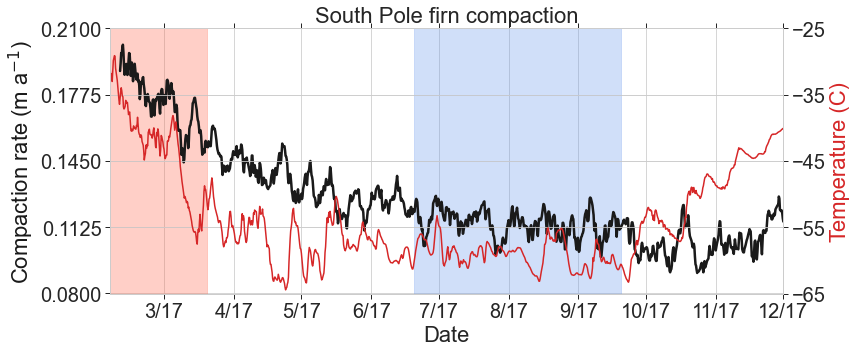

In [31]:
### from matplotlib.dates import date2num
lw = 2.5
ei=-32
# holelist=['1','12','10','11','5','9']
# i1yr = dfp3.index<'2018'
# i2yr = dfp3.index<'2018-12-15'
f1,a1=plt.subplots(figsize=(12,5))
a1.plot(dfp6.index[:ei],dfp3['compaction_rate_yr2'][:ei],color='k',linewidth=lw,label='Hole 1')
a2=a1.twinx()
# a2.plot(dfp5.index,dfp5['T_box6'],color='tab:red')
a2.plot(dft5.index,dft5['Therm_temp1'],color='tab:red')

a1.axvspan(date2num(datetime(2016,12,20)), date2num(datetime(2017,3,20)), label="Summer", color="tomato", alpha=0.3)
a1.axvspan(date2num(datetime(2017,6,20)), date2num(datetime(2017,9,20)), label="Winter", color="cornflowerblue", alpha=0.3)

a1.set_xlabel('Date')
a1.tick_params(labelbottom=False)
a1.tick_params(labelbottom=True)
a1.set_ylabel(r'Compaction rate (m a$^{-1}$)',color='k')
a1.set_title('South Pole firn compaction')
a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
a1.set_xlim(date2num(datetime(2017,2,5)),date2num(datetime(2017,12,1)))
# a1.set_xlim(date2num(datetime(2017,2,5)),date2num(datetime(2017,12,20)))
a1.set_ylim(0.08,0.21)
a2.set_ylim(-65.0,-25)
a1.set_yticks(np.linspace(a1.get_ybound()[0], a1.get_ybound()[1], 5))
a2.set_yticks(np.linspace(a2.get_ybound()[0], a2.get_ybound()[1], 5))
a2.set_ylabel('Temperature (C)',color='tab:red')
# a2.yla
a2.tick_params(labelbottom=False)
# a1.legend()
f1.savefig('CompactionTemp_WinterSummer.pdf')
f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/CompactionTemp_WinterSummer.pdf');

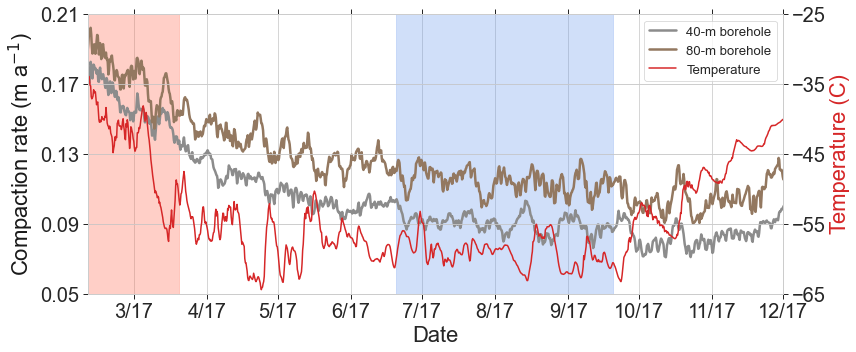

In [32]:
### from matplotlib.dates import date2num
lw = 2.5
ei=-32
f1,a1=plt.subplots(figsize=(12,5))
for ii,hh in enumerate(holelist):
    if hh == '2':
        lbl = '80-m borehole'
        col = palette[5]
    elif hh == '3':
        lbl = '40-m borehole'
        col = palette[7]
    a1.plot(dfp3.index[:ei],dfp3['compaction_rate_yr{}'.format(hh)][:ei],color=col,linewidth=lw,label=lbl)
a2=a1.twinx()
# a2.plot(dfp5.index,dfp5['T_box6'],color='tab:red')
a2.plot(dft5.index,dft5['Therm_temp1'],color='tab:red',label='Temperature')

a1.axvspan(date2num(datetime(2016,12,20)), date2num(datetime(2017,3,20)), color="tomato", alpha=0.3)
a1.axvspan(date2num(datetime(2017,6,20)), date2num(datetime(2017,9,20)), color="cornflowerblue", alpha=0.3)

a1.set_xlabel('Date')
a1.tick_params(labelbottom=False)
a1.tick_params(labelbottom=True)
a1.set_ylabel(r'Compaction rate (m a$^{-1}$)',color='k')
# a1.set_title('South Pole firn compaction')
a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
a1.set_xlim(date2num(dfp3.index[0]),date2num(datetime(2017,12,1)))
# a1.set_xlim(date2num(datetime(2017,2,5)),date2num(datetime(2017,12,20)))
a1.set_ylim(0.05,0.21)
a2.set_ylim(-65.0,-25)
a1.set_yticks(np.linspace(a1.get_ybound()[0], a1.get_ybound()[1], 5))
a2.set_yticks(np.linspace(a2.get_ybound()[0], a2.get_ybound()[1], 5))
a2.set_ylabel('Temperature (C)',color='tab:red')
# a2.yla
a2.tick_params(labelbottom=False)
# a1.legend()
lines, labels = a1.get_legend_handles_labels()
lines2, labels2 = a2.get_legend_handles_labels()
a2.legend(lines + lines2, labels + labels2, loc=0)

f1.savefig('CompactionTemp_WinterSummer.pdf')
f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/Compaction_i2_i3_Temp.pdf');

In [163]:
# f1,a1=plt.subplots(figsize=(12,5))
# a1.plot(dfp5.index,dfp5['T_box1'],color='tab:red')
# a1.tick_params(labelbottom=True)
# a1.axvspan(date2num(datetime(2017,12,20)), date2num(datetime(2018,3,20)), label="Summer", color="tomato", alpha=0.3)
# a1.axvspan(date2num(datetime(2016,12,20)), date2num(datetime(2017,3,20)), label="Summer", color="tomato", alpha=0.3)
# a1.axvspan(date2num(datetime(2017,6,20)), date2num(datetime(2017,9,20)), label="Winter", color="cornflowerblue", alpha=0.3)
# a1.axvspan(date2num(datetime(2018,6,20)), date2num(datetime(2018,9,20)), label="Winter", color="cornflowerblue", alpha=0.3)
# a1.set_ylabel(r'Temperature (C)')
# a1.set_xlabel('Date')
# # a1.set_title('South Pole firn compaction')
# a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%m/%y'))
# a1.set_xlim(date2num(datetime(2017,2,5)),date2num(datetime(2018,12,1)))

In [164]:
# f1,a1=plt.subplots()
# a1.plot(dfp3['compaction_rate1'])

# ------------------------------------
# ------------------------------------
# -------Model Stuff here-------
# ------------------------------------
# ------------------------------------

In [33]:
site='SP50'
datasource='MET'
fils=['rdaily']
figex = '_220825.eps'
fil = 'rdaily'

In [34]:
### load model results  
# thenames = ['HLdynamic','Ligtenberg2011','Li2015','Crocus','GSFC2020','MaxSP','Goujon2003']
KJtest=False
if not KJtest:
    thenames = ['MaxSP','GSFC2020','Ligtenberg2011','Li2015','Crocus','HLdynamic']
else:
    thenames = ['MaxSP40','MaxSP50','MaxSP55','MaxSP60','MaxSP65','MaxSP70']
# thenames = ['MaxSP40']
# thenames = ['Li2015','MaxSP','Li15B']
d = {}
d['SP50']={}
d['SP50']['MET']={}
fdate = '220825'
for ii,name in enumerate(thenames):
    with open('/Volumes/FirnSSD/CFMresults/USP50_{}/CFM_data_SP50_{}_{}.pkl'.format(fdate,fdate,name),'rb') as f:
#     with open('/Volumes/FirnSSD/CFMresults/USP50200306/CFM_data_SP50_200306_{}.pkl'.format(name),'rb') as f:
        dtemp=pickle.load(f)
        d['SP50']['MET'].update(dtemp['SP50']['MET'])
        d['SP50']['MET'][name]['rdaily']['temp_trun'] = d['SP50']['MET'][name]['rdaily']['temperature'][:,::10]
        d['SP50']['MET'][name]['rdaily']['dep_trun'] = d['SP50']['MET'][name]['rdaily']['depth'][:,::10]
#         d[site][datasource][name][fil]['depth'] = np.tile(d[site][datasource][name][fil]['depth'],(len(d[site][datasource][name][fil]['time']),1))

In [35]:
%run -i CFMresults_to_DF.py 

rdaily
MaxSP
GSFC2020
Ligtenberg2011
Li2015
Crocus
HLdynamic


<Figure size 432x288 with 0 Axes>

In [36]:
cra_df3=cra_df.copy()
cra_df3.loc[0]=cra_df3.loc[5]
cra_df3.sort_index(inplace=True)
crd = cra_df3.diff()
crd.drop(0,inplace=True)

holediff = np.diff(np.append(0,hole_l_order))

diff_strainrate_df = crd.divide(holediff,axis=0)
diff_strainrate_df.loc[5]= str_df.loc[5]

cra_df2=cra_df.copy()
cra_df2.loc[0]=0*cra_df2.loc[5]
cra_df2.sort_index(inplace=True)
cra_df_diff=cra_df2.diff()

In [173]:
### PLOT
#### Plot All data in the cra_df
# f1,a1=plt.subplots(figsize=(9,7.5))
# cra_df.plot(ax=a1,style=['s','^','*','o'],ms=12)
# a1.set_xlabel('Depth (m)')
# a1.set_ylabel('Compaction Rate (m a$^{-1}$)')
# a1.set_title('Mean annual compaction rate from \n surface to various depths')
# a1.set_xlim(-2,110)
# f1.savefig('figures/CompactionRate_Annual' + figex)

In [174]:
### PLOT
# f1,a1=plt.subplots(figsize=(9,6))
# # cra_df.plot(ax=a1,style=['s','^','*','o'],ms=12)
# a1.scatter(cra_df.index,cra_df['HLdynamic_rloop-con'],label='H&L, $\dot{b}$ constant',color=hcolor,marker='^')
# a1.scatter(cra_df.index,cra_df['HLdynamic_rloop-1'],label='H&L, $\dot{b}$ step change',color=hcolor,marker='o')
# a1.scatter(cra_df.index,cra_df['Goujon2003_rloop-con'],label='Goujon, $\dot{b}$ constant',color=gcolor,marker='^')
# a1.scatter(cra_df.index,cra_df['Goujon2003_rloop-1'],label='Goujon, $\dot{b}$ step change',color=gcolor,marker='o')
# a1.scatter(cra_df.index,cra_df['data'],label='Data',marker='*',color=datacolor,s=144)
# a1.set_xlabel('Depth (m)')
# a1.set_ylabel('Compaction Rate (m a$^{-1}$)')
# a1.set_title('Mean annual compaction rate from \n surface to various depths')
# a1.legend(loc=4,fontsize='large',frameon=True,framealpha=0.5,facecolor='w')
# f1.savefig('figures/CompactionRate_Annual' + figex)

In [175]:
### PLOT
# f1,a1=plt.subplots(figsize=(9,6))
# str_df.plot(ax=a1,style=['s','^','*','o'],ms=12)
# a1.set_xlabel('Depth (m)')
# a1.set_ylabel('Strain Rate (a$^{-1}$)')
# a1.set_xlim(-2,110)
# a1.set_title('Mean annual strain rate from \n surface to various depths')
# f1.savefig('figures/StrainRate_Annual' + figex)

In [37]:
dfp6daily_roll = dfp6.rolling(28,win_type='gaussian',center=True).mean(std=28/3)
# dfp6daily_roll = dfp6.rolling(20,win_type='boxcar',center=True).mean()

In [38]:
# xx = dfp6.pot_length_unfilt1.values
# xxi = np.where(xx[:-1]/xx[1:]>1.001)[0]
# dfp6.iloc[xxi+1,dfp6.columns.get_loc('pot_length_unfilt1')] = np.nan
# dfp6daily = dfp6.resample('d',loffset='12H').mean()
yy=np.gradient(dfp6daily_roll.pot_length_unfilt1.values,3600*24*5)
xx=dfp6.pot_length_unfilt1.values

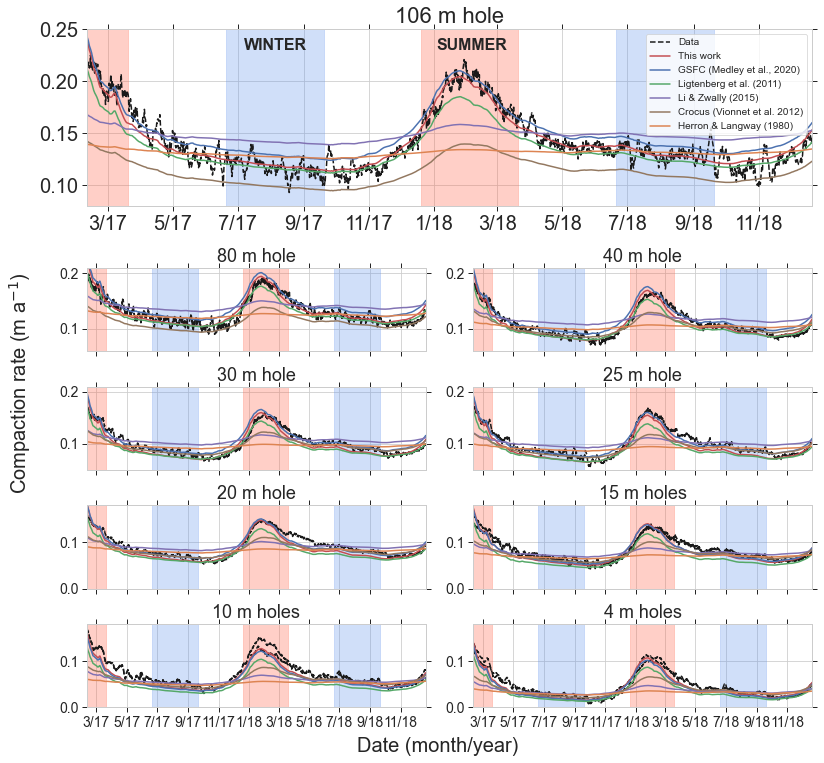

In [39]:
warnings.filterwarnings("ignore") 
plotmodel = True
%run -i singlehole_panelplot.py

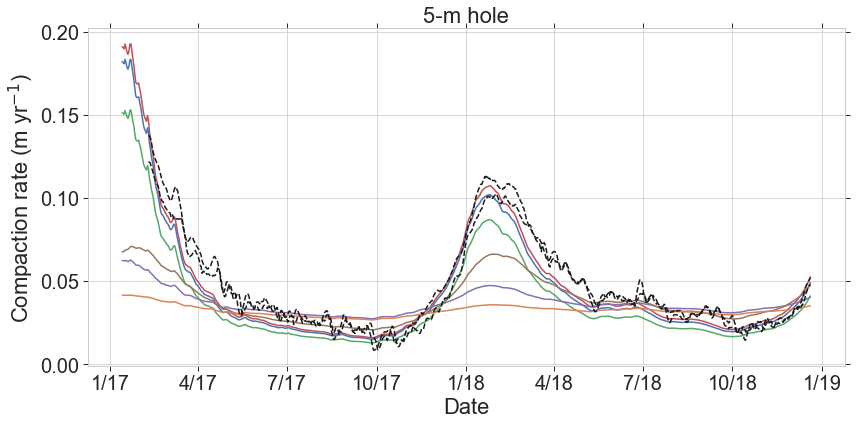

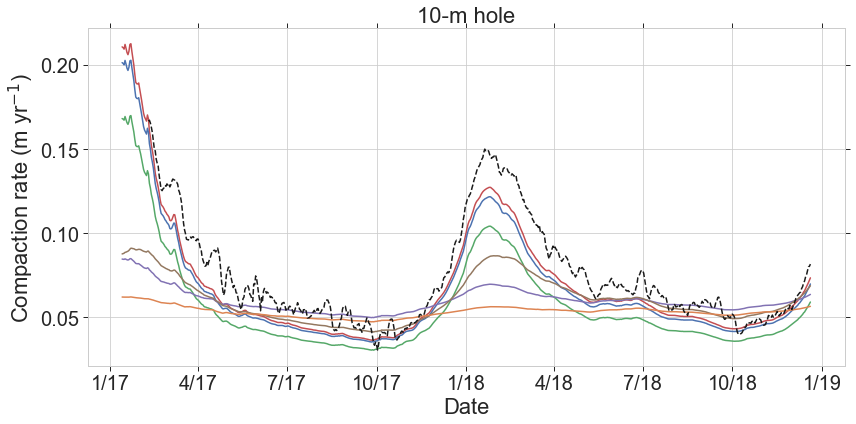

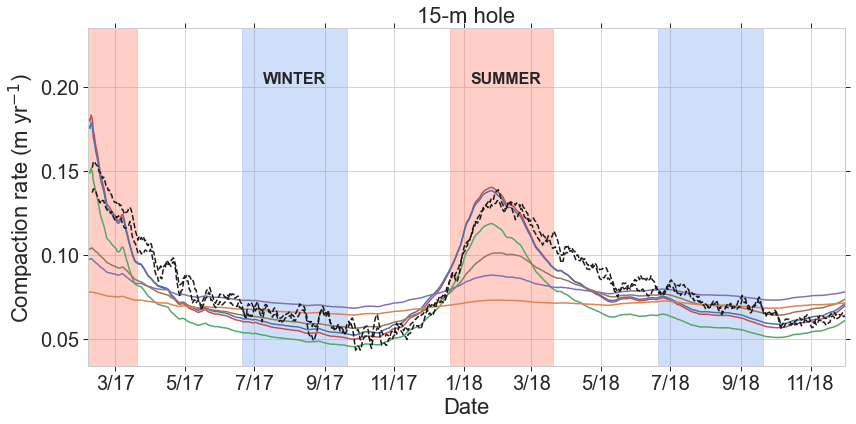

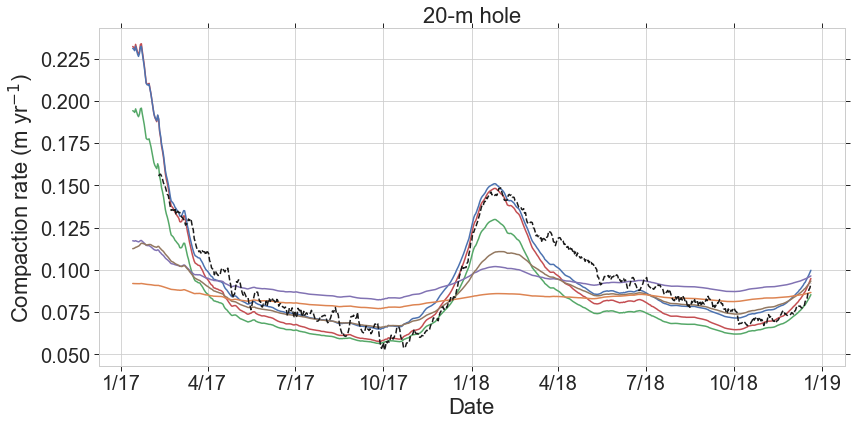

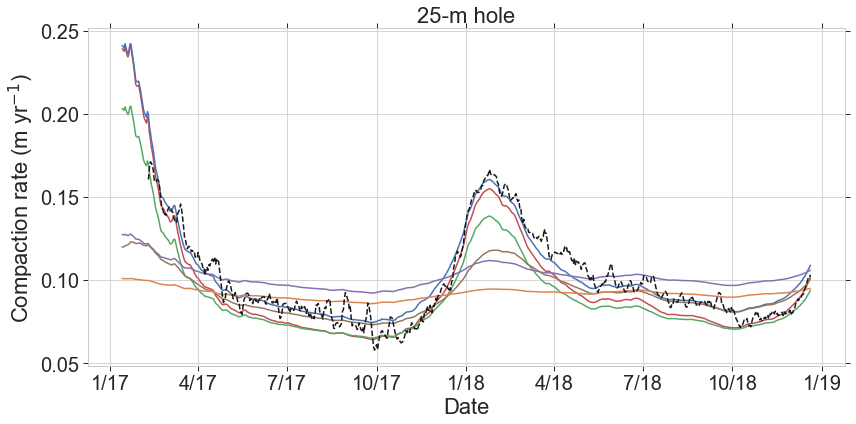

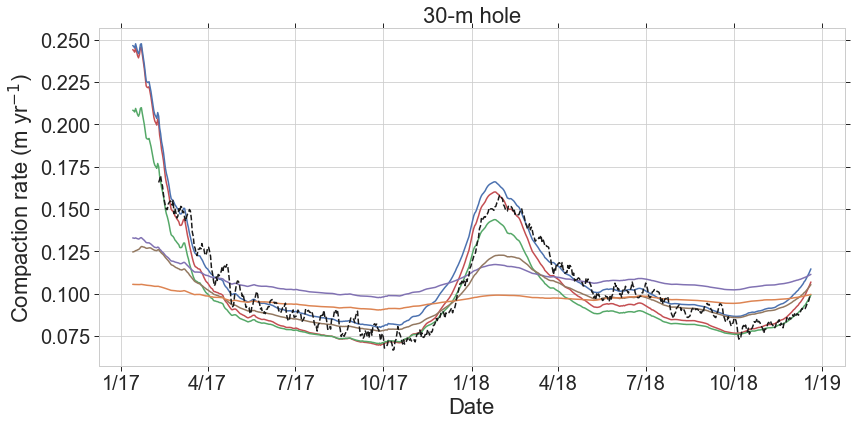

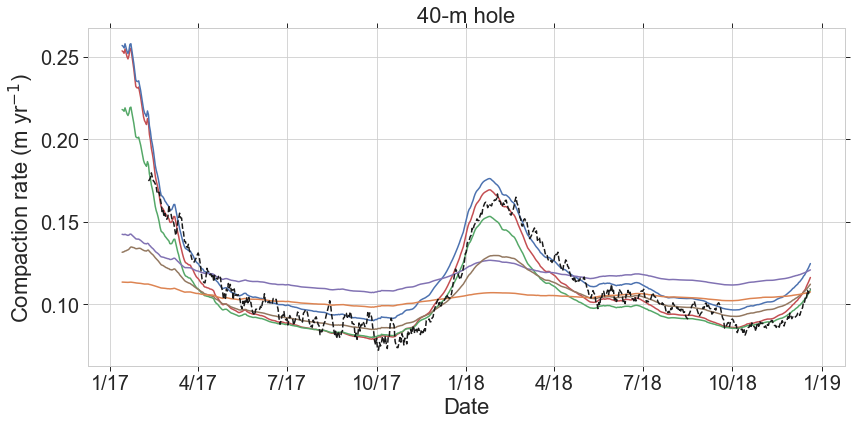

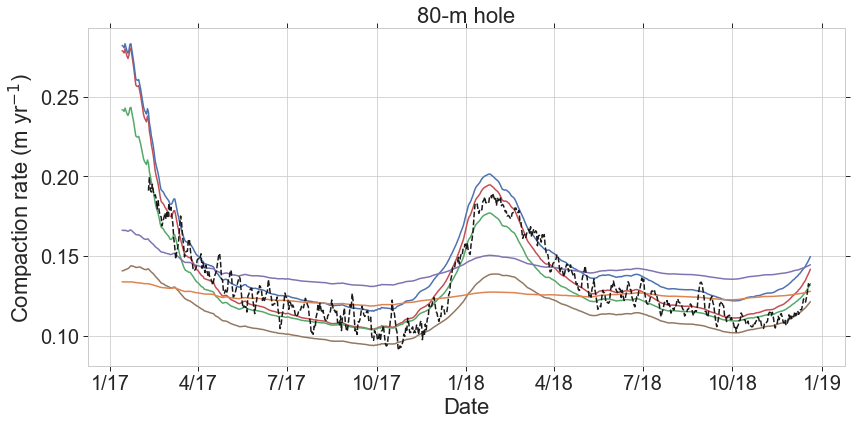

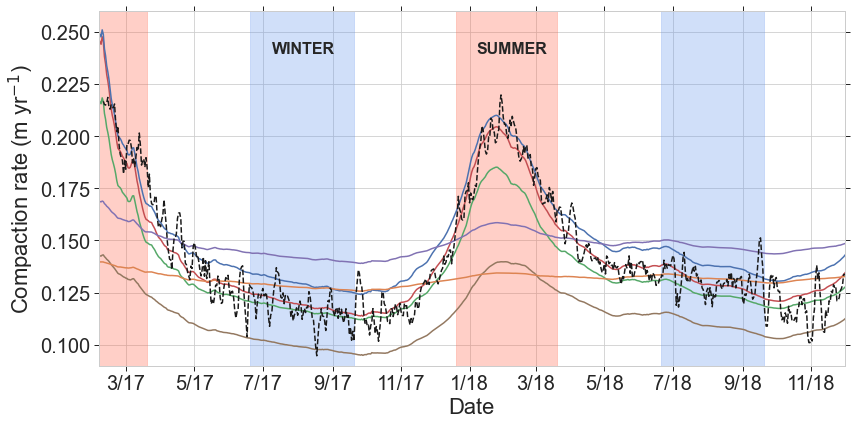

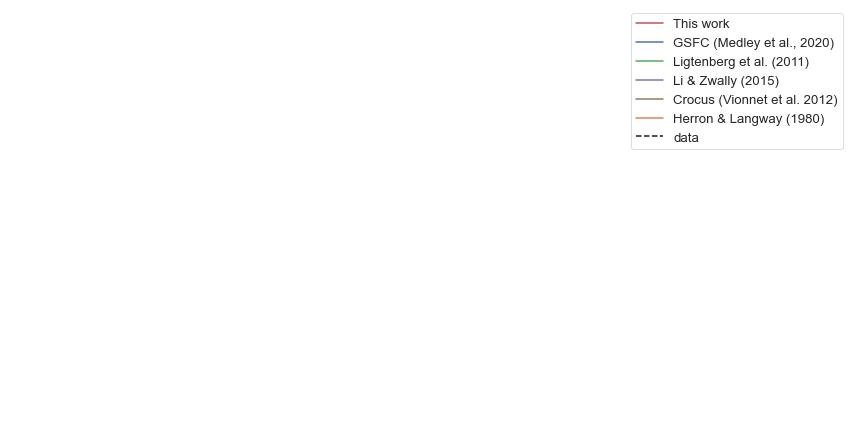

In [40]:
%run -i singleholeplots.py

2017-02-09 12:00:00
2018-12-21 00:00:00


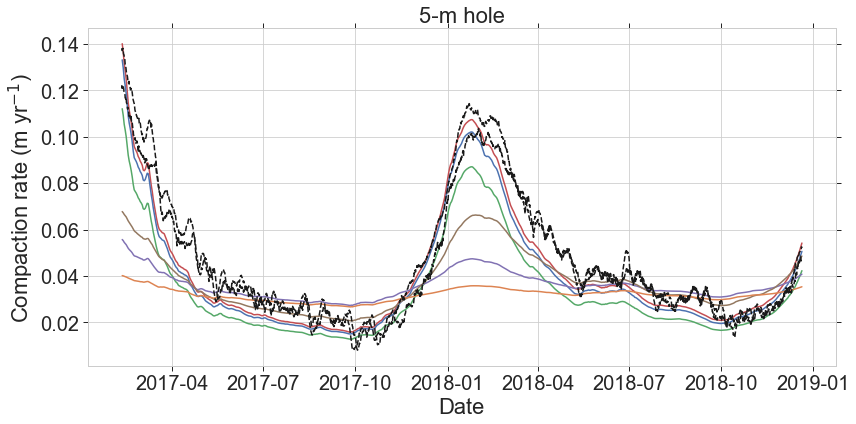

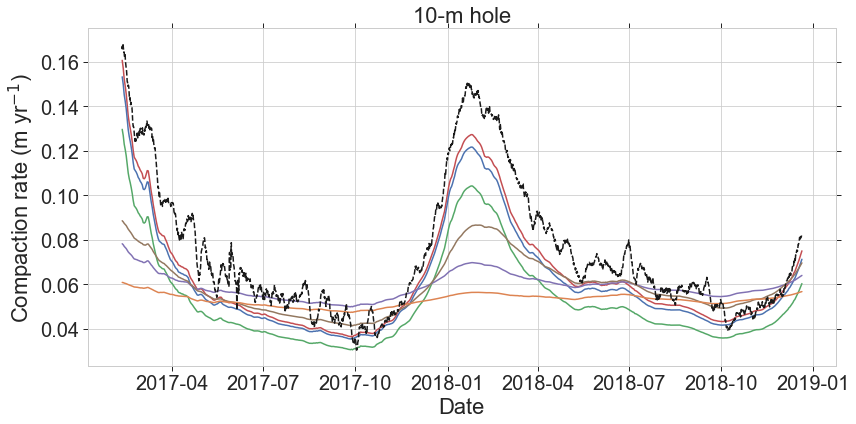

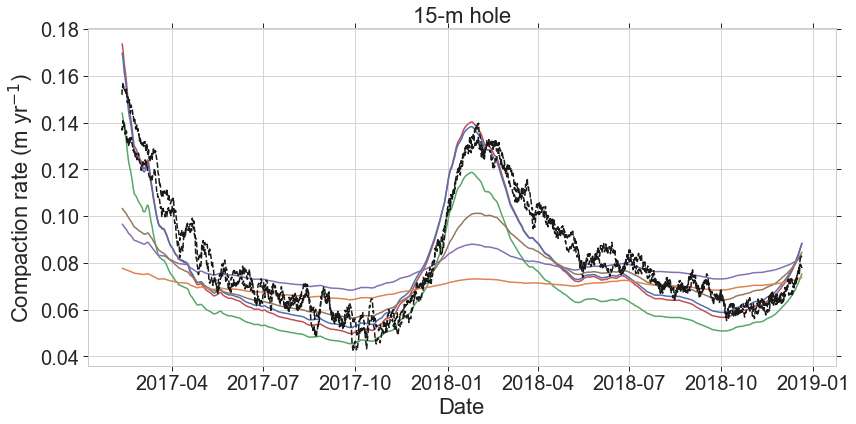

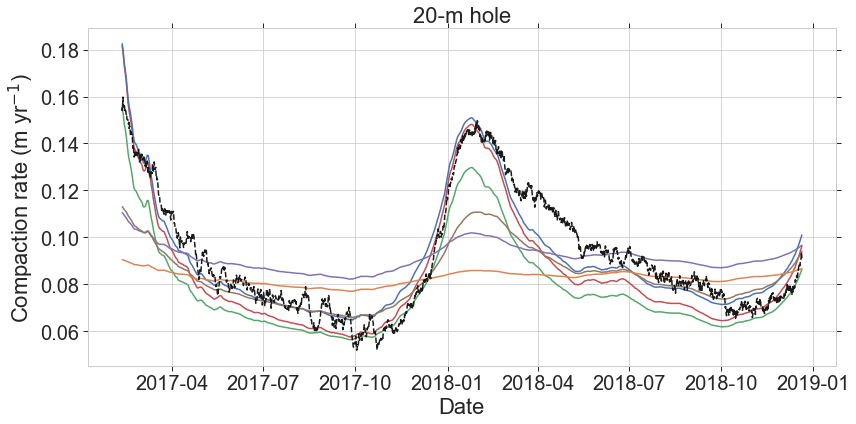

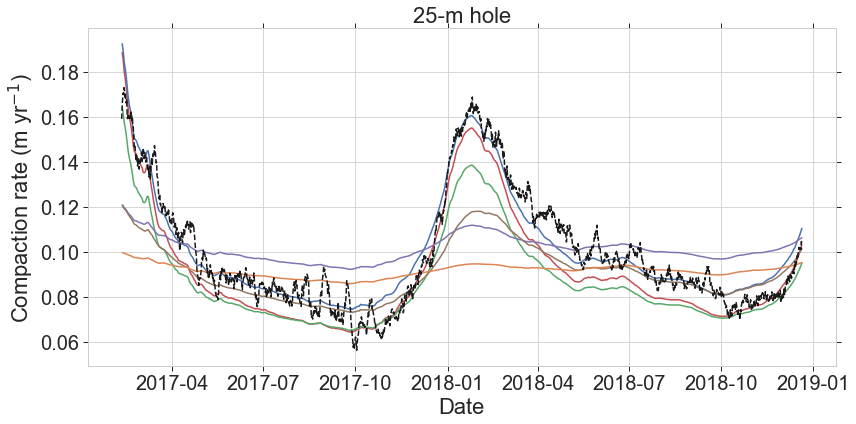

...

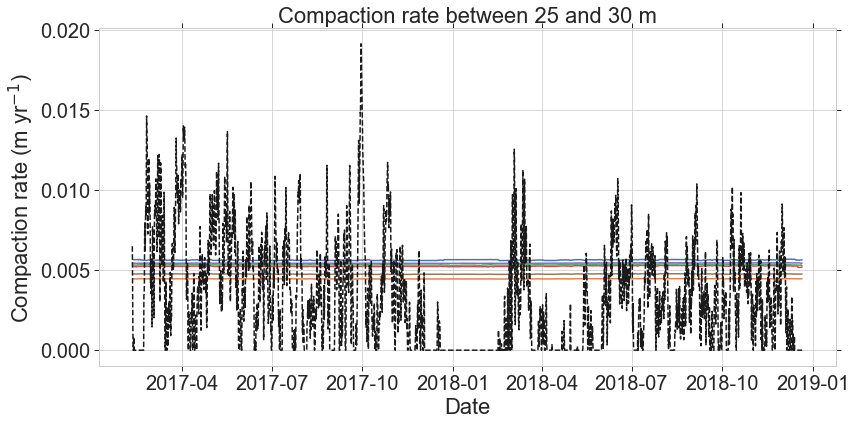

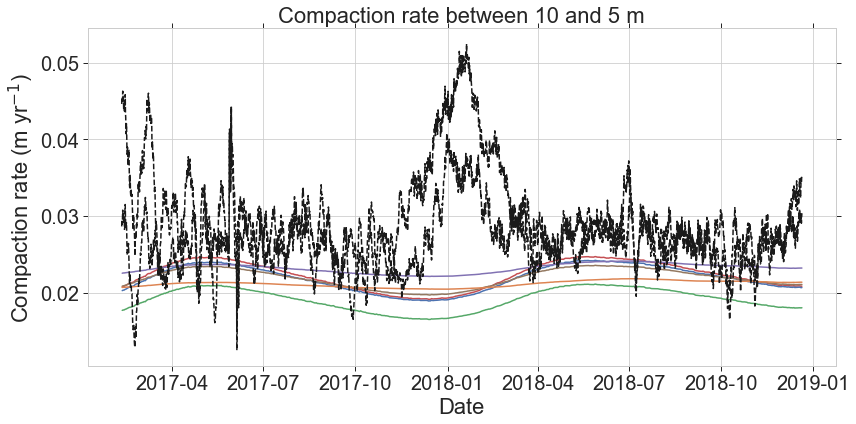

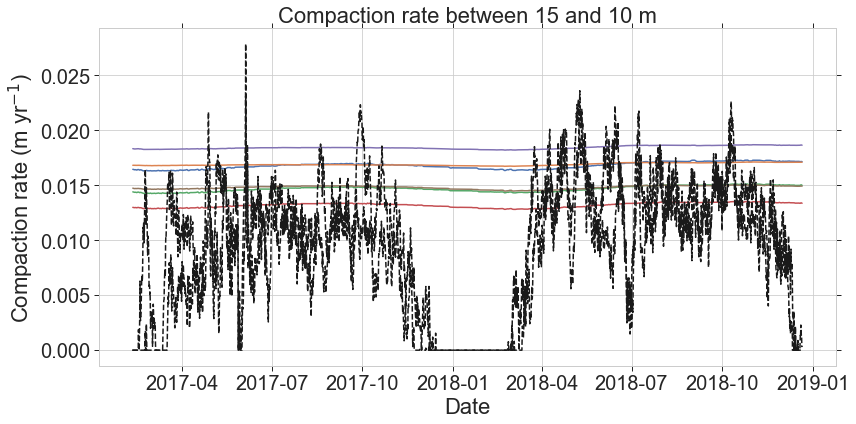

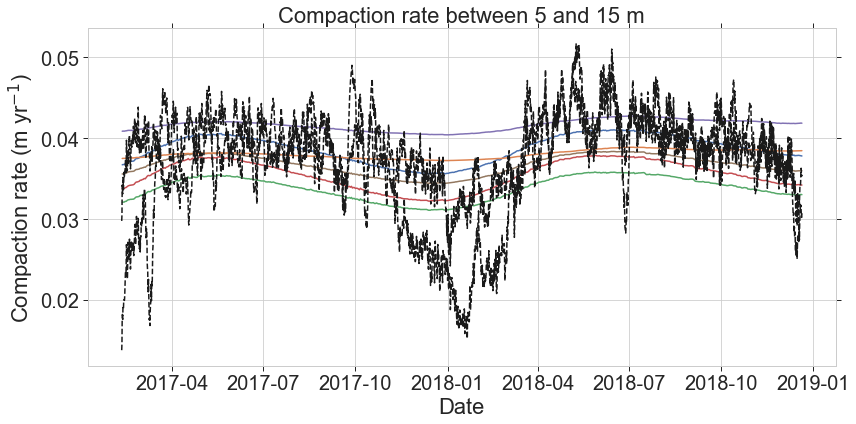

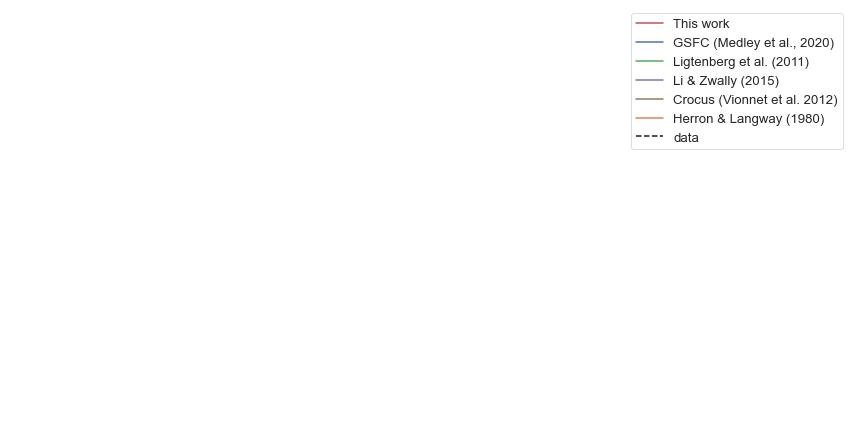

In [41]:
%run -i tonsofplots1.py

In [42]:
dft_1m = dft5.resample("1M").mean()['2017-10':'2018-5']

In [216]:
#Hole dep, hole (instrument) number, Model, date start, date end
# rmscalc_daily(106,6,'HLdynamic','2017-02-09','2018-12-10')

In [217]:
# rmscalc_daily(40,getINU(40),'MaxSP','2017-02-09','2018-12-10')

In [218]:
# rmscalc_daily(40,getINU(40),'MaxSP','2017-03-01','2018-12-10')

In [43]:
rmscalc(106,6,data_decimaldates,tsteps,dfp3,d2,'MaxSP')

(0.00872908559016373,
 0.06337536167725429,
 0.13796557600568227,
 0.13773626467991645)

In [44]:
rmse_df = pd.DataFrame(index=thenames)
rmsp_df = pd.DataFrame(index=thenames)
# INU_l = [getINU(pp) for pp in dps]
for HD in dps:
    INU = getINU(HD)
    if type(INU) is tuple:
        inutu = True
        INU1 = INU[1]
        INU0 = INU[0]
    else:
        INU0 = INU
    rmse_l = [rmscalc(HD,INU0,data_decimaldates,tsteps,dfp3,d2,MN)[0] for MN in thenames]
    rmsp_l = [rmscalc(HD,INU0,data_decimaldates,tsteps,dfp3,d2,MN)[1] for MN in thenames]
    rmse_df[HD] = rmse_l
    rmsp_df[HD] = rmsp_l
#     print(rms_l)
    

In [45]:
with pd.option_context('display.float_format', '{:0.3f}'.format):
    print((rmse_df).to_latex())

\begin{tabular}{lrrrrrrrrr}
\toprule
{} &   5   &   10  &   15  &   20  &   25  &   30  &   40  &   80  &   106 \\
\midrule
MaxSP          & 0.008 & 0.012 & 0.011 & 0.011 & 0.011 & 0.009 & 0.008 & 0.008 & 0.009 \\
GSFC2020       & 0.009 & 0.015 & 0.010 & 0.008 & 0.007 & 0.009 & 0.010 & 0.013 & 0.013 \\
Ligtenberg2011 & 0.013 & 0.023 & 0.018 & 0.016 & 0.015 & 0.012 & 0.010 & 0.010 & 0.012 \\
Li2015         & 0.019 & 0.026 & 0.018 & 0.019 & 0.020 & 0.018 & 0.020 & 0.021 & 0.023 \\
Crocus         & 0.013 & 0.021 & 0.014 & 0.014 & 0.015 & 0.012 & 0.013 & 0.022 & 0.031 \\
HLdynamic      & 0.023 & 0.031 & 0.023 & 0.022 & 0.023 & 0.020 & 0.021 & 0.021 & 0.025 \\
\bottomrule
\end{tabular}



In [46]:
with pd.option_context('display.float_format', '{:0.1f}'.format):
    print((rmsp_df*100).to_latex())

\begin{tabular}{lrrrrrrrrr}
\toprule
{} &  5   &  10  &  15  &  20  &  25  &  30  &  40  &  80  &  106 \\
\midrule
MaxSP          & 19.5 & 17.5 & 13.1 & 12.2 & 11.1 &  9.3 &  7.4 &  6.6 &  6.3 \\
GSFC2020       & 22.1 & 21.1 & 12.3 &  9.3 &  7.2 &  8.9 &  9.6 & 10.4 &  9.3 \\
Ligtenberg2011 & 32.2 & 32.8 & 22.2 & 18.0 & 15.5 & 12.0 &  9.7 &  7.8 &  8.9 \\
Li2015         & 46.2 & 36.7 & 21.9 & 21.0 & 20.5 & 18.8 & 19.2 & 16.8 & 16.9 \\
Crocus         & 31.6 & 29.7 & 16.9 & 15.7 & 15.8 & 12.0 & 12.1 & 16.9 & 22.2 \\
HLdynamic      & 55.2 & 44.0 & 28.0 & 24.9 & 23.6 & 20.0 & 19.5 & 16.4 & 17.9 \\
\bottomrule
\end{tabular}



In [223]:
thenames

['MaxSP', 'GSFC2020', 'Ligtenberg2011', 'Li2015', 'Crocus', 'HLdynamic']

In [47]:
### This is the % rmse for each model for each hole
rmsp_df_trun = (rmsp_df*100).loc[['GSFC2020','Ligtenberg2011', 'Li2015', 'Crocus', 'HLdynamic'],[30,40,80,106]].round(2).rename(index={'MaxSP':'This Work'})

In [48]:
rmsp_df_trun

,30,40,80,106
GSFC2020,8.86,9.61,10.40,9.30
Ligtenberg2011,11.98,9.72,7.81,8.91
Li2015,18.75,19.24,16.75,16.86
Crocus,11.97,12.08,16.92,22.21
HLdynamic,19.99,19.48,16.42,17.87


In [49]:
cc106 = (dfp3['compaction{}'.format(INU)]-dfp3['compaction{}'.format(INU)][0])
cc10 = (dfp3['compaction11']-dfp3['compaction11'][0])


In [50]:
dfp3['compaction{}'.format(INU)]

TIMESTAMP
2017-02-09 12:00:00    0.000150
2017-02-09 18:00:00    0.000299
2017-02-10 00:00:00    0.000444
2017-02-10 06:00:00    0.000591
2017-02-10 12:00:00    0.000737
                         ...   
2018-12-20 00:00:00    0.261843
2018-12-20 06:00:00    0.261941
2018-12-20 12:00:00    0.262038
2018-12-20 18:00:00    0.262134
2018-12-21 00:00:00    0.262237
Name: compaction6, Length: 2719, dtype: float64

In [51]:
# Total compaction in the 106 m hole
(dfp3['compaction{}'.format(INU)]-dfp3['compaction{}'.format(INU)][0])[-1]

0.2620866285285402

In [52]:
# Compaction, per year
0.269/686*365

0.1431268221574344

In [53]:
for ii in np.arange(1,13):
    print(ii)
    print(dfp3.index[0])
    print(dfp3.index[-1])
    print(dfp3['compaction{}'.format(ii)][0])
    print(dfp3['compaction{}'.format(ii)][-1])
    print(dfp3['compaction{}'.format(ii)][-1]-dfp3['compaction{}'.format(ii)][0])

1
2017-02-09 12:00:00
2018-12-21 00:00:00
8.350202925250239e-05
0.08285259272036544
0.08276909069111293
2
2017-02-09 12:00:00
2018-12-21 00:00:00
0.00013018111111501307
0.24248455619716106
0.24235437508604604
3
2017-02-09 12:00:00
2018-12-21 00:00:00
0.00012014170226237741
0.20198377371997123
0.20186363201770885
4
2017-02-09 12:00:00
2018-12-21 00:00:00
0.00011331751011106617
0.18845152929911946
0.1883382117890084
5
2017-02-09 12:00:00
2018-12-21 00:00:00
0.00010502077022167544
0.15520114960249604
0.15509612883227436
6
2017-02-09 12:00:00
2018-12-21 00:00:00
0.0001500525739038805
0.2622366811024441
0.2620866285285402
7
2017-02-09 12:00:00
2018-12-21 00:00:00
0.00010565664004974495
0.17027753241649823
0.1701718757764485
8
2017-02-09 12:00:00
2018-12-21 00:00:00
0.00010719072466075508
0.18532378719428017
0.1852165964696194
9
2017-02-09 12:00:00
2018-12-21 00:00:00
9.473475856131008e-05
0.1485983963394511
0.1485036615808898
10
2017-02-09 12:00:00
2018-12-21 00:00:00
nan
0.1325505433219801

In [54]:
dfp3['compaction_rate_yr6'].max()/dfp3['compaction_rate_yr6'].min()

2.4154019849570973

In [55]:
dfp3['11-2017':]['compaction_rate_yr6'].max()

0.22080341413361249

In [56]:
dfp3[['compaction_rate_yr6','compaction_rate_yr1','compaction_rate_yr12']].describe()

,compaction_rate_yr6,compaction_rate_yr1,compaction_rate_yr12
count,2719.000000,2719.000000,2719.000000
mean,0.140893,0.044505,0.047111
std,0.028146,0.025288,0.028823
min,0.093239,0.008044,0.008253
25%,0.121195,0.026364,0.026227
50%,0.132653,0.035175,0.036737
75%,0.151516,0.055245,0.061006
max,0.225210,0.122184,0.138078


In [57]:
dfp3['11-2017':][dfp3['11-2017':]['compaction_rate_yr6']==dfp3['11-2017':]['compaction_rate_yr6'].max()]['compaction_rate_yr6']

TIMESTAMP
2018-01-29    0.220803
Name: compaction_rate_yr6, dtype: float64

In [58]:
filter_days

14

In [59]:
pot_data_all.iloc[-2870:]

,TIMESTAMP,RECORD,Pots1,Pots2,Pots3,Pots4,Pots5,Pots6,Pots7,Pots8,...,Therms6,Therms7,Therms8,Therms9,Therms10,Therms11,Therms12,LoggerT,BattV_Min,PTemp_C
2887,2017-01-06 12:00:00,1,0.030947,0.031695,0.031695,0.031423,0.030471,0.030675,0.030471,0.030607,...,0.000884,0.000952,0.001020,0.001564,0.001632,0.936848,0.001632,0.066247,14.52,-12.34
2888,2017-01-06 18:00:00,2,0.031759,0.032439,0.032507,0.032303,0.031215,0.031487,0.031079,0.031215,...,0.000952,0.000952,0.001020,0.001632,0.001700,0.925765,0.001632,0.060932,14.33,-10.93
2889,2017-01-07 00:00:00,3,0.031554,0.032302,0.032506,0.032234,0.030942,0.031146,0.031418,0.031418,...,0.000952,0.000952,0.000952,0.001700,0.001700,0.882353,0.001700,0.058620,14.38,-10.21
2890,2017-01-07 06:00:00,4,0.030263,0.030943,0.031215,0.030943,0.029719,0.029855,0.030127,0.030127,...,0.000952,0.001020,0.000952,0.002040,0.943655,0.881973,0.002040,0.056580,14.43,-9.48
2891,2017-01-07 12:00:00,5,0.032098,0.032642,0.032914,0.032642,0.031350,0.031690,0.031622,0.031622,...,0.000952,0.000952,0.001020,0.002176,0.937437,0.889698,0.002176,0.057124,14.20,-9.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5752,2018-12-23 18:00:00,2866,0.568159,0.415052,0.385016,0.455372,0.378546,0.300902,0.432215,0.520075,...,0.724672,0.730802,0.739928,0.745513,0.008037,0.762745,0.760088,0.145479,14.53,-27.90
5753,2018-12-24 00:00:00,2867,0.568159,0.414779,0.384880,0.455372,0.378546,0.300902,0.432011,0.519666,...,0.725762,0.731687,0.740746,0.746331,0.006811,0.763289,0.760701,0.145207,14.73,-27.83
5754,2018-12-24 06:00:00,2868,0.568023,0.414779,0.384812,0.455100,0.378546,0.300902,0.431943,0.519666,...,0.726511,0.732437,0.741699,0.747012,0.007696,0.763698,0.761110,0.145207,14.40,-27.83
5755,2018-12-24 12:00:00,2869,0.568023,0.414507,0.384539,0.454827,0.378273,0.300085,0.431943,0.519666,...,0.727465,0.733186,0.742312,0.747625,0.007560,0.764107,0.761451,0.144934,14.60,-27.79


In [60]:
dfp4

,RECORD,hole_length1,strain1,strain_rate1,stress_holebot1,viscosity1,hole_length2,strain2,strain_rate2,stress_holebot2,...,hole_length11,strain11,strain_rate11,stress_holebot11,viscosity11,hole_length12,strain12,strain_rate12,stress_holebot12,viscosity12
TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2017-02-09 12:00:00,137,4.149916,-0.000020,-9.324800e-10,-17766.913412,9.526699e+12,79.749870,-0.000002,-7.515856e-11,-472851.801748,...,9.599886,-0.000012,-5.503082e-10,-43226.786056,3.927507e+13,4.169905,-0.000023,-1.049287e-09,-17861.13096,8.511076e+12
2017-02-09 18:00:00,138,4.149833,-0.000040,-9.275763e-10,-17766.913412,9.577064e+12,79.749741,-0.000003,-7.665882e-11,-472851.801748,...,9.599772,-0.000024,-5.506820e-10,-43226.786056,3.924841e+13,4.169811,-0.000045,-1.043467e-09,-17861.13096,8.558549e+12
2017-02-10 00:00:00,139,4.149750,-0.000060,-9.223169e-10,-17766.913412,9.631675e+12,79.749606,-0.000005,-7.863705e-11,-472851.801748,...,9.599658,-0.000036,-5.477951e-10,-43226.786056,3.945525e+13,4.169717,-0.000068,-1.041306e-09,-17861.13096,8.576313e+12
2017-02-10 06:00:00,140,4.149667,-0.000080,-9.299226e-10,-17766.913412,9.552899e+12,79.749470,-0.000007,-7.851963e-11,-472851.801748,...,9.599545,-0.000047,-5.503174e-10,-43226.786056,3.927441e+13,4.169623,-0.000090,-1.042262e-09,-17861.13096,8.568445e+12
2017-02-10 12:00:00,141,4.149584,-0.000100,-9.313626e-10,-17766.913412,9.538129e+12,79.749335,-0.000008,-7.973471e-11,-472851.801748,...,9.599430,-0.000059,-5.553358e-10,-43226.786056,3.891950e+13,4.169529,-0.000113,-1.044759e-09,-17861.13096,8.547966e+12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-20 00:00:00,2851,4.067276,-0.020135,-3.684358e-10,-17766.913412,2.411127e+13,79.507880,-0.003041,-5.222946e-11,-472851.801748,...,9.462190,-0.014459,-2.724517e-10,-43226.786056,7.932928e+13,4.082437,-0.021222,-4.007583e-10,-17861.13096,2.228417e+13
2018-12-20 06:00:00,2852,4.067244,-0.020143,-3.622544e-10,-17766.913412,2.452271e+13,79.507790,-0.003042,-5.302902e-11,-472851.801748,...,9.462134,-0.014465,-2.727956e-10,-43226.786056,7.922925e+13,4.082402,-0.021230,-4.013959e-10,-17861.13096,2.224877e+13
2018-12-20 12:00:00,2853,4.067212,-0.020150,-3.679308e-10,-17766.913412,2.414437e+13,79.507698,-0.003043,-5.300718e-11,-472851.801748,...,9.462079,-0.014471,-2.730559e-10,-43226.786056,7.915373e+13,4.082366,-0.021239,-4.073336e-10,-17861.13096,2.192445e+13


5
10
15
20
25
30
40
80
106


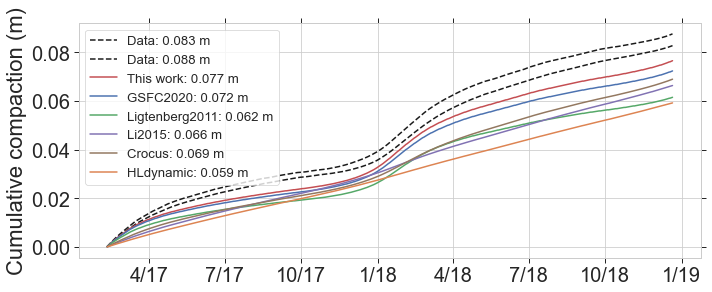

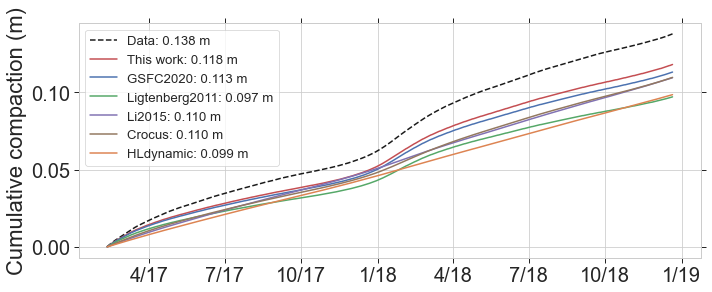

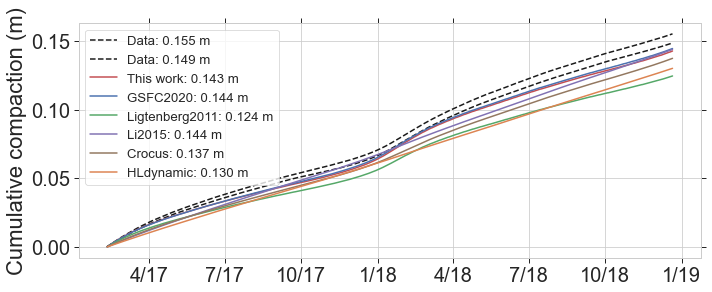

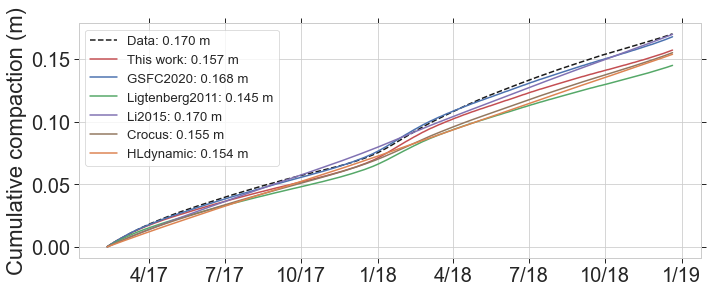

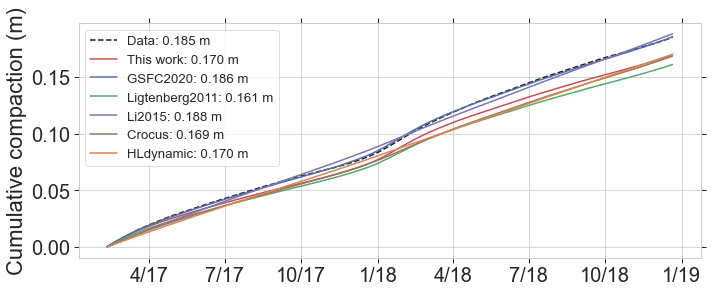

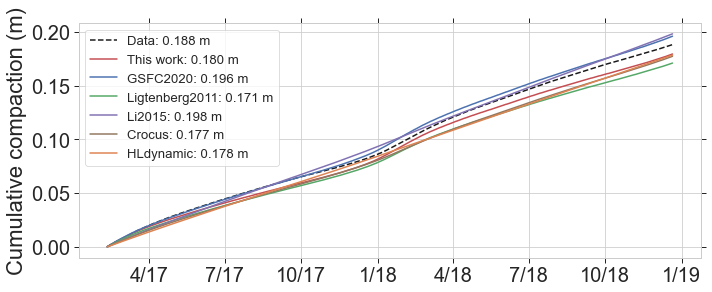

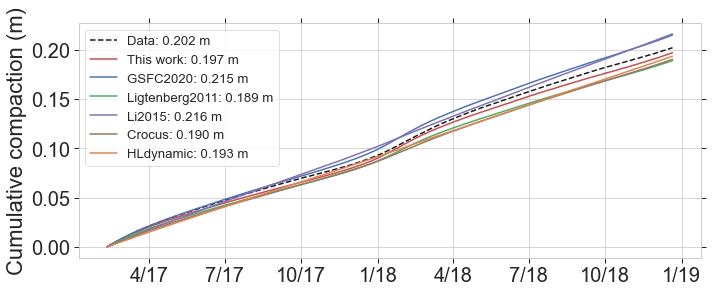

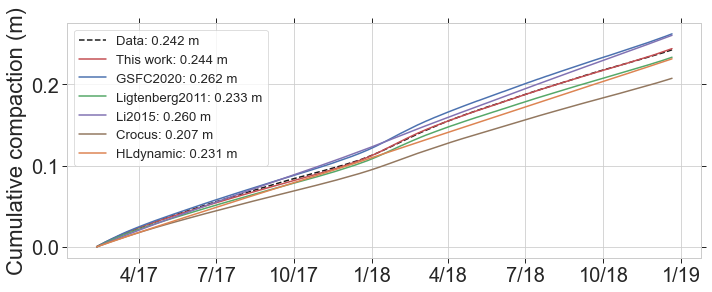

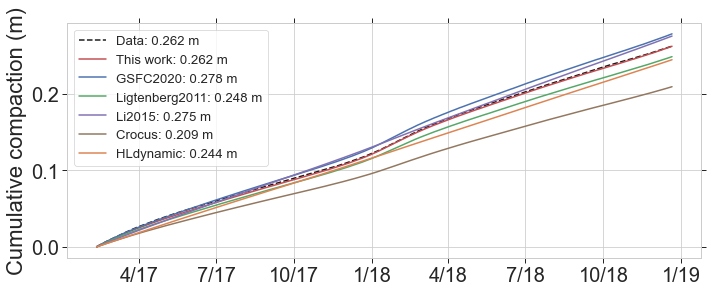

In [61]:
# HL = 15
for HL in dps:
    print(HL)
    INU = getINU(HL)
    if type(INU) is tuple:
        inutu = True
        INU1 = INU[1]
        INU0 = INU[0]
    else:
        inutu = False
    dtA = dfp3.index[0]
    dtB = dfp3.index[-1]
    f1,a1=plt.subplots(figsize=(10,4))
    if not inutu:
        ccd = (dfp3['compaction{}'.format(INU)]-dfp3['compaction{}'.format(INU)][0])[-1]
        dlab = 'Data: {:.3f} m'.format(ccd)
        a1.plot(dfp3.index,dfp3['compaction{}'.format(INU)]-dfp3['compaction{}'.format(INU)][0],color='k',ls='--',label=dlab)
    else:
        ccd0 = (dfp3['compaction{}'.format(INU0)]-dfp3['compaction{}'.format(INU0)][0])[-1]
        dlab0 = 'Data: {:.3f} m'.format(ccd0)
        ccd1 = (dfp3['compaction{}'.format(INU1)]-dfp3['compaction{}'.format(INU1)][0])[-1]
        dlab1 = 'Data: {:.3f} m'.format(ccd1)
        a1.plot(dfp3.index,dfp3['compaction{}'.format(INU0)]-dfp3['compaction{}'.format(INU0)][0],color='k',ls='--',label=dlab0)
        a1.plot(dfp3.index,dfp3['compaction{}'.format(INU1)]-dfp3['compaction{}'.format(INU1)][0],color='k',ls='--',label=dlab1)
    # print('data:', )
    for mname in thenames:
        ccc = (d2[fil][mname][dtA:dtB]['dlen{}'.format(HL)]-d2[fil][mname][dtA:dtB]['dlen{}'.format(HL)][0])[-1]
        colo, legname = get_plotdeets(mname)
        if mname=='MaxSP':
            labeln = 'This work: {:.3f} m'.format(ccc)
        else:
            labeln = mname + ': {:.3f} m'.format(ccc)
        a1.plot(d2[fil][mname][dtA:dtB].index,d2[fil][mname][dtA:dtB]['dlen{}'.format(HL)]-d2[fil][mname][dtA:dtB]['dlen{}'.format(HL)][0],label=labeln,color=colo)     
    #     print(mname)
    #     print(mname,ccc)
    a1.legend();
    a1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
    a1.set_ylabel('Cumulative compaction (m)');
#     a1.set_title('{} m hole'.format(HL));
    f1.savefig('CumulativeComp_{}.pdf'.format(HL));
    f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/CumulativeComp_{}.pdf'.format(HL));
# a1.set_ylim(0.2,0.25)


In [62]:
for mname in thenames:
    print(mname)
    print((d2[fil][mname][dtA:dtB].dlen80-d2[fil][mname][dtA:dtB].dlen80[0])[-1])

MaxSP
0.2437744140625
GSFC2020
0.26197052001953125
Ligtenberg2011
0.233184814453125
Li2015
0.2602081298828125
Crocus
0.20731353759765625
HLdynamic
0.2312469482421875


In [63]:
# d2[fil]['MaxSP'][dtA:dtB]

In [87]:
# (np.sum(((d2[fil][name]['crate5'][idds:idde]) - (dfp_daily.compaction_rate_yr1[idds:idde].values))**2)/len(d2[fil][name]['crate5'][idds:idde]))**(1/2)    

In [88]:
# rmscalc(20,7,data_decimaldates,tsteps,dfp3,d2,'MaxSP')

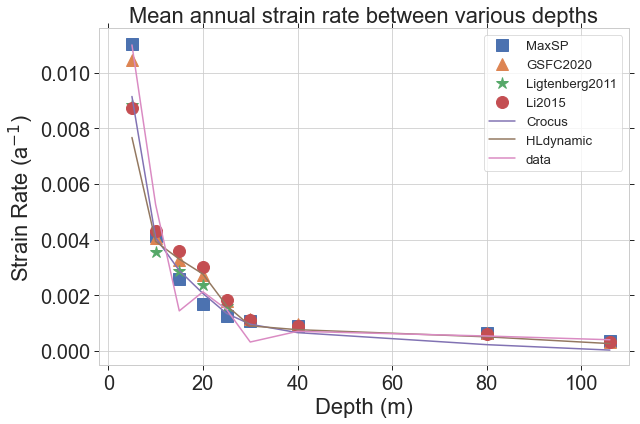

In [64]:
### PLOT
f1,a1=plt.subplots(figsize=(9,6))
diff_strainrate_df.plot(ax=a1,style=['s','^','*','o'],ms=12)
a1.set_xlabel('Depth (m)')
a1.set_ylabel('Strain Rate (a$^{-1}$)')
a1.set_xlim(-2,110)
a1.set_title('Mean annual strain rate between various depths')
f1.savefig('figures/StrainRateDifferential_Annual' + figex)

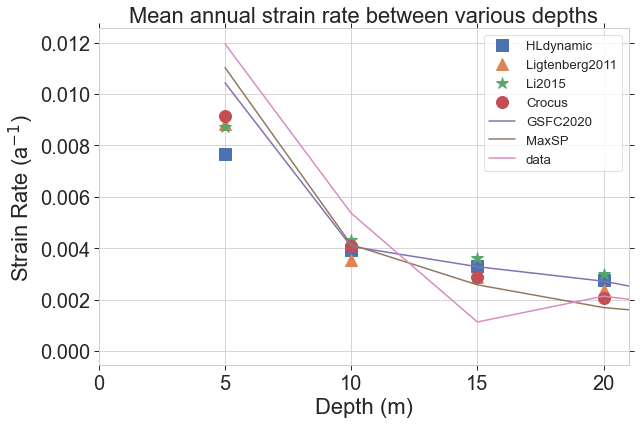

In [124]:
### PLOT
f1,a1=plt.subplots(figsize=(9,6))
diff_strainrate_df.plot(ax=a1,style=['s','^','*','o'],ms=12)
a1.set_xlabel('Depth (m)')
a1.set_ylabel('Strain Rate (a$^{-1}$)')
a1.set_title('Mean annual strain rate between various depths')
a1.set_xlim(0,21)
f1.savefig('figures/StrainRateDifferential_Annual_zoom020' + figex)

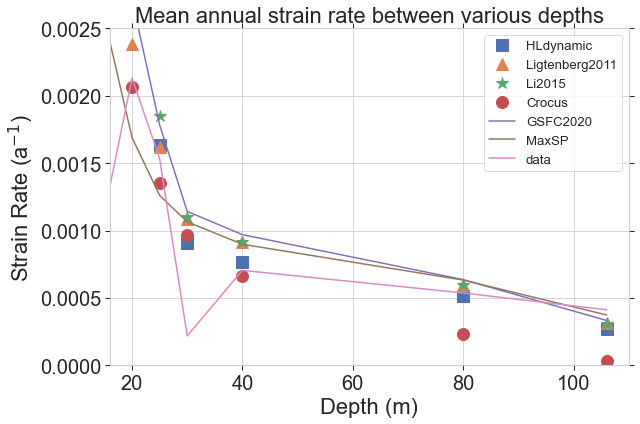

In [125]:
### PLOT
f1,a1=plt.subplots(figsize=(9,6))
diff_strainrate_df.plot(ax=a1,style=['s','^','*','o'],ms=12)
a1.set_xlabel('Depth (m)')
a1.set_ylabel('Strain Rate (a$^{-1}$)')
a1.set_title('Mean annual strain rate between various depths')
a1.set_xlim(16,110)
a1.set_ylim(0,0.0025)
f1.savefig('figures/StrainRateDifferential_Annual_zoom16106' + figex)

In [126]:
diff_strainrate_df2 = diff_strainrate_df.copy()
diff_strainrate_df2.loc[0]=diff_strainrate_df2.loc[5]
diff_strainrate_df2.sort_index(inplace=True)

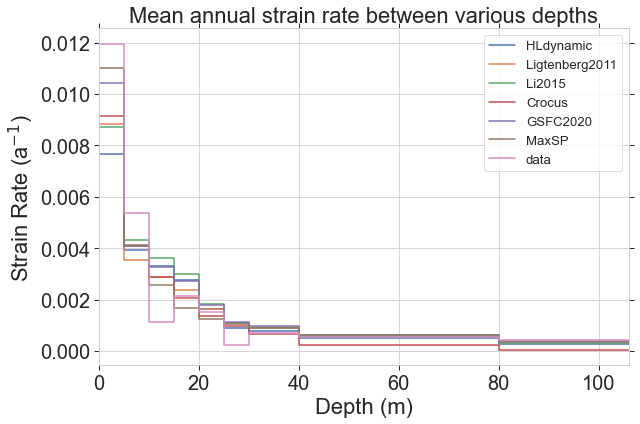

In [127]:
### PLOT
f1,a1=plt.subplots(figsize=(9,6))
diff_strainrate_df2.plot(ax=a1,drawstyle='steps')
a1.set_xlabel('Depth (m)')
a1.set_ylabel('Strain Rate (a$^{-1}$)')
a1.set_title('Mean annual strain rate between various depths')
a1.set_xlim(0,106)
f1.savefig('figures/StrainRateDifferential_Annual_step' + figex)
# a1.set_ylim(0,0.0012)

In [128]:
def mystep(x,y, ax=None, **kwargs):
    x = np.array(x)
    y = np.array(y)
    X = np.c_[x[:-1],x[1:],x[1:]]
    Y = np.c_[y[1:],y[1:],np.zeros_like(x[:-1])*np.nan]
    if not ax: ax=plt.gca()
    return ax.plot(X.flatten(), Y.flatten(), **kwargs)

In [149]:
### PLOT
# diff_strainrate_df2 = diff_strainrate_df.copy()
# diff_strainrate_df2.loc[0]=diff_strainrate_df2.loc[5]
# diff_strainrate_df2.sort_index(inplace=True)
# f1,a1=plt.subplots(figsize=(9,6))
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['HLdynamic_rloop-con'],ax=a1,label='H&L, $\dot{b}$ constant',color=hcolor,ls='--',lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['HLdynamic_rloop-1'],ax=a1,label='H&L, $\dot{b}$ step change',color=hcolor,lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['Goujon2003_rloop-con'],ax=a1,label='Goujon, $\dot{b}$ constant',color=gcolor,ls='--',lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['Goujon2003_rloop-1'],ax=a1,label='Goujon, $\dot{b}$ step change',color=gcolor,lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['data'],label='Data',color=datacolor,lw=4)

# a1.set_xlabel('Depth (m)')
# a1.set_ylabel('Strain Rate (a$^{-1}$)')
# a1.set_title('Mean annual strain rate between various depths')
# a1.set_xlim(0,106)
# a1.legend(loc=1,fontsize='large',frameon=True,framealpha=0.5,facecolor='w')
# f1.savefig('figures/StrainRateDifferential_Annual_step_all' + figex)

In [150]:
### PLOT
# diff_strainrate_df2 = diff_strainrate_df.copy()
# diff_strainrate_df2.loc[0]=diff_strainrate_df2.loc[5]
# diff_strainrate_df2.sort_index(inplace=True)
# f1,a1=plt.subplots(figsize=(9,6))
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['HLdynamic_rloop-con'],ax=a1,label='H&L, $\dot{b}$ constant',color=hcolor,ls='--',lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['HLdynamic_rloop-1'],ax=a1,label='H&L, $\dot{b}$ step change',color=hcolor,lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['Goujon2003_rloop-con'],ax=a1,label='Goujon, $\dot{b}$ constant',color=gcolor,ls='--',lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['Goujon2003_rloop-1'],ax=a1,label='Goujon, $\dot{b}$ step change',color=gcolor,lw=3)
# mystep(diff_strainrate_df2.index,diff_strainrate_df2['data'],label='Data',color=datacolor,lw=4)

# a1.set_xlabel('Depth (m)')
# a1.set_ylabel('Strain Rate (a$^{-1}$)')
# a1.set_title('Mean annual strain rate between various depths (zoomed in on deeper firn)')
# a1.set_xlim(25,106)
# a1.set_ylim(0,0.001)
# a1.legend(loc=3,fontsize='large',frameon=True,framealpha=0.5,facecolor='w')
# f1.savefig('figures/StrainRateDifferential_Annual_step_all_zoom' + figex)

In [129]:
diff_strainrate_df2.sub(diff_strainrate_df2['data'],axis=0).abs().div(diff_strainrate_df2['data'],axis=0)*100

,HLdynamic,Ligtenberg2011,Li2015,Crocus,GSFC2020,MaxSP,data
0,35.839148,25.986019,27.012205,23.522938,12.711262,7.748062,0.0
5,35.839148,25.986019,27.012205,23.522938,12.711262,7.748062,0.0
10,26.574454,33.786484,19.479996,24.032138,24.107113,22.748201,0.0
15,192.247060,153.920272,218.666167,156.032104,190.338778,127.967634,0.0
20,29.709125,11.651872,41.189299,3.032647,27.371489,20.723407,0.0
25,6.522304,5.749024,20.381862,11.941245,16.313219,17.818174,0.0
30,312.593468,394.912271,403.089635,339.669631,420.988978,385.735451,0.0
40,9.017629,30.182322,29.806538,6.013732,37.577214,27.484729,0.0
80,4.650756,11.452998,11.141549,57.047497,18.396482,17.764424,0.0
106,34.545374,24.306661,24.964864,91.187394,19.223872,9.314261,0.0


In [130]:
diff_strainrate_df2.sub(diff_strainrate_df2['data'],axis=0).abs()

,HLdynamic,Ligtenberg2011,Li2015,Crocus,GSFC2020,MaxSP,data
0,0.004284,0.003106,0.003229,0.002812,0.001520,0.000926,0.0
5,0.004284,0.003106,0.003229,0.002812,0.001520,0.000926,0.0
10,0.001425,0.001812,0.001045,0.001289,0.001293,0.001220,0.0
15,0.002173,0.001740,0.002471,0.001763,0.002151,0.001446,0.0
20,0.000634,0.000249,0.000879,0.000065,0.000584,0.000442,0.0
25,0.000100,0.000088,0.000313,0.000183,0.000250,0.000273,0.0
30,0.000686,0.000866,0.000884,0.000745,0.000923,0.000846,0.0
40,0.000064,0.000213,0.000210,0.000042,0.000265,0.000194,0.0
80,0.000025,0.000062,0.000060,0.000307,0.000099,0.000096,0.0
106,0.000143,0.000100,0.000103,0.000376,0.000079,0.000038,0.0


In [131]:
cra_df.sub(cra_df['data'],axis=0).abs().div(cra_df['data'],axis=0)*100

,HLdynamic,Ligtenberg2011,Li2015,Crocus,GSFC2020,MaxSP,data
5,35.225232,25.279181,26.306366,22.787617,11.880921,6.855896,0.0
10,32.054754,28.397076,23.804527,23.243729,16.361775,12.680367,0.0
15,16.671536,15.893265,7.175239,10.948513,2.185698,3.034351,0.0
20,11.796815,12.998204,2.092008,10.116536,0.920834,4.893514,0.0
25,10.322719,11.489659,0.283588,10.263366,2.159423,5.933531,0.0
30,6.955960,7.252468,3.922024,6.614927,6.526185,1.849948,0.0
40,5.902800,4.784344,5.628624,6.575290,8.573420,0.084125,0.0
80,5.700078,2.155302,6.521240,14.747412,10.163904,2.946801,0.0
106,7.864461,3.817411,4.158706,20.483024,7.958817,2.026802,0.0


In [132]:
str_df.sub(str_df['data'],axis=0).abs().div(str_df['data'],axis=0)

,HLdynamic,Ligtenberg2011,Li2015,Crocus,GSFC2020,MaxSP,data
5,0.358391,0.259860,0.270122,0.235229,0.127113,0.077481,0.0
10,0.313373,0.276360,0.230116,0.224360,0.154779,0.117617,0.0
15,0.170046,0.162325,0.075498,0.112987,0.025768,0.034220,0.0
20,0.118917,0.130886,0.021970,0.102126,0.008117,0.049905,0.0
25,0.101397,0.113092,0.000859,0.100804,0.023674,0.057472,0.0
30,0.070541,0.073492,0.038161,0.067113,0.064155,0.019505,0.0
40,0.059766,0.048562,0.055450,0.066468,0.084927,0.000094,0.0
80,0.057601,0.022163,0.064525,0.148007,0.100941,0.028812,0.0
106,0.079079,0.038631,0.041095,0.205207,0.079070,0.019782,0.0


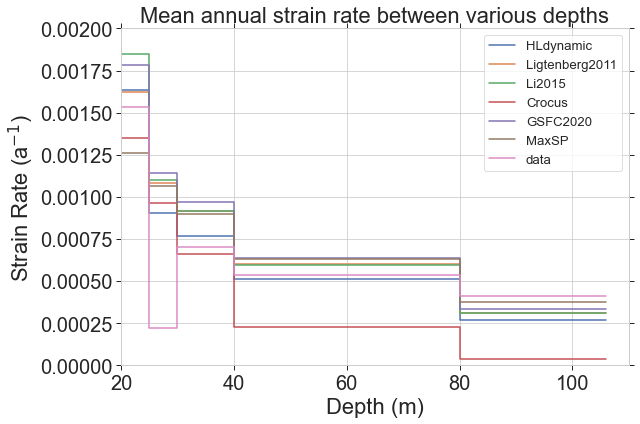

In [133]:
### PLOT
f1,a1=plt.subplots(figsize=(9,6))
diff_strainrate_df2.plot(ax=a1,drawstyle='steps')
a1.set_xlabel('Depth (m)')
a1.set_ylabel('Strain Rate (a$^{-1}$)')
a1.set_title('Mean annual strain rate between various depths')
a1.set_xlim(20,110)
a1.set_ylim(0,0.002)
f1.savefig('figures/StrainRateDifferential_Annual_zoom20110_step' + figex)

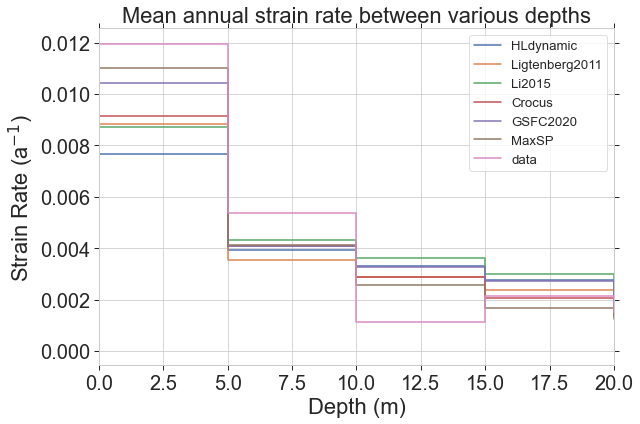

In [134]:
### PLOT
f1,a1=plt.subplots(figsize=(9,6))
diff_strainrate_df2.plot(ax=a1,drawstyle='steps')
a1.set_xlabel('Depth (m)')
a1.set_ylabel('Strain Rate (a$^{-1}$)')
a1.set_title('Mean annual strain rate between various depths')
a1.set_xlim(0,20)
# a1.set_ylim(0,0.0012)
f1.savefig('figures/StrainRateDifferential_Annual_zoom020_step' + figex)

In [135]:
tsm=np.mean(np.diff(tsteps))

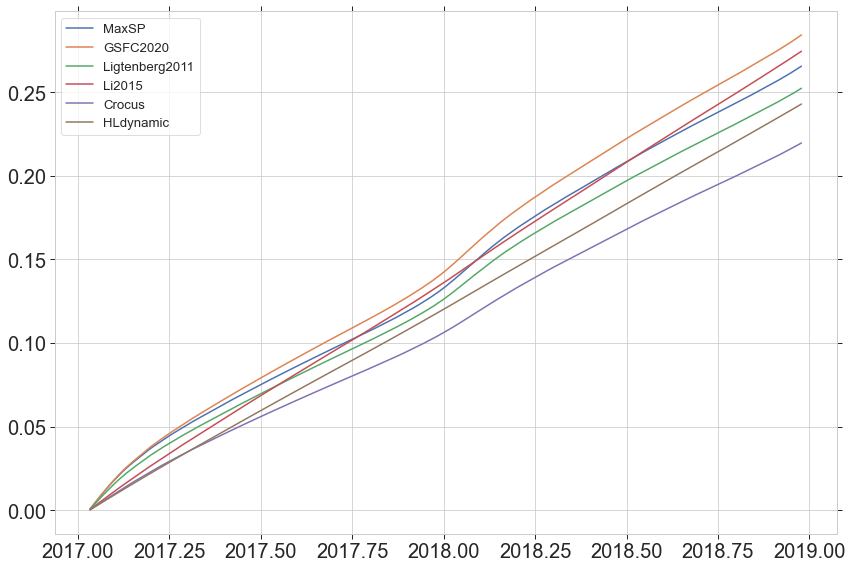

In [136]:
### PLOT
# tsteps
f1,a1 = plt.subplots(figsize=(12,8))
for name in thenames:
    a1.plot(tsteps,np.cumsum(d2[fil][name]['crate80']*tsm),label=name)
# a1.plot(tsteps,np.cumsum(d2[fil]['Ligtenberg2011']['crate80']*tsm))
# a1.plot(tsteps,np.cumsum(d2[fil]['Goujon2003']['crate80']*tsm))
# a1.plot(tsteps,np.cumsum(d2[fil]['Li2015']['crate80']*tsm))
a1.legend()
# a1.plot(tsteps,np.cumsum(d2[fil]['Goujon2003']['crate80']*tsm))

In [137]:
abc = toYearFraction(dfp8.index[-1])-toYearFraction(dfp8.index[0])

In [138]:
# 5-m hole, rms error
(((dfp3.compaction_rate_yr1[28:-28]-dfp3.compaction_rate_yr12[28:-28])**2).sum()/len(dfp3.compaction_rate_yr1))**(0.5)/dfp3.compaction_rate_yr1[28:-28].mean()

0.14106226184747775

In [139]:
# 15-m hole, rms error
s1=200
(((dfp3.compaction_rate_yr5[s1:-28]-dfp3.compaction_rate_yr9[s1:-28])**2).sum()/len(dfp3.compaction_rate_yr9))**(0.5)/dfp3.compaction_rate_yr9[s1:-28].mean()

0.053668880514909215

In [140]:
# rmscalc(holedep,inum,data_decimaldates,tsteps,dfp3,d2,mname)
rmscalc(10,11,data_decimaldates,tsteps,dfp3,d2,'MaxSP')

(0.012514688662779055,
 0.17640447394020062,
 0.0606459454478816,
 0.07094314777425323)

In [141]:
data_decimaldates=np.zeros(len(dfp3.index))
for kk,dat in enumerate(dfp3.index):
    data_decimaldates[kk]=toYearFraction(dfp3.index[kk])

<AxesSubplot:xlabel='TIMESTAMP'>

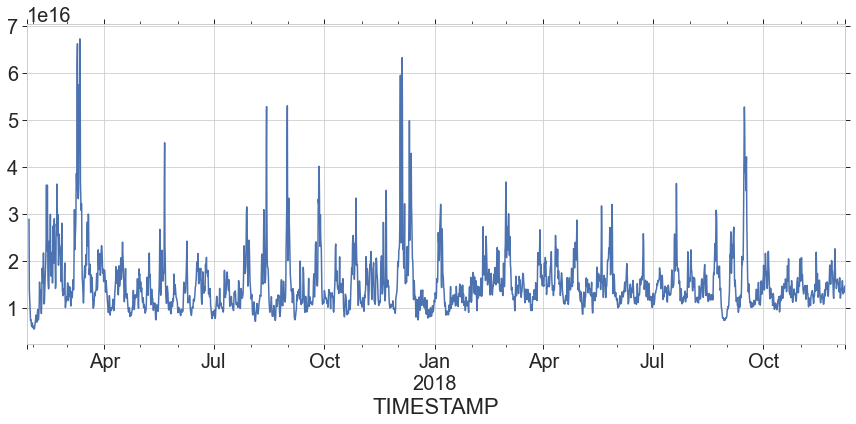

In [142]:
f1,a1 = plt.subplots()
df_dc['viscosity3_2'][12:-12].plot(ax=a1)

In [149]:
dfp3

,RECORD,compaction1,compaction_rate1,compaction_rate_yr1,compaction2,compaction_rate2,compaction_rate_yr2,compaction3,compaction_rate3,compaction_rate_yr3,...,compaction_rate_yr9,compaction10,compaction_rate10,compaction_rate_yr10,compaction11,compaction_rate11,compaction_rate_yr11,compaction12,compaction_rate12,compaction_rate_yr12
TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2017-01-23 12:00:00,69,0.004311,4.340521e-09,0.136976,0.004827,6.646901e-09,0.209760,0.005167,5.985853e-09,0.188899,...,0.161537,NaN,6.631095e-09,0.209261,0.006013,6.631095e-09,0.209261,0.005271,5.598491e-09,0.176675
2017-01-23 18:00:00,70,0.004404,4.289288e-09,0.135360,0.004971,6.688199e-09,0.211064,0.005296,5.914924e-09,0.186661,...,0.160603,NaN,6.613608e-09,0.208710,0.006156,6.613608e-09,0.208710,0.005392,5.582636e-09,0.176175
2017-01-24 00:00:00,71,0.004496,4.330552e-09,0.136662,0.005115,6.603785e-09,0.208400,0.005422,5.829775e-09,0.183974,...,0.159739,NaN,6.582168e-09,0.207717,0.006299,6.582168e-09,0.207717,0.005512,5.557834e-09,0.175392
2017-01-24 06:00:00,72,0.004591,4.330725e-09,0.136667,0.005257,6.592889e-09,0.208056,0.005547,5.790343e-09,0.182729,...,0.156820,NaN,6.519326e-09,0.205734,0.006440,6.519326e-09,0.205734,0.005632,5.553221e-09,0.175246
2017-01-24 12:00:00,73,0.004683,4.305621e-09,0.135875,0.005400,6.662433e-09,0.210250,0.005672,5.822877e-09,0.183756,...,0.156978,NaN,6.467486e-09,0.204098,0.006580,6.467486e-09,0.204098,0.005752,5.592341e-09,0.176481
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-09 18:00:00,2810,0.091878,1.117240e-09,0.035257,0.253137,3.697312e-09,0.116678,0.212154,2.977566e-09,0.093965,...,0.066583,0.145013,1.773142e-09,0.055956,0.150065,2.027305e-09,0.063977,0.098818,1.122633e-09,0.035428
2018-12-10 00:00:00,2811,0.091902,1.094785e-09,0.034549,0.253217,3.710923e-09,0.117108,0.212217,2.930052e-09,0.092465,...,0.066567,0.145051,1.740392e-09,0.054923,0.150109,2.059333e-09,0.064988,0.098842,1.147379e-09,0.036209
2018-12-10 06:00:00,2812,0.091925,1.058927e-09,0.033417,0.253297,3.723341e-09,0.117500,0.212280,2.964730e-09,0.093560,...,0.067249,0.145088,1.746820e-09,0.055125,0.150154,2.065355e-09,0.065178,0.098867,1.165020e-09,0.036765


In [143]:
dfm = pd.concat([dfp3[ss:tt].compaction_rate11,dft5[ss:tt].Therm_temp1],axis=1)
# dfm.interpolate(inp)

NameError: name 'ss' is not defined

In [144]:
overall_pearson_r = dfm.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {overall_pearson_r}")
# out: Pandas computed Pearson r: 0.2058774513561943

r, p = stats.pearsonr(dfm.dropna()['compaction_rate11'], dfm.dropna()['Therm_temp1'])
print(f"Scipy computed Pearson r: {r} and p-value: {p}")
# out: Scipy computed Pearson r: 0.20587745135619354 and p-value: 3.7902989479463397e-51

# Compute rolling window synchrony
f,ax=plt.subplots(figsize=(7,3))
dfm.rolling(window=30,center=True).median().plot(ax=ax)
ax.set(xlabel='Time',ylabel='Pearson r')
ax.set(title=f"Overall Pearson r = {np.round(overall_pearson_r,2)}");

NameError: name 'dfm' is not defined

In [157]:
### Pretty sure this was just testing some code...
# # Set window size to compute moving window synchrony.
# r_window_size = 4
# # Interpolate missing data.
# df_interpolated = dfm.interpolate()
# # Compute rolling window synchrony
# rolling_r = df_interpolated['compaction_rate11'].rolling(window=r_window_size, center=True).corr(df_interpolated['Therm_temp1'])
# f,ax=plt.subplots(2,1,figsize=(14,6),sharex=True)
# dfm.rolling(window=30,center=True).median().plot(ax=ax[0])
# ax[0].set(xlabel='Frame',ylabel='Evidence')
# rolling_r.plot(ax=ax[1])
# ax[1].set(xlabel='Frame',ylabel='Pearson r')
# plt.suptitle("Smiling data and rolling window correlation")

In [145]:
def crosscorr(datax, datay, lag=0, wrap=False):
    """ Lag-N cross correlation. 
    Shifted data filled with NaNs 
    
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length
    Returns
    ----------
    crosscorr : float
    """
    if wrap:
        shiftedy = datay.shift(lag)
        shiftedy.iloc[:lag] = datay.iloc[-lag:].values
        return datax.corr(shiftedy)
    else: 
        return datax.corr(datay.shift(lag))

d1T = dfm.compaction_rate11
d2T = dfm.Therm_temp1
days = 10
opd = 4
rs = [crosscorr(d1T,d2T, lag) for lag in range(-int(days*opd),int(days*opd+1))]
offset = np.ceil(len(rs)/2)-np.argmax(rs)
f,ax=plt.subplots(figsize=(14,3))
ax.plot(rs)
ax.axvline(np.ceil(len(rs)/2),color='k',linestyle='--',label='Center')
ax.axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony')
ax.set(title=f'Offset = {offset} frames\nS1 leads <> S2 leads',ylim=[0.4,1],xlim=[0,81], xlabel='Offset',ylabel='Pearson r')
# ax.set_xticks([0, 50, 100, 151, 201, 251, 301])
ax.set_xticks([0, 20, 41, 61, 81])
# ax.set_xticklabels([-150, -100, -50, 0, 50, 100, 150]);
ax.set_xticklabels([-40, -20, 0, 20, 40]);
plt.legend()

NameError: name 'dfm' is not defined

In [159]:
dfm.head(2)

,compaction_rate11,Therm_temp1
TIMESTAMP,,
2017-02-01 00:00:00,5.592306e-09,-30.90
2017-02-01 06:00:00,5.584965e-09,-31.45


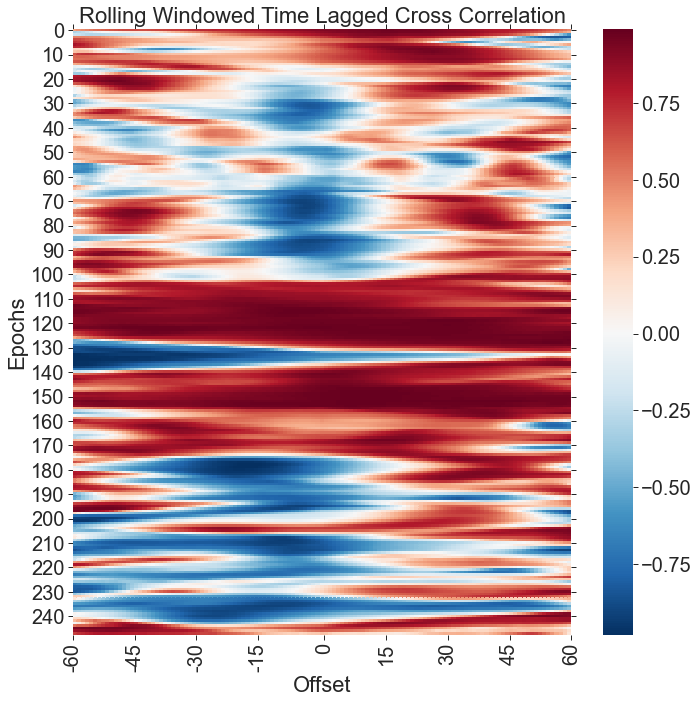

In [160]:
d1T = dfm.compaction_rate11
d2T = dfm.Therm_temp1
### Windowed time lagged cross correlation
days = 10
opd = 4
no_splits = 20 #12
samples_per_split = int(dfm.shape[0]/no_splits)
rss=[]
for t in range(0, no_splits):
    d1T = dfm['compaction_rate11'].iloc[(t)*samples_per_split:(t+1)*samples_per_split]
    d2T = dfm['Therm_temp1'].iloc[(t)*samples_per_split:(t+1)*samples_per_split]
    rs = [crosscorr(d1T,d2T, lag) for lag in range(-int(days*opd),int(days*opd+1))]
    rss.append(rs)
rss = pd.DataFrame(rss)
# f,ax = plt.subplots(figsize=(10,5))
# sns.heatmap(rss,cmap='RdBu_r',ax=ax)
# ax.set(title=f'Windowed Time Lagged Cross Correlation',xlim=[0,301], xlabel='Offset',ylabel='Window epochs')
# ax.set_xticks([0, 50, 100, 151, 201, 251, 301])
# ax.set_xticklabels([-150, -100, -50, 0, 50, 100, 150]);

# Rolling window time lagged cross correlation
seconds = 15
fps = 4
window_size = 120 #samples
t_start = 0
t_end = t_start + window_size
step_size = 10
rss=[]
while t_end < 2600:
    d1T = dfm['compaction_rate11'].iloc[t_start:t_end]
    d2T = dfm['Therm_temp1'].iloc[t_start:t_end]
    rs = [crosscorr(d1T,d2T, lag, wrap=False) for lag in range(-int(seconds*fps),int(seconds*fps+1))]
    rss.append(rs)
    t_start = t_start + step_size
    t_end = t_end + step_size
rss = pd.DataFrame(rss)

f,ax = plt.subplots(figsize=(10,10))
sns.heatmap(rss,cmap='RdBu_r',ax=ax)
ax.set(title=f'Rolling Windowed Time Lagged Cross Correlation',xlim=[0,121], xlabel='Offset',ylabel='Epochs')
ax.set_xticks([0, 15, 30, 45, 61, 76, 91, 106, 121])
ax.set_xticklabels([-60, -45, -30, -15, 0, 15, 30, 45, 60]);

-------------------
# Temperature Plots
-------------------

In [34]:
d['SP50']['MET']['HLdynamic']['rdaily'].keys()

NameError: name 'd' is not defined

In [92]:
# modeltemp = d[site][datasource][thenames[0]][fil]['temperature']-273.15
modeltemp = d[site][datasource][thenames[0]][fil]['temp_trun']-273.15
modeldepth = d[site][datasource][thenames[0]][fil]['dep_trun']
# modeltime = d[site][datasource][thenames[0]][fil]['time_trun']
# modeldepth = d[site][datasource][thenames[0]][fil]['depth']
modeltime = d[site][datasource][thenames[0]][fil]['time']

In [93]:
### Not sure why this is here
# dft5.to_pickle('dft5.pkl')
# dft4.to_pickle('dft4.pkl')

In [35]:
dft_daily = dft5.resample('1d').mean()
dft_monthly = dft5.resample('1M').mean()

In [47]:
hc1

2017-01-01 00:00:00    0.000270
2017-01-01 06:00:00    0.000512
2017-01-01 12:00:00    0.000753
2017-01-01 18:00:00    0.000994
2017-01-02 00:00:00    0.001235
                         ...   
2018-12-23 18:00:00    0.952240
2018-12-24 00:00:00    0.953035
2018-12-24 06:00:00    0.953746
2018-12-24 12:00:00    0.954457
2018-12-24 18:00:00    0.955169
Freq: 6H, Name: pcp, Length: 2892, dtype: float64

In [36]:
'''
In the SP_model notebook, I took the daily precip records, 1/1/2017 - 12/31/18.
Converted to snow with density 300. 2017 gave ~30 cm of snow, so used that.
2018 also gave ~30 cm, so multiplied the precip values by 1.8 to get a total around 60 cm (observed)
These values are then used to adjust the depth of the thermistors.
'''

n_grid = np.linspace(0,41,329) #165
# temps = dft5.values
temps = dft_daily.values # values from the thermistor string
temps_m = dft_monthly.values
# tm=dft5.index.values
tm=dft_daily.index.values
tm_m = dft_monthly.index.values
ro,co = np.shape(temps)
ro_m, co_m = np.shape(temps_m)
depths1 = np.tile(tdeps.astype(float),(ro,1))
depths1_m = np.tile(tdeps.astype(float),(ro_m,1))

hc1 = pd.read_pickle('HeightChange_full.pkl') 
hc_full = hc1.resample('1d').mean()
hc = hc_full[dft_daily.index[0]:dft_daily.index[-1]]
hc_m = hc1.resample('1M').mean()
depth_adder = np.tile(hc.values,(co,1)).T
depth_adder_m = np.tile(hc_m.values,(co_m,1)).T
# depth_adder =np.zeros_like(depth_adder) # use this to not add to depths
depth_adder = depth_adder*1.1
depth_adder_m = depth_adder_m*1.1

depths = depths1 + depth_adder
depths_m = depths1_m #+ depth_adder_m
t_interp=np.zeros((ro,len(n_grid)))
t_interp_m = np.zeros((ro_m,len(n_grid)))
for kk in range(ro): #put the measured temperatures on the grid
    tif = sp.interpolate.interp1d(depths[kk,:],temps[kk,:],bounds_error=False)
    t_interp[kk,:]= tif(n_grid)

for kkk in range(ro_m): #put the measured temperatures on the grid
    tif = sp.interpolate.interp1d(depths_m[kkk,:],temps_m[kkk,:],bounds_error=False,fill_value="extrapolate")
    t_interp_m[kkk,:]= tif(n_grid)
    
dataT = t_interp.T # change matrix so that each column is time, shallow is first row, deep is last row.
dataT_m = t_interp_m.T

In [37]:
pdtime=pd.to_datetime(tm)
tmdec=np.zeros(len(tm))
for ii in range(len(tmdec)):
    x=toYearFraction(pdtime[ii])
    tmdec[ii]=x
r,c=np.shape(modeldepth)
MT = np.tile(modeltime,(c,1))
T,D=np.meshgrid(tmdec,n_grid)

NameError: name 'modeldepth' is not defined

In [646]:
### This takes a while to run.
modelTi = sp.interpolate.griddata((np.ravel(MT),np.ravel(modeldepth.T)),np.ravel(modeltemp.T),(T,D),method='linear')
t2=modelTi.copy()

In [647]:
modelTi

array([[         nan, -32.60523996, -34.33790276, ..., -25.30806699,
        -26.36773975,          nan],
       [-32.82216113, -32.46677875, -31.7398306 , ..., -25.61590546,
        -26.18904331,          nan],
       [-33.53299032, -33.22274011, -31.97100522, ..., -27.15379549,
        -27.25196063,          nan],
       ...,
       [-51.27604151, -51.27459936, -51.27046949, ..., -51.23783477,
        -51.23773081,          nan],
       [-51.27986251, -51.27820774, -51.275426  , ..., -51.24314503,
        -51.24304315,          nan],
       [-51.28348922, -51.28163739, -51.28027691, ..., -51.2482531 ,
        -51.24815502,          nan]])

In [648]:
from matplotlib.colors import Normalize
class MidpointNormalize(Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

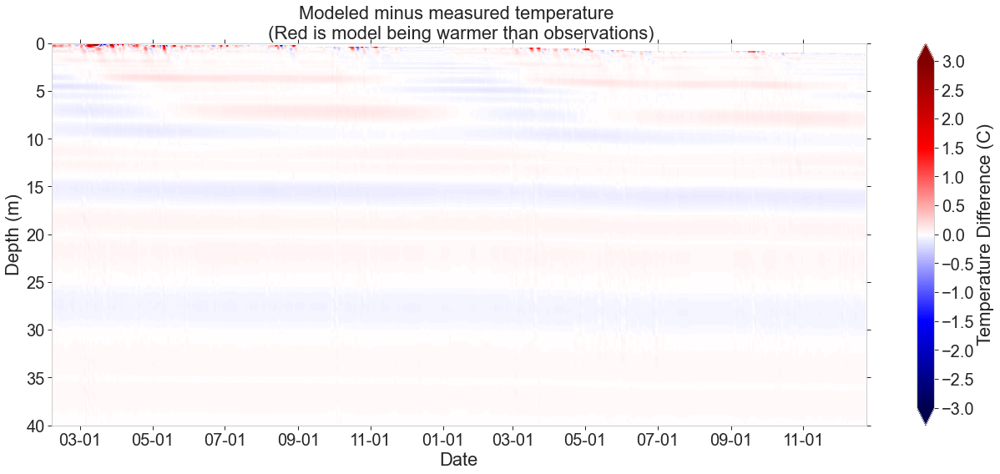

In [649]:
norm = MidpointNormalize(midpoint=0)
lv=np.linspace(-3,3,256)
lv2=np.linspace(-3,3,13)
tks = np.linspace(-3,3,13) # 9
modelT_C = modelTi#-273.15
md_diff = modelT_C - dataT
f3, ax3 = plt.subplots()
f3.set_size_inches(18,8)
cax3 = ax3.contourf(tm,n_grid,md_diff,cmap='seismic',extend='both',levels=lv)
# cax3b = ax3.contour(tm,n_grid,md_diff,colors='k',extend='both',levels=lv2)
ax3.set_ylim(0,40)
# ax3.set_xlim(tm[0],tm[582])
ax3.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%d'))
ax3.invert_yaxis()
cb3 = f3.colorbar(cax3,ticks=tks)
cb3.set_label('Temperature Difference (C)')
ax3.set_ylabel('Depth (m)')
ax3.set_xlabel('Date')

ax3.set_title('Modeled minus measured temperature \n (Red is model being warmer than observations)')
f3.savefig('figures/modeldata_temp_SP50_Tskin_zoom' + figex)
# plt.close(f3)

In [650]:
(np.exp(-60e3/(8.314*222.5)) - np.exp(-60e3/(8.314*223)))/np.exp(-60e3/(8.314*223))

-0.07014234644004472

In [651]:
np.nanmax(md_diff)

5.069871320327557

In [38]:
# md_diff = modelT_C - dataT
# a[~np.isnan(a)]
rr,cc = np.shape(md_diff)
dp = md_diff/(dataT+273.15)
yy=np.ones(cc)
for jj in range(cc):
#     np.invert(np.isnan(a))
    try:
        yy[jj] = dp[:,jj][~np.isnan(dp[:,jj])][0]
    except:
        yy[jj] = np.nan

NameError: name 'md_diff' is not defined

In [39]:
dti = pd.date_range(start='2017-01-01',end='2018-12-31',freq='d')
dd3 = pd.DataFrame({'mm':yy[2:]},index=tm[2:])
dd3=pd.DataFrame(data=dd3,index = dti)
dd4 = dd3.fillna(method='ffill').fillna(method='bfill')

NameError: name 'yy' is not defined

In [654]:
dd4.to_pickle('TempAlter.pkl')

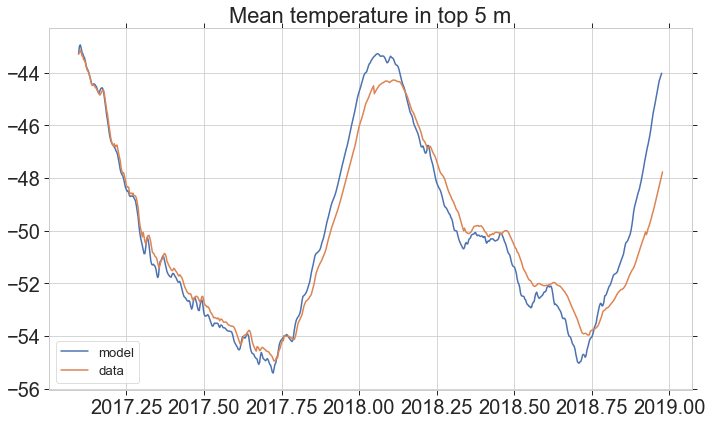

In [655]:
de = 5
di=np.where(n_grid<=de)[0][-1]
T10m_model=np.nanmean(modelT_C[0:di,:],axis=0)
T10m_data=np.nanmean(dataT[0:di,:],axis=0)
f1,a1=plt.subplots(figsize=(10,6))
a1.plot(tmdec,T10m_model,label='model')
a1.plot(tmdec,T10m_data,label='data')
a1.set_title('Mean temperature in top %s m' %de)
a1.legend()
f1.savefig('figures/T_top5m' + figex)

In [46]:
# l120 = np.tile(np.array([50,75,100,125,150,175,200,225]),(hcl,1))

In [62]:
surfaceT_all = np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/FIRN/CFM/CommunityFirnModel/CFM_main/SouthPole/SP_daily_tskin_dd4_box.csv',delimiter=',')
# surfaceT_time = surfaceT_all[0:-7,0]
# surfaceT_T = surfaceT_all[0:-7,1]
surfaceT_time = surfaceT_all[:,0]
surfaceT_T = surfaceT_all[:,1]

In [64]:
surfaceT_all.shape

(723, 2)

In [42]:
dfd2.index

DatetimeIndex(['2017-01-01', '2017-01-02', '2017-01-03', '2017-01-04',
               '2017-01-05', '2017-01-06', '2017-01-07', '2017-01-08',
               '2017-01-09', '2017-01-10',
               ...
               '2018-12-15', '2018-12-16', '2018-12-17', '2018-12-18',
               '2018-12-19', '2018-12-20', '2018-12-21', '2018-12-22',
               '2018-12-23', '2018-12-24'],
              dtype='datetime64[ns]', length=723, freq='D')

In [53]:
depths_full.shape

(723, 23)

In [56]:
tm_decF.shape

(723,)

In [58]:
surfaceT_T.shape

(716,)

In [65]:
ix =  pd.date_range('2017-01-01','2018-12-24',freq='D')
dfd2 = dft_daily.copy()
dfd2 = dfd2.reindex(ix,method='bfill')
tempsF = dfd2.values
hcl = len(hc_full)
roF,coF = np.shape(tempsF)

depths1F = np.tile(tdeps.astype(float),(roF,1))
depth_adder_full = np.tile(hc_full.values,(coF,1)).T
depth_adder_full = depth_adder_full*1.1
depths_full = depths1F + depth_adder_full

tm_decF = np.array([toYearFraction(pd.to_datetime(ii)) for ii in dfd2.index])
l120 = np.tile(np.array([50,75,100,125,150,175,200,225]),(hcl,1))
n_grid1 = np.linspace(0,200,801) #165
tempsF1 = np.hstack((tempsF,np.tile(-51.25,(8,hcl)).T))
depthsF1 = np.hstack((depths_full,l120)) 
tempsF1 = np.hstack((surfaceT_T[None,:].T-273.15,tempsF1))
depthsF1 = np.hstack((np.tile(0,(1,hcl)).T,depthsF1))
t_interpF1=np.zeros((roF,len(n_grid1)))
for kk in range(roF): #put the measured temperatures on the grid
    tif = sp.interpolate.interp1d(depthsF1[kk,:],tempsF1[kk,:],kind='cubic',fill_value='extrapolate')
    t_interpF1[kk,:]= tif(n_grid1) + 273.15
tF2 = np.concatenate((n_grid1[:,None],t_interpF1.T),axis=1)
bigtempmat = np.concatenate((np.append(np.nan,tm_decF)[None,:],tF2),axis=0)

In [66]:
TfiltT = sp.ndimage.gaussian_filter(bigtempmat[1:,1:],[2,3],mode='nearest')
Tfilt = bigtempmat.copy()
Tfilt[1:,1:] = TfiltT

In [67]:
np.where(bigtempmat[1:,1:]==np.max(bigtempmat[1:,1:]))

(array([0]), array([711]))

In [ ]:
f1,a1=plt.subplots()

# a1.plot(bigtempmat[1:,676],bigtempmat[1:,0])
a1.plot(bigtempmat[1:,106],bigtempmat[1:,0])
a1.plot(bigtempmat[1:,107],bigtempmat[1:,0])
# a1.plot(bigtempmat[1:,676],bigtempmat[1:,0])
a1.plot(Tfilt[1:,106],Tfilt[1:,0])
a1.plot(Tfilt[1:,107],Tfilt[1:,0])
a1.set_ylim(0,50)
a1.set_xlim(221,224)
a1.invert_yaxis()

In [ ]:
f1,a1=plt.subplots()
a1.plot(bigtempmat[0,1:],bigtempmat[21,1:])
a1.plot(bigtempmat[0,1:],bigtempmat[22,1:])
a1.plot(bigtempmat[0,1:],bigtempmat[23,1:])
a1.plot(Tfilt[0,1:],Tfilt[21,1:])
a1.plot(Tfilt[0,1:],Tfilt[22,1:])
a1.plot(Tfilt[0,1:],Tfilt[23,1:])
# a1.plot(bigtempmat[1:,676],bigtempmat[1:,0])
# a1.plot(bigtempmat[1:,106],bigtempmat[1:,0])
# a1.plot(bigtempmat[1:,107],bigtempmat[1:,0])
# a1.set_ylim(0,50)
# a1.invert_yaxis()

In [ ]:
bigtempmat

In [68]:
np.savetxt('/Users/maxstev/Documents/Grad_School/Research/FIRN/CFM/CommunityFirnModel/CFM_main/SouthPole/SPtemp_mat.csv',bigtempmat,delimiter=',')

In [399]:
dft4

RECORD,13,14,15,16,17,18,19,20,21,22,...,2862,2863,2864,2865,2866,2867,2868,2869,2870,depth
TIMESTAMP,2017-01-09 12:00:00,2017-01-09 18:00:00,2017-01-10 00:00:00,2017-01-10 06:00:00,2017-01-10 12:00:00,2017-01-10 18:00:00,2017-01-11 00:00:00,2017-01-11 06:00:00,2017-01-11 12:00:00,2017-01-11 18:00:00,...,2018-12-22 18:00:00,2018-12-23 00:00:00,2018-12-23 06:00:00,2018-12-23 12:00:00,2018-12-23 18:00:00,2018-12-24 00:00:00,2018-12-24 06:00:00,2018-12-24 12:00:00,2018-12-24 18:00:00,-9999.00
Therm_temp1,-23.45,-23.1,-23.9,-23.55,-24.65,-24.05,-23.4,-23.65,-24.4,-24.35,...,-38.05,-38.0,-37.9,-37.85,-37.75,-37.8,-37.65,-37.6,-37.55,0.00
Therm_temp9,-27.5,-27.55,-27.7,-27.85,-28.1,-28.15,-28.15,-28.25,-28.35,-28.4,...,-41.1,-41.0,-40.95,-40.85,-40.75,-40.75,-40.65,-40.6,-40.5,0.25
Therm_temp17,-30.75,-30.75,-30.8,-30.85,-30.9,-30.95,-31.0,-31.05,-31.1,-31.15,...,-42.9,-42.85,-42.75,-42.7,-42.6,-42.55,-42.5,-42.45,-42.35,0.50
Therm_temp2,-33.9,-33.85,-33.85,-33.85,-33.85,-33.85,-33.8,-33.8,-33.8,-33.85,...,-44.6,-44.5,-44.45,-44.4,-44.35,-44.3,-44.25,-44.15,-44.1,0.75
Therm_temp10,-36.95,-36.9,-36.9,-36.85,-36.85,-36.8,-36.8,-36.75,-36.75,-36.75,...,-46.25,-46.25,-46.2,-46.15,-46.05,-46.05,-46.0,-45.9,-45.85,1.00
Therm_temp18,-39.3,-39.25,-39.25,-39.25,-39.2,-39.2,-39.15,-39.1,-39.1,-39.05,...,-47.5,-47.45,-47.4,-47.35,-47.3,-47.3,-47.25,-47.2,-47.15,1.25
Therm_temp3,-41.1,-41.1,-41.1,-41.1,-41.1,-41.05,-41.05,-41.0,-41.0,-40.95,...,-48.35,-48.3,-48.25,-48.2,-48.2,-48.15,-48.1,-48.05,-48.0,1.50
Therm_temp11,-44.25,-44.25,-44.3,-44.3,-44.3,-44.3,-44.3,-44.3,-44.25,-44.25,...,-49.65,-49.65,-49.6,-49.55,-49.55,-49.5,-49.5,-49.45,-49.45,2.00
Therm_temp19,-46.5,-46.5,-46.55,-46.55,-46.55,-46.6,-46.55,-46.55,-46.55,-46.55,...,-50.4,-50.4,-50.35,-50.35,-50.3,-50.3,-50.3,-50.25,-50.25,2.50


In [661]:
# Get info about the upper thermistor
dft5['Therm_temp1'].describe()

count    2750.000000
mean      -50.703491
std         8.415591
min       -64.450000
25%       -57.050000
50%       -52.850000
75%       -45.612500
max       -29.100000
Name: Therm_temp1, dtype: float64

In [400]:
# Get info about the 10m thermistor
dft5['Therm_temp21'].describe()

count    2858.000000
mean      -50.826452
std         0.190329
min       -51.250000
25%       -51.000000
50%       -50.750000
75%       -50.650000
max       -50.550000
Name: Therm_temp21, dtype: float64

In [396]:
### Get info about the 4 deepest thermistors
dft5[['Therm_temp15','Therm_temp23','Therm_temp8','Therm_temp16']].describe()

,Therm_temp15,Therm_temp23,Therm_temp8,Therm_temp16
count,2858.000000,2858.000000,2858.000000,2858.000000
mean,-51.129041,-51.186704,-51.050892,-51.249773
std,0.025649,0.023811,0.010504,0.006934
min,-51.200000,-51.300000,-51.150000,-51.350000
25%,-51.150000,-51.200000,-51.050000,-51.250000
50%,-51.150000,-51.200000,-51.050000,-51.250000
75%,-51.100000,-51.150000,-51.050000,-51.250000
max,-51.000000,-51.050000,-50.900000,-51.200000


In [662]:
### Get the max/min 10m temperature
i10m = np.where(n_grid==10)[0]
T10m = dataT[i10m,:]
print(np.max(T10m))
print(np.min(T10m))

-50.430099724915245
-51.20089441277806


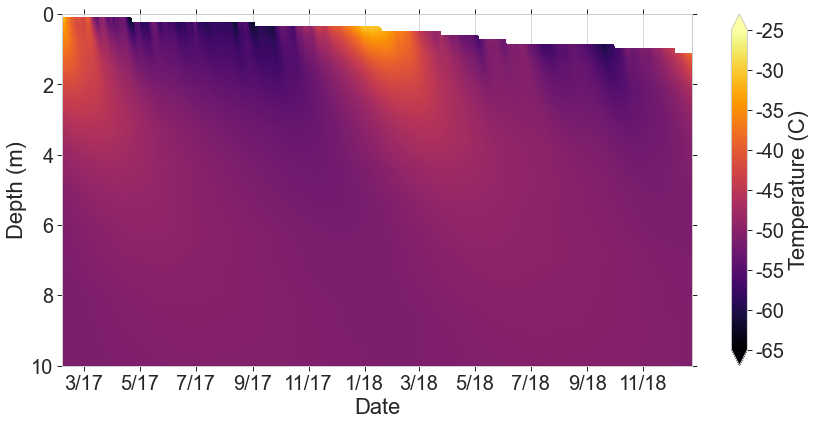

In [663]:
# dTmin = np.nanmin(dataT)
# if dTmin>-20:
#     lmin = -20
# elif (dTmin>-25):
#     lmin = -25
# elif (dTmin>-30):
#     lmin = -30
# else:
#     lmin = -35
import copy  
f1, ax1 = plt.subplots()
f1.set_size_inches(12,6)
# lels = np.linspace(np.floor(np.nanmin(dataT)),0,256)
lels = np.linspace(-65,-25,256)
# tks = np.linspace(np.floor(np.nanmin(dataT)),0,256)
cmap1 = copy.copy(plt.cm.inferno)
cax1 = ax1.contourf(tm,n_grid,dataT,256, cmap=cmap1,extend='both',levels = lels)#, vmin=-50,vmax=0)
for c in cax1.collections:
    c.set_edgecolor("face")

ax1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
# cax1.cmap.set_over('cyan')
# cax1.cmap.set_under('black')
ax1.axhline(y=0,color='k')
ax1.set_ylabel('Depth (m)')
ax1.set_xlabel('Date')
# ax1.set_title('Modeled temperature')
# ax1.set_xlim(tm[0],tm[582])
ax1.set_ylim(0,10)
ax1.invert_yaxis()
cb1 = f1.colorbar(cax1)
cbtks = np.arange(-65,-24,5)
cb1.set_ticks(cbtks)
cb1.set_ticklabels(cbtks)
cb1.set_label('Temperature (C)')
# ax1.set_title('Measured Temperature')
f1.savefig('figures/temperaturedata_SP50' + figex)
f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/temperaturedata_SP50.pdf')

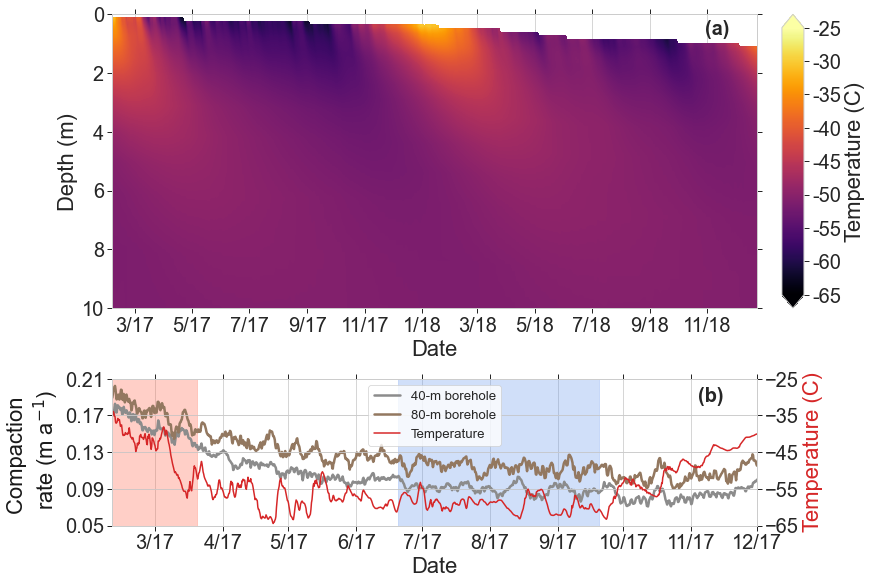

In [697]:
### from matplotlib.dates import date2num
import copy  
fig2 = plt.figure(constrained_layout=True,figsize=(12,8))
spec2 = gridspec.GridSpec(ncols=1, nrows=2, figure=fig2, height_ratios=[2,1])
spec2.update(wspace=0.14,hspace=0.35) # set the spacing between axes.

ax1 = fig2.add_subplot(spec2[0, :])
lels = np.linspace(-65,-25,256)
cmap1 = copy.copy(plt.cm.inferno)
cax1 = ax1.contourf(tm,n_grid,dataT,256, cmap=cmap1,extend='both',levels = lels)#, vmin=-50,vmax=0)
for c in cax1.collections:
    c.set_edgecolor("face")
ax1.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
ax1.axhline(y=0,color='k')
ax1.set_ylabel('Depth (m)')
ax1.set_xlabel('Date')
ax1.set_ylim(0,10)
ax1.invert_yaxis()
cb1 = fig2.colorbar(cax1)
cbtks = np.arange(-65,-24,5)
cb1.set_ticks(cbtks)
cb1.set_ticklabels(cbtks)
cb1.set_label('Temperature (C)')
# ax1.set_title('Measured Temperature')
# f1.savefig('figures/temperaturedata_SP50' + figex)
# f1.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/temperaturedata_SP50.pdf')

# lw = 2.5
# ei=-32
ax2 = fig2.add_subplot(spec2[1, :])
for ii,hh in enumerate(holelist):
    if hh == '2':
        lbl = '80-m borehole'
        col = palette[5]
    elif hh == '3':
        lbl = '40-m borehole'
        col = palette[7]
    ax2.plot(dfp3.index[:ei],dfp3['compaction_rate_yr{}'.format(hh)][:ei],color=col,linewidth=lw,label=lbl)

ax2b=ax2.twinx()
# Thermistor 10 is the one installed at 1m
ax2b.plot(dft5.index,dft5['Therm_temp1'],color='tab:red',label='Temperature')

ax2.axvspan(date2num(datetime(2016,12,20)), date2num(datetime(2017,3,20)), color="tomato", alpha=0.3)
ax2.axvspan(date2num(datetime(2017,6,20)), date2num(datetime(2017,9,20)), color="cornflowerblue", alpha=0.3)

ax2.set_xlabel('Date')
ax2.tick_params(labelbottom=False)
ax2.tick_params(labelbottom=True)
ax2.set_ylabel('Compaction \n rate (m a$^{-1}$)',color='k')
# a1.set_title('South Pole firn compaction')
ax2.xaxis.set_major_formatter(mpl.dates.DateFormatter('%-m/%y'))
ax2.set_xlim(date2num(dfp3.index[0]),date2num(datetime(2017,12,1)))
# a1.set_xlim(date2num(datetime(2017,2,5)),date2num(datetime(2017,12,20)))
ax2.set_ylim(0.05,0.21)
ax2b.set_ylim(-65.0,-25)
ax2.set_yticks(np.linspace(ax2.get_ybound()[0], ax2.get_ybound()[1], 5))
ax2b.set_yticks(np.linspace(ax2b.get_ybound()[0], ax2b.get_ybound()[1], 5))
ax2b.set_ylabel('Temperature (C)',color='tab:red')
# a2.yla
ax2b.tick_params(labelbottom=False)
# a1.legend()
lines, labels = ax2.get_legend_handles_labels()
lines2, labels2 = ax2b.get_legend_handles_labels()
ax2b.legend(lines + lines2, labels + labels2)

ax1.text(DT.date(2018, 11, 12), 0.7, "(a)",fontsize=20,fontweight='bold',ha='center')
ax2.text(DT.date(2017, 11, 10), 0.185, "(b)",fontsize=20,fontweight='bold',ha='center')


# f1.savefig('CompactionTemp_WinterSummer.pdf')
fig2.savefig('/Users/maxstev/Documents/Grad_School/Manuscripts/Stevens_SPfirn/texfigures/Temp_Comp_panel.pdf');

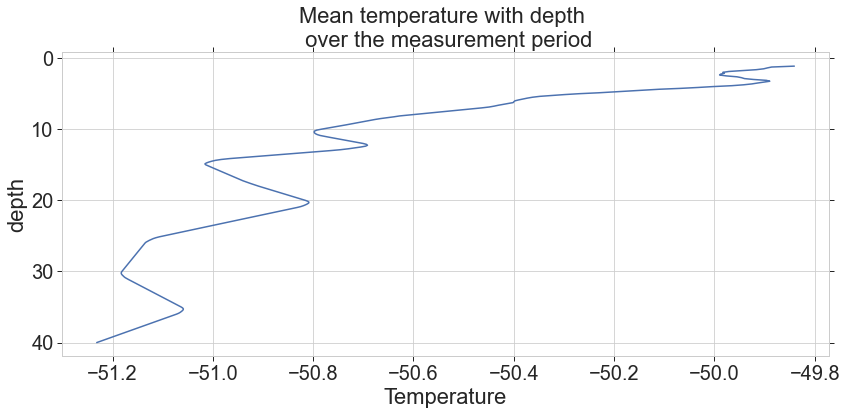

In [224]:
f1,a1=plt.subplots()
a1.plot(np.mean(dataT,axis=1),n_grid)
a1.invert_yaxis()
a1.set_ylabel('depth')
a1.set_xlabel('Temperature')
a1.set_title('Mean temperature with depth \n over the measurement period')
f1.savefig('figures/T_meandepth' + figex)

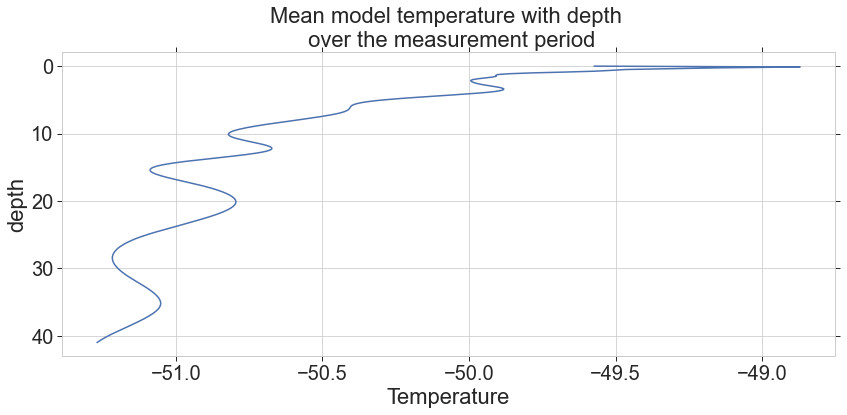

In [225]:
f1,a1=plt.subplots()
a1.plot(np.nanmean(modelT_C,axis=1),n_grid)
a1.invert_yaxis()
a1.set_ylabel('depth')
a1.set_xlabel('Temperature')
a1.set_title('Mean model temperature with depth \n over the measurement period')
f1.savefig('figures/T_meandepth_model' + figex)

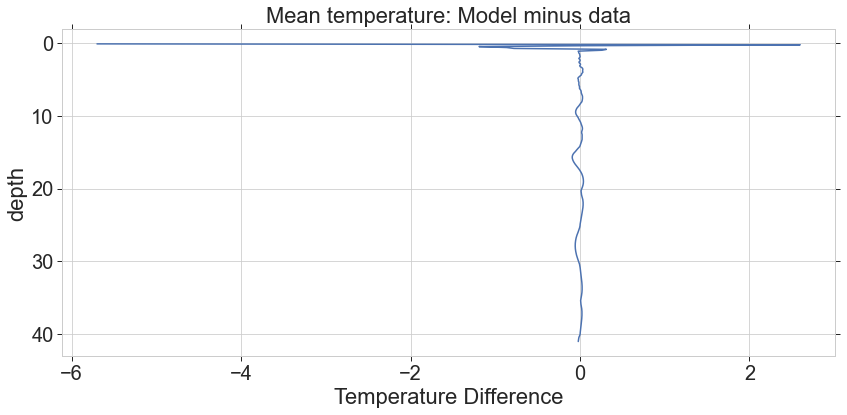

In [226]:
f1,a1=plt.subplots()
a1.plot(np.nanmean(modelT_C,axis=1)-np.nanmean(dataT,axis=1),n_grid)
a1.invert_yaxis()
a1.set_ylabel('depth')
a1.set_xlabel('Temperature Difference')
a1.set_title('Mean temperature: Model minus data')
f1.savefig('figures/T_mean_datamodel' + figex)

In [227]:
fil='rloop-con'
#rloop-1
#rloop-con

In [698]:
### Density
'''
getting the diameter wrong by 1mm adds ~2 percent error.
Accumulation at pole is ~0.07 m W.E per year, or 64 kg/m^3 per year.
Adds ~3.6% more stress to the ~4-5 m depth per year.
'''
rho126=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_126.csv',delimiter=',',skip_header=1)
dep126=rho126[:,0]
den126=rho126[:,1]
rho106=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_106.csv',delimiter=',',skip_header=1)
dep106=rho106[:,0]
den106=rho106[:,1]*1000
rhopit=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_pit.csv',delimiter=',',skip_header=1)
deppit=rhopit[:,0]
denpit=rhopit[:,1]
rhonic=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_nicl.csv',delimiter=',',skip_header=1)
depnic=rhonic[:,0]
dennic=rhonic[:,1]

ind = np.where(dep106>dep126[-1])[0]
ind1 = np.where(deppit<dep126[0])[0][0:-1]

# dep_s = dep126[ind]
# den_s = den126[ind]

# den_c=np.concatenate((den126,den106[ind]))
# dep_c=np.concatenate((dep126,dep106[ind]))
den_c=np.concatenate((denpit[ind1],den126,den106[ind]))
dep_c=np.concatenate((deppit[ind1],dep126,dep106[ind]))


midpoints = (dep_c[1:]+dep_c[0:-1])/2
mid2=np.append(0,midpoints)
mid3= np.append(mid2,(dep_c[-1]+(dep_c[-1]-mid2[-1])))
layer_thickness = np.diff(mid3)
layer_mass = layer_thickness*den_c
mass_cu = np.cumsum(layer_mass)
stress_cu = mass_cu * 9.8

stress_holebot=np.interp(drilled_hole_lengths,dep_c,stress_cu)

In [701]:
np.mean(denpit)

346.0975609756098

In [704]:
np.where(depnic>15)[0][0]

18

In [706]:
dennic[17:20]

array([513.5093397, 501.0477732, 527.2448888])

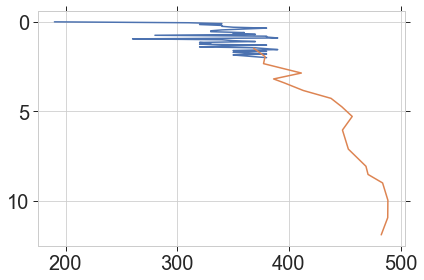

In [498]:
f1,a1=plt.subplots()
a1.plot(denpit,deppit)
# a1.plot(den126[0:10],dep126[0:10])
a1.plot(den126,dep126)
# a1.set_xlim(250,400)
# a1.set_ylim(0,2)
a1.invert_yaxis()

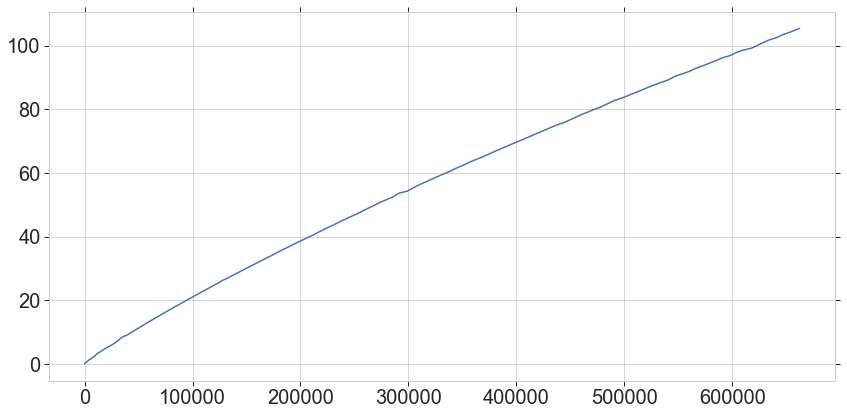

In [230]:
f1,a1=plt.subplots()
a1.plot(stress_cu,dep_c)

In [237]:
import scipy as sp
SP_da = np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/USP50_DA.csv',delimiter=',',skip_header=1)
da_d = SP_da[:,0]
da_a = SP_da[:,1]
da_a_interp = np.interp(dep_c,da_d,da_a,right=np.nan)
# da_a_interp = np.interp(dep_c,da_d,da_a,right=np.nan)
da_int_fun = sp.interpolate.interp1d(da_d,da_a,kind='slinear',fill_value='extrapolate')
age_c = da_int_fun(dep_c)
age_fun = sp.interpolate.interp1d(dep_c,age_c,fill_value='extrapolate')
hole_depths_sorted = np.sort(drilled_hole_lengths)
deep_holes = hole_depths_sorted[-5:]
age_deepholes = np.array([age_fun(ii)[()] for ii in deep_holes])*SPY
stress_fun = sp.interpolate.interp1d(dep_c,stress_cu,fill_value='extrapolate')
stress_deepholes = np.array([stress_fun(ii)[()] for ii in deep_holes])

In [236]:
age_df = pd.DataFrame({'depth':da_d,'age':da_a})

In [235]:
massfun = sp.interpolate.interp1d(mid2,mass_cu)
cmass_df = pd.DataFrame({'mids':mid2,'mass_cu':mass_cu})
# massfun(94.4)[()]/917/778

In [238]:
for jj in range(len(age_df)):
    if jj==0:
        bdotie = [0]
    else:
        bb = (massfun(age_df.depth[jj])[()]-massfun(age_df.depth[jj-1])[()])/(age_df.age[jj]-age_df.age[jj-1])/917
        bdotie.append(bb)   

In [239]:
age_df['bdotie']=np.array(bdotie)

In [240]:
np.mean(np.diff(age_df.age.values)/np.sum(age_df.age.values)*age_df.bdotie[1:].values)*100

0.07209898421971743

In [241]:
(massfun(94.4)[()]-massfun(22.15)[()])/(845-132)/917

0.07364985423963283

In [242]:
massfun(22.15)[()]/917/132

0.09216380838483007

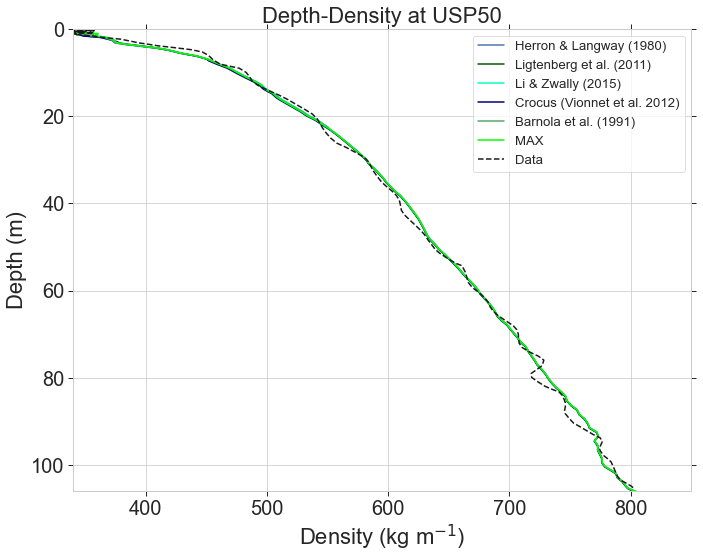

In [244]:
### Depth-density, one model run
fil = 'rdaily'
f2, a2 = plt.subplots(figsize=(10,8))

for ii,name in enumerate(thenames):
    colo, legname = get_plotdeets(name)
    depM = d[site][datasource][name][fil]['depth'][-1,:]
    denM = d[site][datasource][name][fil]['density'][-1,:]
    if fil=='rloop-con':
        a2.plot(denM,depM,color=colo,label=legname,linestyle=':')
    else:
        a2.plot(denM,depM,color=colo,label=legname)
a2.plot(smooth(den_c,8),dep_c,color = datacolor,label='Data',linestyle='--')
a2.set_ylim(0,106)
a2.set_xlim(340,850)
a2.invert_yaxis()
a2.grid(True)
a2.legend()
a2.set_xlabel('Density (kg m$^{-1}$)')
a2.set_ylabel('Depth (m)')
a2.set_title('Depth-Density at USP50')
f2.savefig('figures/USP50_DepthDensity_%s' %fil + figex)

In [246]:
# ### Depth-density, both model runs
# f2, a2 = plt.subplots(figsize=(10,8))

# for ii,name in enumerate(thenames):
#     colo, legname = get_plotdeets(name)
#     legname2=legname+', $\dot{b}$ step change'
#     depM = d[site][datasource][name]['rloop-1']['depth'][-1,:]
#     denM = d[site][datasource][name]['rloop-1']['density'][-1,:]
#     rho_i = np.interp(dep_c,depM,denM)    
#     rms = np.sqrt((np.sum((rho_i-den_c)**2)/len(den_c)))
#     a2.plot(denM,depM,color=colo,label=legname2+str(rms))
  
# for ii,name in enumerate(thenames):
#     colo, legname = get_plotdeets(name)
#     legname2=legname+', constant $\dot{b}$'
#     depM = d[site][datasource][name]['rloop-con']['depth'][-1,:]
#     denM = d[site][datasource][name]['rloop-con']['density'][-1,:]

#     rho_i = np.interp(dep_c,depM,denM)    
#     rms = np.sqrt((np.sum((rho_i-den_c)**2)/len(den_c)))
#     a2.plot(denM,depM,color=colo,label=legname2+str(rms),linestyle=':')    

# a2.plot(smooth(den_c,8),dep_c,color = datacolor,label='Data',linestyle='--')
# a2.set_ylim(0,106)
# a2.set_xlim(340,850)
# a2.invert_yaxis()
# a2.grid(True)
# a2.legend()
# a2.set_xlabel('Density (kg m$^{-1}$)')
# a2.set_ylabel('Depth (m)')
# a2.set_title('Depth-Density at USP50')
# f2.savefig('figures/USP50_DepthDensity' + figex)

In [ ]:
fil='rloop-con'
### Depth-age, one model run
f2, a2 = plt.subplots(figsize=(10,8))

# for ii,name in enumerate(thenames):
#     colo, legname = get_plotdeets(name)
#     depM = d[site][datasource][name][fil]['depth'][-1,:]
#     ageM = d[site][datasource][name][fil]['age'][:]
#     a2.plot(ageM,depM,color=colo,label=legname)
    
a2.plot(age_c,dep_c,color=datacolor, label='Data',linestyle='--')
a2.set_ylim(0,106)
a2.set_xlim(0,1050)
a2.invert_yaxis()
a2.grid(True)
a2.legend()
a2.set_xlabel('Age (a)')
a2.set_ylabel('Depth (m)')
a2.set_title('Depth-Age at USP50')
# f2.savefig('figures/USP50_DepthAge_%s' %fil + figex)

In [ ]:
### Depth-age, both model runs
f2, a2 = plt.subplots(figsize=(10,8))

for ii,name in enumerate(thenames):
    colo, legname = get_plotdeets(name)
    legname2=legname+', $\dot{b}$ step change'
    depM = d[site][datasource][name]['rloop-1']['depth'][-1,:]
    ageM = d[site][datasource][name]['rloop-1']['age'][:]
    a2.plot(ageM,depM,color=colo,label=legname2)
  
for ii,name in enumerate(thenames):
    colo, legname = get_plotdeets(name)
    legname2=legname+', constant $\dot{b}$'
    depM = d[site][datasource][name]['rloop-con']['depth'][-1,:]
    ageM = d[site][datasource][name]['rloop-con']['age'][:]
    a2.plot(ageM,depM,color=colo,label=legname2,linestyle=':')

a2.plot(da_a_interp,dep_c,color=datacolor, label='Data',linestyle='--')
a2.set_ylim(0,106)
a2.set_xlim(0,1050)
a2.invert_yaxis()
a2.grid(True)
a2.legend()
a2.set_xlabel('Age (a)')
a2.set_ylabel('Depth (m)')
a2.set_title('Depth-Age at USP50')
f2.savefig('figures/USP50_DepthAge' + figex)

In [ ]:
### Density-age, one model run
fil='rloop-1'

f2, a2 = plt.subplots(figsize=(10,8))

for ii,name in enumerate(thenames):
    colo, legname = get_plotdeets(name)
    denM = d[site][datasource][name][fil]['density'][-1,:]
    ageM = d[site][datasource][name][fil]['age'][:]
    if fil=='rloop-con':
        a2.plot(denM,ageM,color=colo,label=legname,linestyle=':')
    else:
        a2.plot(denM,ageM,color=colo,label=legname)
    
a2.plot(smooth(den_c,8),da_a_interp,color=datacolor,label='Data',linestyle='--')
a2.set_ylim(0,900)
a2.set_xlim(350,830)
a2.invert_yaxis()
a2.grid(True)
a2.legend()
a2.set_ylabel('Age (a)')
a2.set_xlabel('Density (kg m$^{-1}$)')
a2.set_title('Density-Age at USP50')
f2.savefig('figures/USP50_DensityAge_%s' %fil + figex)

In [ ]:
### Density-age, both model runs
f2, a2 = plt.subplots(figsize=(10,8))

for ii,name in enumerate(thenames):
    colo, legname = get_plotdeets(name)
    legname2=legname+', $\dot{b}$ step change'
    denM = d[site][datasource][name]['rloop-1']['density'][-1,:]
    ageM = d[site][datasource][name]['rloop-1']['age'][:]
    a2.plot(denM,ageM,color=colo,label=legname2)
  
for ii,name in enumerate(thenames):
    colo, legname = get_plotdeets(name)
    legname2=legname+', constant $\dot{b}$'
    denM = d[site][datasource][name]['rloop-con']['density'][-1,:]
    ageM = d[site][datasource][name]['rloop-con']['age'][:]
    a2.plot(denM,ageM,color=colo,label=legname2,linestyle=':')

a2.plot(smooth(den_c,8),da_a_interp,color=datacolor,label='Data',linestyle='--')
a2.set_ylim(0,900)
a2.set_xlim(350,830)
a2.invert_yaxis()
a2.grid(True)
a2.legend()
a2.set_ylabel('Age (a)')
a2.set_xlabel('Density (kg m$^{-1}$)')
a2.set_title('Density-Age at USP50')
f2.savefig('figures/USP50_DensityAge' + figex)

-50.79606840620593

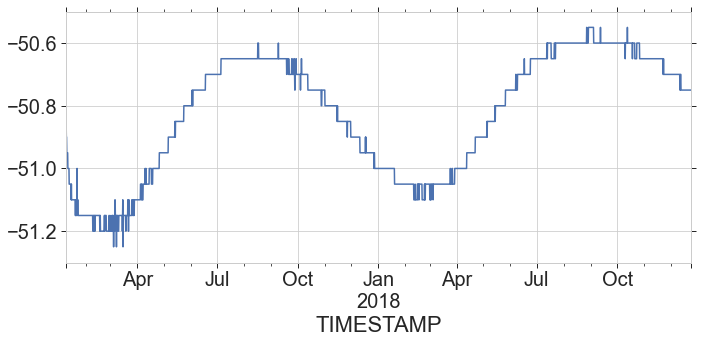

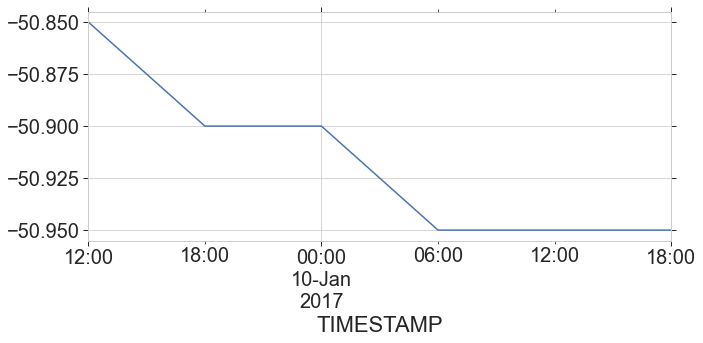

In [247]:
# This bit for T.J., 2/25/19
# change SP_PotsandTherm.py to include initial data
t10m=dft5.Therm_temp21
# t10m.to_csv('SP50_T10m.csv')

f1,a1=plt.subplots(figsize=(10,5))
t10m.plot(ax=a1)
a1.set_ylim(-51.3,-50.5)
f1.savefig('SP_T10m_all.pdf')

f2,a2=plt.subplots(figsize=(10,5))
t10m[:'2017-01-10'].plot(ax=a2)
a2.grid(True)
# a1.set_ylim(-51.3,-50.5)
f2.savefig('SP_T10m_initial.pdf')

t10m.mean()
t10m['2017-04-01':'2018-04-01'].mean()
dft5.Therm_temp7['2017-01-15':].mean()

In [248]:
t6m = dft5.Therm_temp5

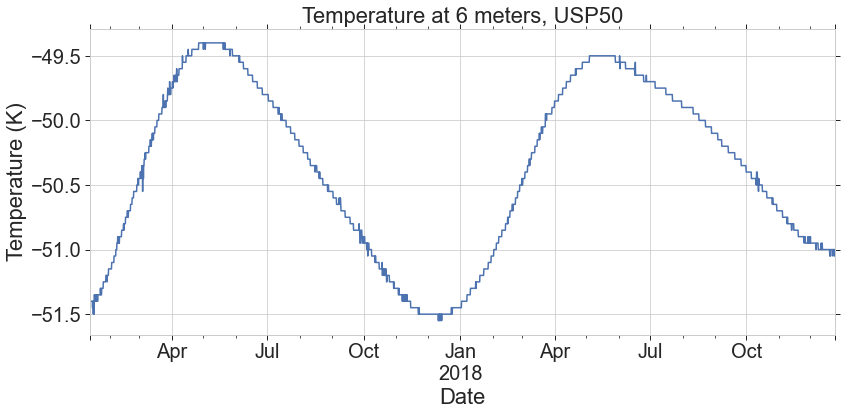

In [249]:
f3,a3=plt.subplots()
t6m['2017-01-13':].plot(ax=a3)
a3.set_title('Temperature at 6 meters, USP50')
a3.set_ylabel('Temperature (K)')
a3.set_xlabel('Date')
f3.savefig('USP50_T6m.pdf')

In [250]:
t6m.min()

-51.55

In [251]:
### Section to derive climatology from SPICE core, usp50, etc.
import scipy.interpolate

In [252]:
SPisotopes = pd.read_csv('SPICECORE_DEPTH_D17O_D18O_DD_VERSION1.TXT',delimiter= '\s+',header=13)
new_cols = SPisotopes.columns.values; new_cols[0] = 'depth'; SPisotopes.columns=new_cols
SPtimescale = pd.read_csv('SP19_Depth_Age.csv',delimiter=',',header=None,skiprows=1,usecols=[0,1],names=['depth','age'])
intfun = sp.interpolate.interp1d(SPtimescale.depth,SPtimescale.age)
SPisotopes['age'] = intfun(SPisotopes.depth)

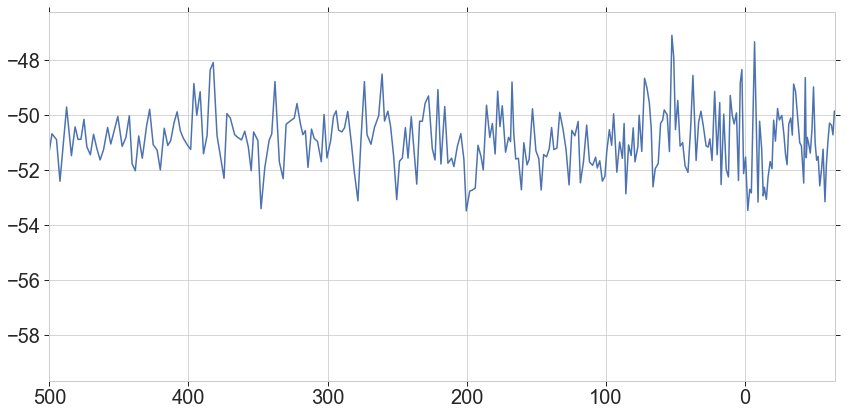

In [253]:
f1,a1 = plt.subplots()
a1.plot(SPisotopes.age,SPisotopes.d18O)
a1.set_xlim(-65,500)
a1.invert_xaxis()

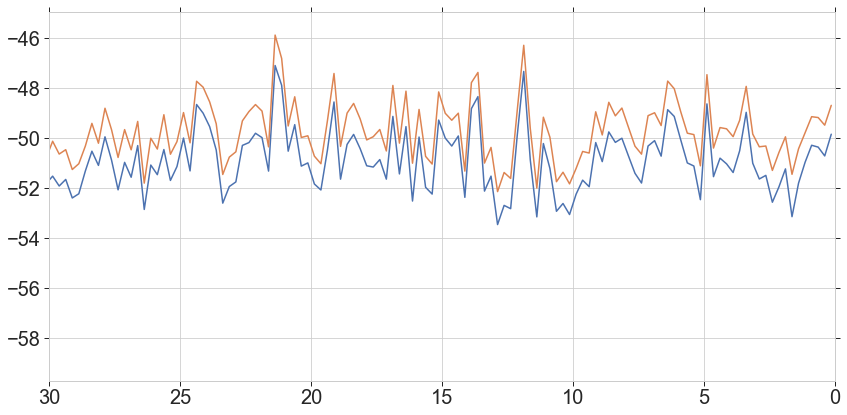

In [254]:
f1,a1 = plt.subplots()
a1.plot(SPisotopes.depth,SPisotopes.d18O)
a1.plot(SPisotopes.depth,SPisotopes.dD/8)
a1.set_xlim(0,30)
a1.invert_xaxis()

In [255]:
usp50_ts = pd.read_csv('USP50_Timescale.csv')
usp50_ts['tau']=usp50_ts.BP-usp50_ts.BP[0]

In [265]:
def meanrho(top,bot):
    return rho_int_df[((rho_int_df['dep_int']>top)&(rho_int_df['dep_int']<bot))]['rho_int'].mean()
#     return usp50_ts[(usp50_ts.Depth>=top) & (usp50_ts.Depth<=bot)].tau.max()

In [266]:
meanrho(usp50_ts.Depth[0],usp50_ts.Depth[1])

350.78469474913186

In [267]:
bdot_hold = np.ones(len(usp50_ts.index))
for ii in usp50_ts.index:
    if ii == 0:
        id0 = 0
        id1 = usp50_ts.Depth[ii]
    elif ii == (len(usp50_ts)-1):
        id0 = usp50_ts.Depth[ii]
        id1 = usp50_ts.Depth[ii]
    else:
        id0 = usp50_ts.Depth[ii]
        id1 = usp50_ts.Depth[ii+1]
#     thicc = usp50_ts.Thickness[ii]
#     MR = meanrho(id0,id1)
    bdot_hold[ii] = meanrho(id0,id1) * usp50_ts.Thickness[ii]
    

In [268]:
usp50_ts['bdot'] = bdot_hold

In [269]:
usp50_ts.bdot.mean()/917

0.07599284466333034

In [271]:
usp50_ts.head()

,Depth,BP,Year,Thickness,tau,bdot
0,0.577866,-66,2016,0.577866,0,182.870293
1,0.915818,-65,2015,0.337952,1,120.765494
2,1.158721,-64,2014,0.242903,2,87.741932
3,1.433307,-63,2013,0.274586,3,100.238002
4,1.655088,-62,2012,0.221781,4,81.321384


In [272]:
rho126=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_126.csv',delimiter=',',skip_header=1)
dep126=rho126[:,0]
den126=rho126[:,1]
rho106=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_106.csv',delimiter=',',skip_header=1)
dep106=rho106[:,0]
den106=rho106[:,1]*1000
rhopit=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_pit.csv',delimiter=',',skip_header=1)
deppit=rhopit[:,0]
denpit=rhopit[:,1]
rhonic=np.genfromtxt('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/SPdensity_nicl.csv',delimiter=',',skip_header=1)
depnic=rhonic[:,0]
dennic=rhonic[:,1]

dennic = np.append(290,dennic)
depnic = np.append(0,depnic)

densmooth = dennic.copy()
densmooth106 = den106.copy()
N=7
idr = int(np.floor(N/2))
densmooth[idr:-idr] = np.convolve(dennic,np.ones((N,))/N, mode='valid')
densmooth106[idr:-idr] = np.convolve(den106,np.ones((N,))/N, mode='valid')

pitsmooth=denpit.copy()
n2=7
idr2 = int(np.floor(n2/2))
pitsmooth[idr2:-idr2]=np.convolve(denpit,np.ones((n2,))/n2,mode='valid')
pitsmooth[deppit<0.2] = np.mean(pitsmooth[deppit<0.2])
# pitsmooth[0:idr2] = np.mean(pitsmooth[0:idr2])
pitsmooth[-idr2:] = np.mean(pitsmooth[-idr2:])

In [518]:
0.143

42.9

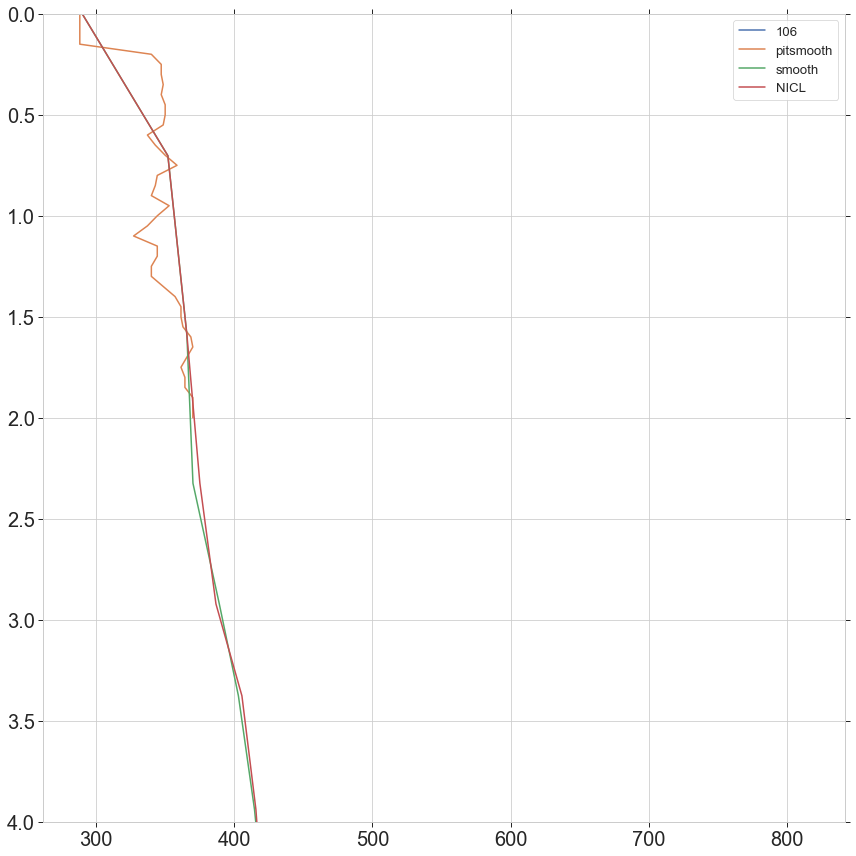

In [515]:
%matplotlib inline
f2,a2=plt.subplots(figsize=(12,12))
# a2.plot(den126,dep126)
a2.plot(den106,dep106,label='106')

a2.plot(pitsmooth,deppit,label='pitsmooth')
a2.plot(densmooth,depnic,label='smooth')
a2.plot(dennic,depnic,label='NICL')
a2.set_ylim(0,4)
a2.invert_yaxis()
a2.legend()

In [274]:
# dep_int=np.arange(0,108.1,0.1)
dep_int=np.arange(0,109.4,0.1)
rho_int = np.interp(dep_int,depnic,densmooth)
rho106_int = np.interp(dep_int,dep106,densmooth106)
rho_int_df = pd.DataFrame({'dep_int':dep_int,'rho_int':rho_int})

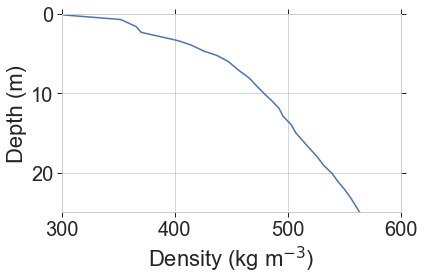

In [275]:
f1,a1=plt.subplots()
a1.plot(rho_int,dep_int)
# a1.plot(rho106_int,dep_int)
a1.set_ylim(0,25)
a1.set_xlim(300,600)
a1.invert_yaxis()

a1.set_ylabel('Depth (m)')
a1.set_xlabel(r'Density (kg m$^{-3}$)')
f1.savefig('USP50DepDenZ1.eps')

In [276]:
ageholdl = []

In [277]:
xx = meanrho(0,4.15)
print(xx)
ageholdl.append(xx)
print(ageholdl)

371.7707933519283
[371.7707933519283]


In [278]:
# These are one-off calculations for the upper firn, rho and age, for viscosity calculations
z1_diff_meanrho = [371.7707933519283, 371.7707933519283, 452.2008661788657, 452.2008661788657, 451.76697267162507, 451.76697267162507, 491.3462752544523, 491.0232941906156, 492.42433527257026, 492.10531465757117]
z1_diff_meanage = [8.0, 8.0, 31.0, 31.0, 31.0, 31.0, 60.5, 60.5, 62.0, 62.0]
z1_diff_meanage = [16.0, 16.0, 45.0, 45.0, 45.0, 45.0, 78, 78, 78, 78]

In [279]:
hole_length

array([  4.15,  79.75,  39.93,  29.57,  14.85, 105.75,  19.28,  24.65,
        14.43,   9.45,   9.6 ,   4.17])

In [280]:
hds = [14.65,15.1,19.53,24.85,29.82,40.16,80.0,106.0]
# hds = [4.15,4.17,9.6,9.45,29.82,40.16,80.0,106.0]

In [281]:
rmeanlist = []
for hh, hd1 in enumerate(hds):
    if hh==0:
        rmean = rho_int_df[((rho_int_df['dep_int']>hds[hh])&(rho_int_df['dep_int']<hds[hh+2]))]['rho_int'].mean()
        print(hds[hh],hds[hh+2])
        print(rmean)
    elif hh!=len(hds)-1:
        rmean = rho_int_df[((rho_int_df['dep_int']>hds[hh])&(rho_int_df['dep_int']<hds[hh+1]))]['rho_int'].mean()
        print(hds[hh],hds[hh+1])
        print(rmean)
    else:
        pass
    if hh!=len(hds)-1:
        rmeanlist.append(rmean)
rmeans = np.array(rmeanlist)
    

14.65 19.53
520.0439869958142
15.1 19.53
521.2539310099563
19.53 24.85
550.010931897392
24.85 29.82
573.4638672650665
29.82 40.16
600.1827655567474
40.16 80.0
674.881996572058
80.0 106.0
768.3372888877775


In [282]:
rmeans

array([520.043987  , 521.25393101, 550.0109319 , 573.46386727,
       600.18276556, 674.88199657, 768.33728889])

# Make files for model run using SP met data

In [559]:
dft4.depth.to_csv('ThermDepths.csv')

In [ ]:
### This is old; should be taken care of in SP_model.ipynb
# spT=pd.read_pickle('SPmontlyT_fromMET.pkl')
# months = (spT.index[0:12]).to_pydatetime()
# helper = np.vectorize(lambda x: x.timetuple().tm_yday)
# decis = (helper(months)-0.5)/365.25
# st_year = usp50bdot.index[0]
# years = 2019 - st_year
# yrvec = np.arange(st_year,st_year+years)
# yrtile = np.tile(yrvec[...,None],[1,12])
# allspintime = yrtile + decis
# allspintime_vec = np.ndarray.flatten(allspintime)
# spT_long = (np.concatenate((spT['1972':'2018'].values,np.tile(spT[:'2018'].values,16)))-1)
# T_out = np.array([allspintime_vec,spT_long])
# bdot_out = np.array([allspintime_vec,bdot_long])
# np.savetxt('USP50_T_2.csv',T_out,delimiter=',',fmt='%1.4f')
# np.savetxt('USP50_bdot_2.csv',bdot_out,delimiter=',',fmt='%1.4f')

# Pot calibration monkeying around

In [ ]:
Pot_Cal_df = pd.read_csv('/Users/maxstev/Documents/Grad_School/Research/SouthPole/DATA/2017/CR1000_Potdata_calibrate.dat',header=0,skiprows=[0,2,3],delimiter=',',na_values='NAN')   


In [ ]:
p2l = 550.0
P2c = Pot_Cal_df['Pots_Avg(2)']

In [ ]:
p2min = P2c.min()
p2max = P2c.max()

In [ ]:
sl = (p2max-p2min)/550.0

In [ ]:
p2max

In [ ]:
550*sl+p2min

In [ ]:
upper=(1-p2min)/sl
lower=(0-p2min)/sl
truerange = upper-lower

In [ ]:
print(0.2*truerange)
print(0.2*550.0)

In [ ]:
(truerange-550)/truerange*100

In [ ]:
p2max*550.0

In [ ]:
pot_data_all.iloc[stval]

In [ ]:
xx=np.arange(1,100)
k = 10
f1,a1=plt.subplots()
a1.plot(np.exp(-k/np.diff(xx)),xx[1:])
a1.invert_yaxis()

In [ ]:
np.exp(-1)

# FFT stuff

In [150]:
import scipy.fftpack as SFP

In [593]:
# 3 is filtered; 6 is unfiltered
cr1 = dfp3.compaction_rate6.values
cr1_fft = SFP.fft(cr1)
cr1_psd = np.abs(cr1_fft)**2
fftfreq = SFP.fftfreq(len(cr1_psd), 1/4)
ii = fftfreq > 0

In [594]:
cr1

array([6.92556833e-09, 6.81152879e-09, 6.74430660e-09, ...,
       4.45802925e-09, 4.60248156e-09, 4.60313398e-09])

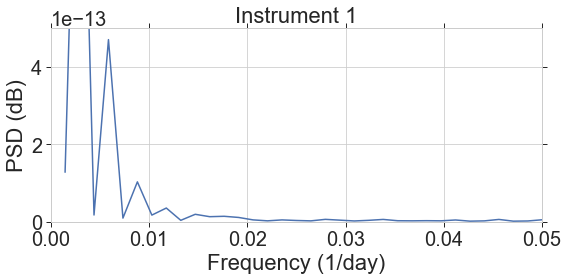

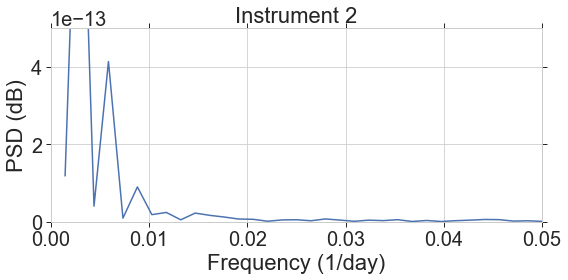

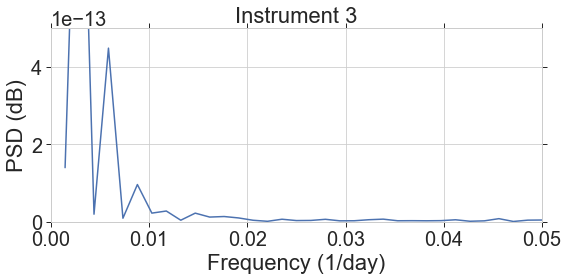

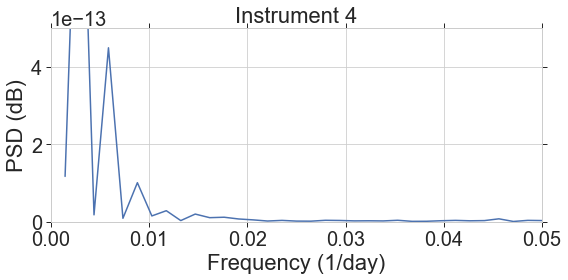

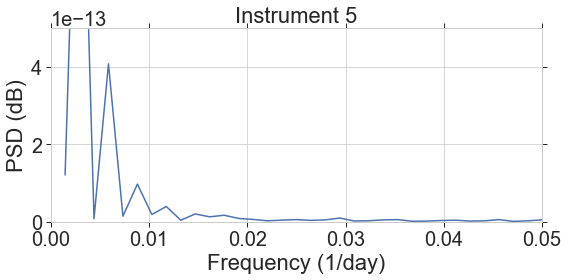

...

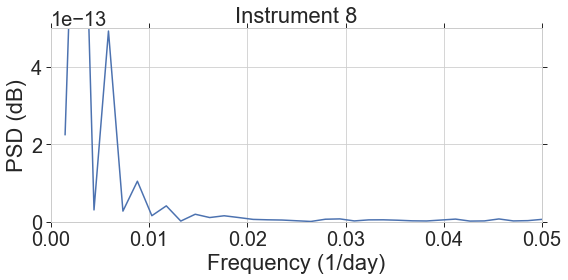

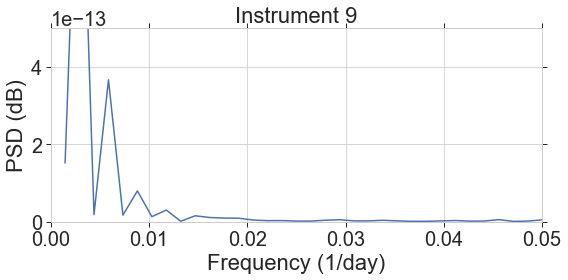

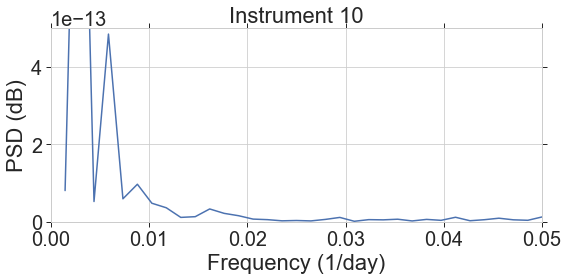

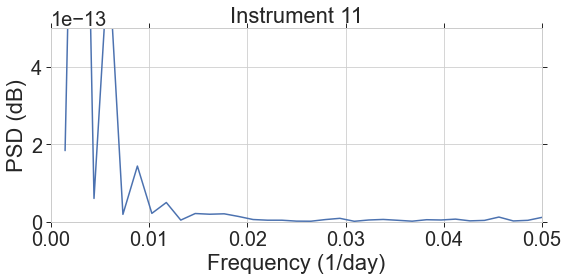

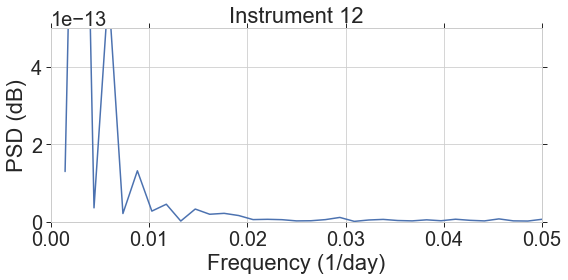

In [595]:
for jj in range(12):
    inum = jj+1
    cr1 = dfp3['compaction_rate{}'.format(inum)].values
    cr1_fft = SFP.fft(cr1)
    cr1_psd = np.abs(cr1_fft)**2
    fftfreq = SFP.fftfreq(len(cr1_psd), 1/4)
    ii = fftfreq > 0
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    ax.plot(fftfreq[ii], cr1_psd[ii])
    ax.set_xlim(0, 1)
    ax.set_ylim(0,5e-13)
    ax.set_xlim(0.0,0.05)
    ax.set_title('Instrument {}'.format(inum))
    ax.set_xlabel('Frequency (1/day)')
    ax.set_ylabel('PSD (dB)')

In [596]:
therm_order = [int(re.findall('[0-9]+',kk)[0]) for kk in dft4.index[1:]]

In [597]:
def crosscorr(datax, datay, lag=0, wrap=False):
    """ Lag-N cross correlation. 
    Shifted data filled with NaNs 
    
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length
    Returns
    ----------
    crosscorr : float
    """
    if wrap:
        shiftedy = datay.shift(lag)
        shiftedy.iloc[:lag] = datay.iloc[-lag:].values
        return datax.corr(shiftedy)
    else: 
        return datax.corr(datay.shift(lag))

In [604]:
therm_order

[1,
 9,
 17,
 2,
 10,
 18,
 3,
 11,
 19,
 4,
 12,
 20,
 5,
 13,
 21,
 6,
 14,
 22,
 7,
 15,
 23,
 8,
 16]

In [637]:
crosscorr(dfp3['compaction_rate2'],dfp3['compaction_rate3'])

0.9679352486546909

In [608]:
112/4

28.0

In [686]:
for jj in range(12):
    inum = jj+1
    ccx = [crosscorr(dft5.Therm_temp1,dfp3['compaction_rate{}'.format(inum)],lag=kk) for kk in range(-224,224)]
    print('instrument #: ', inum)
    mind = np.where(ccx == max(ccx))[0][0]
    print('lag =',mind/4)
    print('r =', ccx[mind])
    print('---------')

instrument #:  1
lag = 22.25
r = 0.9220312318720383
---------
instrument #:  2
lag = 22.5
r = 0.874346440533553
---------
instrument #:  3
lag = 19.25
r = 0.9101555739417378
---------
instrument #:  4
lag = 13.5
r = 0.8991554165162058
---------
instrument #:  5
lag = 12.5
r = 0.908150086771183
---------
instrument #:  6
lag = 25.5
r = 0.9016168024985982
---------
instrument #:  7
lag = 13.0
r = 0.8990733011892725
---------
instrument #:  8
lag = 24.25
r = 0.898523024617083
---------
instrument #:  9
lag = 12.75
r = 0.9033149572936496
---------
instrument #:  10
lag = 23.75
r = 0.8963116131105459
---------
instrument #:  11
lag = 25.25
r = 0.9127050930395707
---------
instrument #:  12
lag = 25.25
r = 0.9198847547409439
---------


In [623]:
for jj,Tnum in enumerate(therm_order):
#     Tnum = jj+1
#     ccx = [crosscorr(dft5.Therm_temp19,dfp3['compaction_rate{}'.format(inum)],lag=kk) for kk in range(112)]
    ccx = [ crosscorr(dft5['Therm_temp{}'.format(Tnum)],dfp3['compaction_rate{}'.format(2)],lag=kk) for kk in range(200)]
    print(Tnum)
    mind = np.where(ccx == max(ccx))[0][0]
    print(mind, ccx[mind])
    print('---------')

1
0 0.5655055232934392
---------
9
0 0.6671422029751402
---------
17
0 0.7514534218022443
---------
2
0 0.8218108254464677
---------
10
0 0.8739908186452026
---------
18
0 0.9066123384014909
---------
3
0 0.9243016700004192
---------
11
15 0.9272822840898325
---------
19
63 0.9218285751647715
---------
4
105 0.9160838992095751
---------
12
190 0.8966755712094169
---------
20
199 0.8277648548129883
---------
5
199 0.6541116731686045
---------
13
199 0.06362823602161818
---------
21
199 -0.5427264511363233
---------
6
0 -0.6968883872974754
---------
14
0 -0.4107160633793018
---------
22
0 0.12894814975885044
---------
7
0 0.1662113774926934
---------
15
188 0.1402552408063409
---------
23
182 -0.021902673875318787
---------
8
193 0.026866998767567495
---------
16
199 -0.025592341934245613
---------


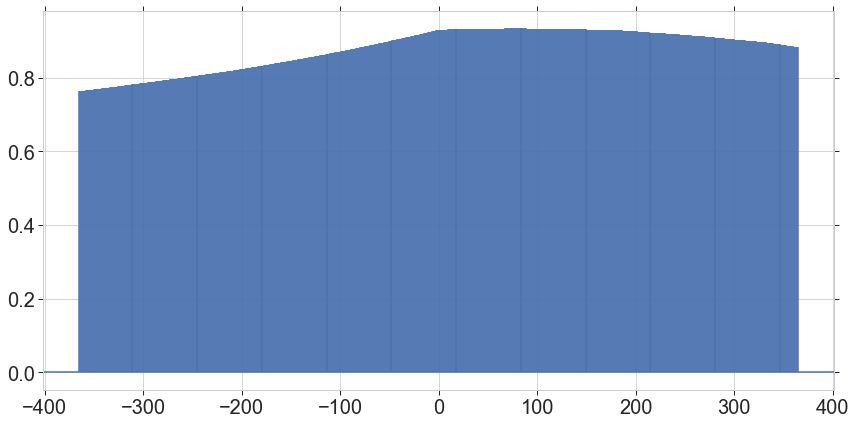

In [158]:
y = -1*dfp3['compaction_rate{}'.format(4)]
x = dft5[dfp3.index[0]:dfp3.index[-1]]['Therm_temp{}'.format(1)]
f1,a1=plt.subplots()
a1.xcorr(x, y, normed=True, usevlines=True, maxlags=365);
# a1.set_xlim(0,28)
# plt.title("Sunlight Hours versus Maximum Temperature")
# plt.show()


In [611]:
out = np.correlate(x/np.std(x), y/np.std(y), "full")/len(x)

In [612]:
tdepths_sorted = np.sort(therm_depths)

In [613]:
drilled_hole_lengths_round = np.round(np.array([4.4,80.0,40.16,29.82,15.1,106.0,19.53,24.85,14.65,9.65,9.75,4.42]))
drilled_hole_lengths = np.array([4.4,80.0,40.16,29.82,15.1,106.0,19.53,24.85,14.65,9.65,9.75,4.42])
hole_labels = ['4a', '80', '40', '30', '15a', '106', '20', '25', '15b', '10a', '10b','4b']

In [614]:
therm_order[0:12]

[1, 9, 17, 2, 10, 18, 3, 11, 19, 4, 12, 20]

In [615]:
(drilled_hole_lengths).astype(int).astype(str)

array(['4', '80', '40', '29', '15', '106', '19', '24', '14', '9', '9',
       '4'], dtype='<U21')

In [616]:
np.round(rs[0],4)

0.6625

In [617]:
# lagrange = 4*180
# # INO = 2
# plt.ioff()
# for mm, Ilabel in enumerate(hole_labels):
#     INO = mm+1
#     f1, axs = plt.subplots(12,figsize = (8,20))
#     for ll,TNO in enumerate(therm_order[0:12]):
#     #     TNO = 9
#         d2C = dfp3[dfp3.index[0]:dfp3.index[800]]['compaction_rate{}'.format(INO)]
#         d1C = dft5[dfp3.index[0]:dfp3.index[800]]['Therm_temp{}'.format(TNO)]
#         rs = [crosscorr(d1C,d2C, lag) for lag in range(-int(lagrange),int(lagrange+1))]
#         # in this function d2C gets the shift
#         offset = np.ceil(len(rs)/2)-np.argmax(rs)
# #         f1,a1=plt.subplots(figsize=(10,4))
#         axs[ll].plot(rs)
#         a1.axvline(np.ceil(len(rs)/2),color='k',linestyle='-',label='Center')
#         a1.axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony')
#         a1.set_title(f'Peak r at {offset/4} days = {np.round(np.max(rs),4)}\nInstrument {INO} ({drilled_hole_lengths[mm]} m), Thermistor {TNO} ({tdepths_sorted[ll]} m)\nTemperature leads <> Compaction leads')
#         a1.set_ylim([-1,1])
#         # a1.set_xlim([-720,720])
#         a1.set_xlabel('Lag (days)')
#         a1.set_ylabel('Pearson r')
#         xts = np.arange(0,lagrange*2+1,120)
#         midind = int(np.floor(len(xts)/2))
#         xts[midind:] = xts[midind:] + 1
#         a1.set_xticks(xts)
#         a1.set_xticklabels((np.arange(-lagrange,lagrange+1,120)/4).astype(int));
#         a1.legend();
#         f1.savefig('CrossCorr_{}.pdf'.format(INO));
#         plt.close()

In [691]:
therm_depths[9]

1.0

In [695]:
dft3

RECORD,121,122,123,124,125,126,127,128,129,130,...,2862,2863,2864,2865,2866,2867,2868,2869,2870,depth
TIMESTAMP,2017-02-05 12:00:00,2017-02-05 18:00:00,2017-02-06 00:00:00,2017-02-06 06:00:00,2017-02-06 12:00:00,2017-02-06 18:00:00,2017-02-07 00:00:00,2017-02-07 06:00:00,2017-02-07 12:00:00,2017-02-07 18:00:00,...,2018-12-22 18:00:00,2018-12-23 00:00:00,2018-12-23 06:00:00,2018-12-23 12:00:00,2018-12-23 18:00:00,2018-12-24 00:00:00,2018-12-24 06:00:00,2018-12-24 12:00:00,2018-12-24 18:00:00,-9999.00
Therm_temp1,-32.05,-31.85,-33.0,-31.4,-29.85,-29.45,-29.1,-29.2,-31.0,-31.65,...,-38.05,-38.0,-37.9,-37.85,-37.75,-37.8,-37.65,-37.6,-37.55,0.00
Therm_temp2,-35.95,-36.0,-36.0,-36.05,-36.1,-36.1,-36.15,-36.15,-36.1,-36.1,...,-44.6,-44.5,-44.45,-44.4,-44.35,-44.3,-44.25,-44.15,-44.1,0.75
Therm_temp3,-39.7,-39.75,-39.75,-39.75,-39.75,-39.75,-39.8,-39.8,-39.8,-39.8,...,-48.35,-48.3,-48.25,-48.2,-48.2,-48.15,-48.1,-48.05,-48.0,1.50
Therm_temp4,-46.25,-46.2,-46.2,-46.2,-46.15,-46.15,-46.15,-46.1,-46.1,-46.05,...,-50.7,-50.7,-50.65,-50.65,-50.65,-50.65,-50.6,-50.6,-50.6,3.00
Therm_temp5,-51.05,-51.05,-51.05,-51.05,-51.0,-51.0,-51.0,-51.0,-50.95,-50.95,...,-51.0,-51.0,-51.0,-51.0,-51.0,-51.05,-51.0,-51.0,-51.0,6.00
Therm_temp6,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,-50.75,...,-50.55,-50.55,-50.55,-50.55,-50.55,-50.55,-50.55,-50.55,-50.55,12.00
Therm_temp7,-50.75,-50.75,-50.75,-50.75,-50.75,-50.75,-50.75,-50.75,-50.75,-50.85,...,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,-50.8,20.00
Therm_temp8,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,...,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,-51.05,35.00
Therm_temp9,-34.15,-34.25,-34.5,-34.4,-34.1,-33.8,-33.5,-33.3,-33.2,-33.35,...,-41.1,-41.0,-40.95,-40.85,-40.75,-40.75,-40.65,-40.6,-40.5,0.25


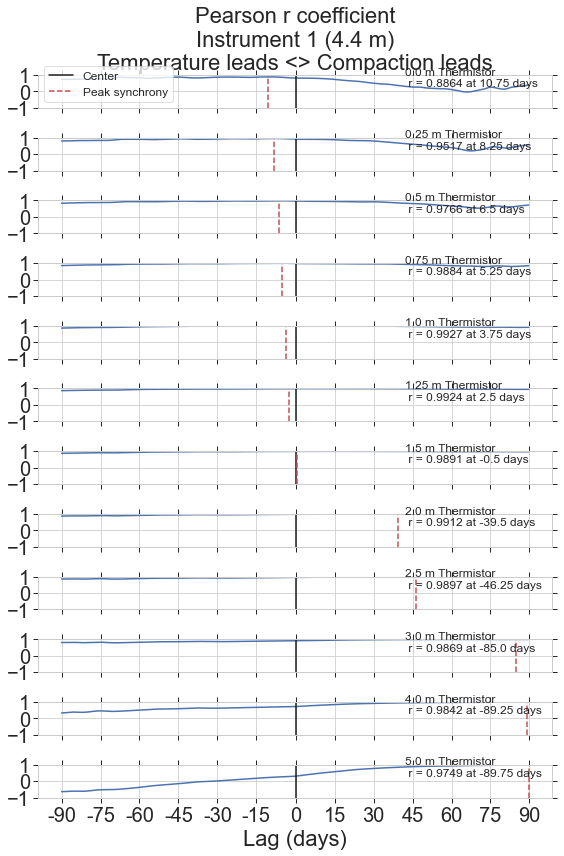

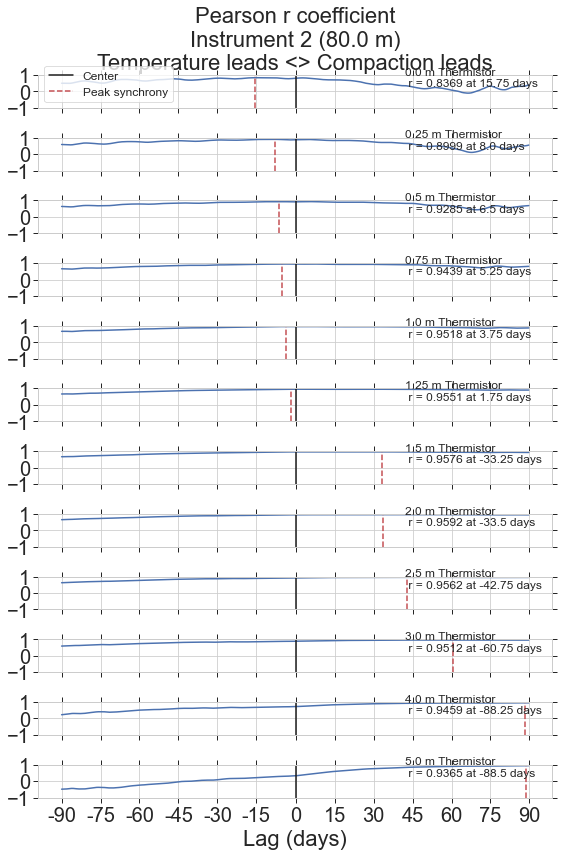

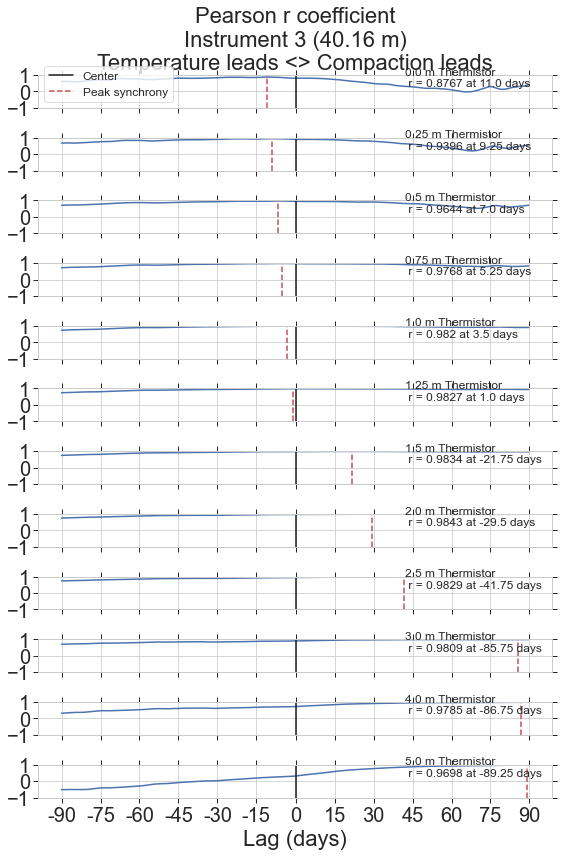

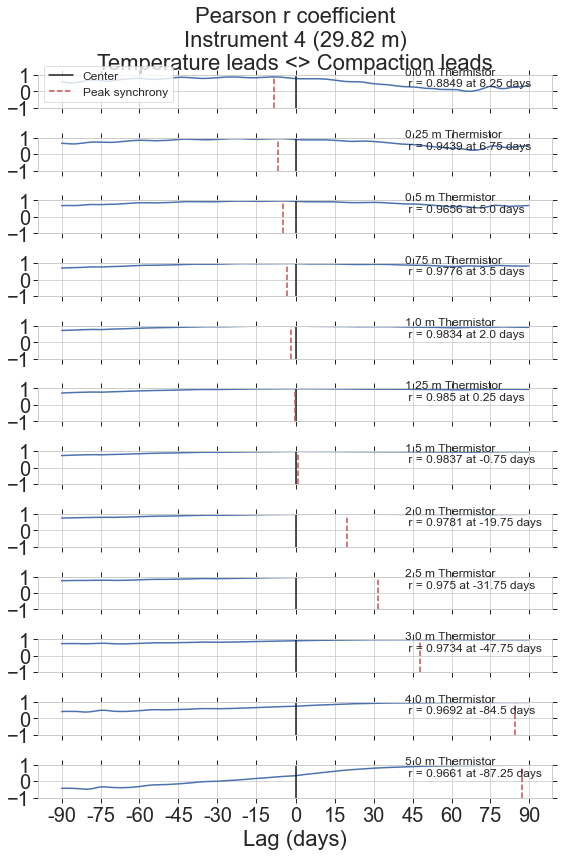

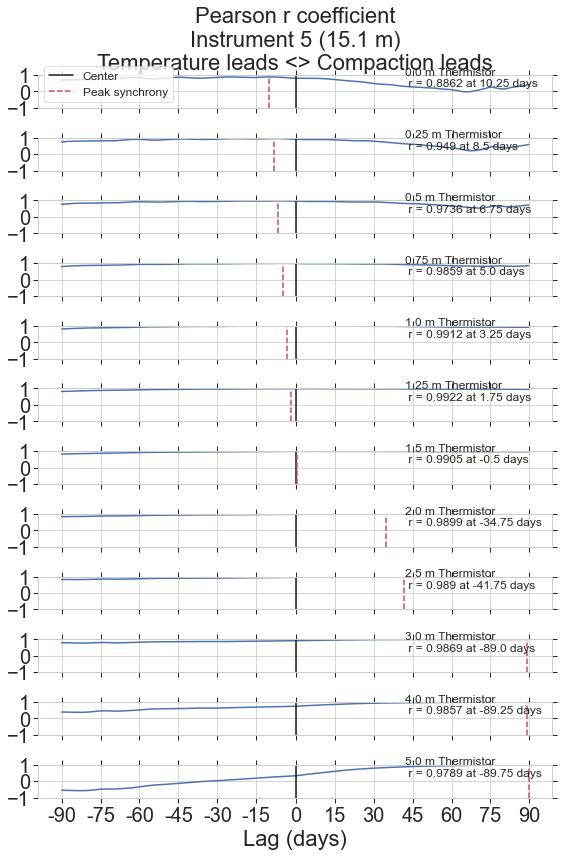

...

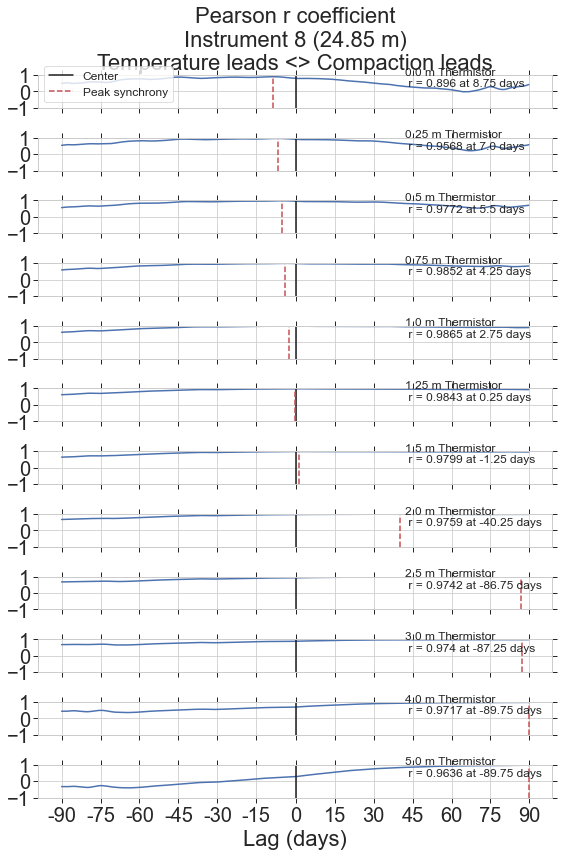

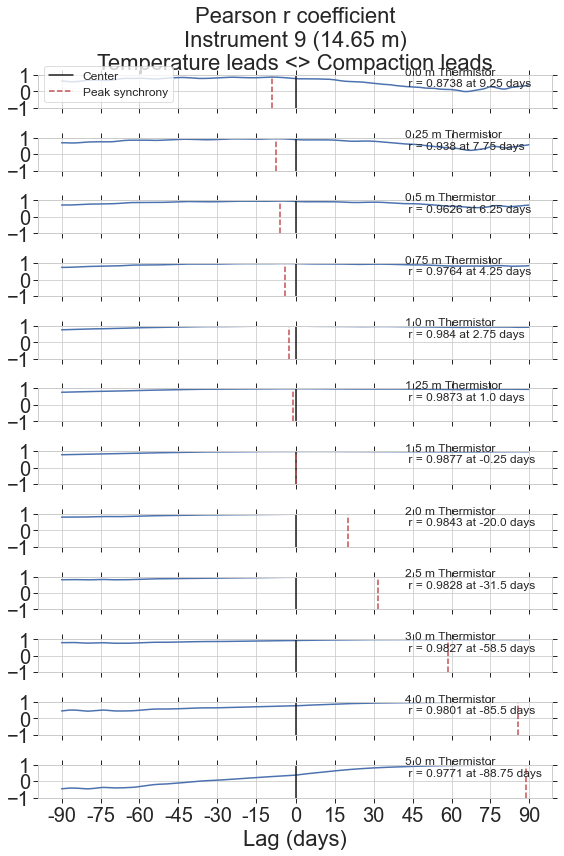

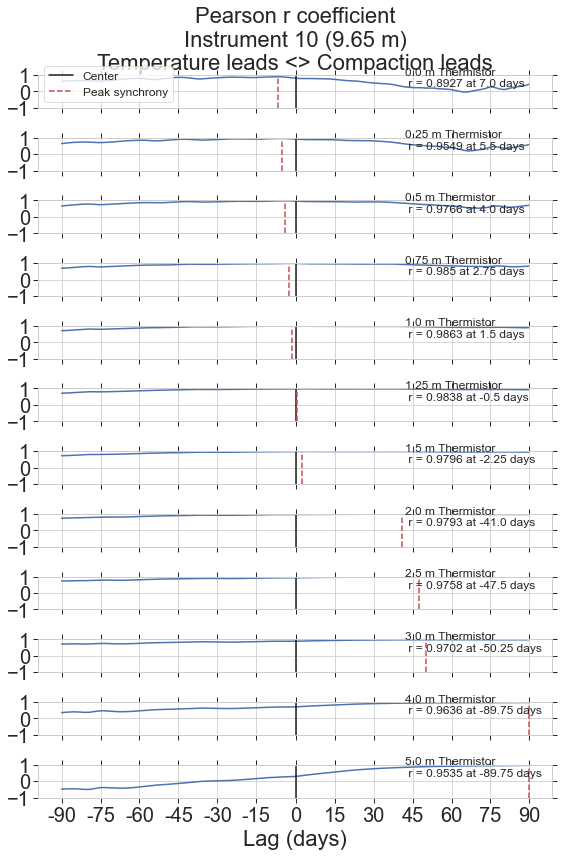

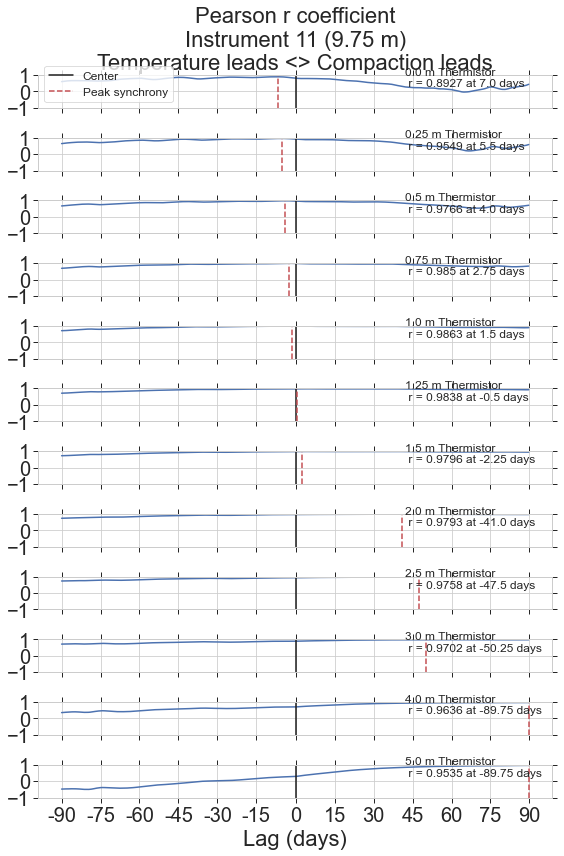

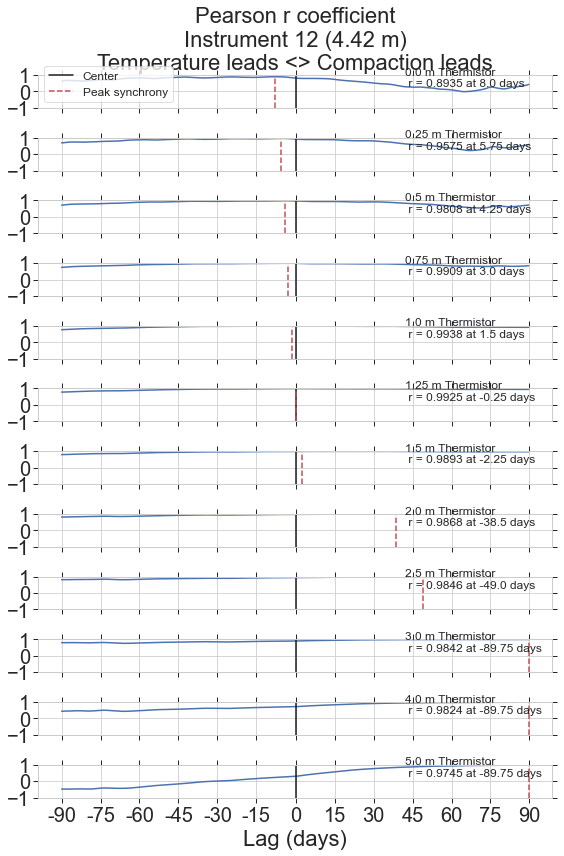

In [687]:
lagrange = 4*90 #lag range, days
# INO = 2
plt.ion()
for mm, Ilabel in enumerate(hole_labels):
    INO = mm+1
#     if INO!=2:
#         continue
    nothms = 12
    f1, axs = plt.subplots(nothms,figsize = (8,12))
    for ll,TNO in enumerate(therm_order[0:nothms]):
    #     TNO = 9
        d2C = dfp3[dfp6.index[0]:dfp6.index[800]]['compaction_rate{}'.format(INO)]
        d1C = dft5[dfp6.index[0]:dfp6.index[800]]['Therm_temp{}'.format(TNO)]
#         d1C = dfp5[dfp6.index[0]:dfp6.index[800]]['T_box{}'.format(INO)]
        rs = [crosscorr(d1C,d2C, lag) for lag in range(-int(lagrange),int(lagrange+1))]
        # in this function d2C gets the shift
        offset = np.ceil(len(rs)/2)-np.argmax(rs)
#         f1,a1=plt.subplots(figsize=(10,4))
        axs[ll].plot(rs);
        axs[ll].axvline(np.ceil(len(rs)/2),color='k',linestyle='-',label='Center');
        axs[ll].axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony');
        if ll == 0:
            axs[ll].set_title('Pearson r coefficient\nInstrument {} ({} m)\nTemperature leads <> Compaction leads'.format(INO,drilled_hole_lengths[mm]));
            axs[ll].legend(loc=3,fontsize=12);
#         axs[ll].set_title(f'Peak r at {offset/4} days = {np.round(np.max(rs),4)}\nInstrument {INO} ({drilled_hole_lengths[mm]} m), Thermistor {TNO} ({tdepths_sorted[ll]} m)\nTemperature leads <> Compaction leads')
        axs[ll].set_ylim([-1,1]);
        # a1.set_xlim([-720,720])
#         a[ll].set_xlabel('Lag (days)')
#         a[ll].set_ylabel('Pearson r')
        xts = np.arange(0,lagrange*2+1,60)
        midind = int(np.floor(len(xts)/2))
        xts[midind:] = xts[midind:] + 1
        axs[ll].set_xticks(xts);
        if ll==11:
            axs[ll].set_xticklabels((np.arange(-lagrange,lagrange+1,60)/4).astype(int));
            axs[ll].set_xlabel('Lag (days)');
        else:
            axs[ll].set_xticklabels([]);
        axs[ll].annotate('{} m Thermistor\n r = {} at {} days'.format(tdepths_sorted[ll],np.round(np.max(rs),4),offset/4),(530,0.3),fontsize=12);
        
#         f1.savefig('CrossCorr_{}_unfilt.pdf'.format(INO));
#         plt.close()

In [167]:
# ih = np.where(n_grid>0)[0][0]
for ii,vv in enumerate(n_grid[0:50]):
    if ii==0:
        df_Ti = pd.DataFrame({'m{}'.format(ii):dataT[ii,:]},index=pd.DatetimeIndex(tm))
    else:
        df_Ti['m{}'.format(ii)] = dataT[ii,:]

NameError: name 'n_grid' is not defined

In [ ]:
df_Ti.m9.plot()

In [306]:
dfp5

,RECORD,T_box1,T_box2,T_box3,T_box4,T_box5,T_box6,T_box7,T_box8,T_box9,T_box10,T_box11,T_box12,LoggerTemp,PanelTemp
TIMESTAMP,,,,,,,,,,,,,,,
2017-02-09 12:00:00,137,-36.999898,-36.631431,-37.182040,-37.011306,-36.971288,-36.729848,-37.233034,-37.210391,-37.362882,-36.891084,-36.590806,-36.816345,-18.058446,-18.34
2017-02-09 18:00:00,138,-36.130734,-36.136663,-36.059562,-36.284234,-36.646366,-36.537117,-36.647518,-36.255969,-36.007232,-36.179244,-35.574667,-36.314808,-18.203885,-18.50
2017-02-10 00:00:00,139,-35.443873,-35.770817,-35.364464,-35.638162,-36.317691,-36.282408,-36.347073,-35.352241,-35.099925,-35.192545,-34.826043,-35.836878,-18.202842,-18.59
2017-02-10 06:00:00,140,-35.394343,-35.528367,-35.607227,-35.314765,-36.074849,-36.051105,-36.240507,-35.655613,-35.485807,-35.546604,-35.234933,-35.595119,-18.203364,-18.61
2017-02-10 12:00:00,141,-35.834356,-35.738207,-36.368083,-35.906220,-36.232815,-36.067104,-36.705867,-36.705867,-36.403256,-36.578287,-35.720128,-35.888277,-18.403063,-18.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-20 00:00:00,2851,-37.837670,-37.970019,-38.637775,-39.827120,-40.719650,-40.365064,-40.329862,-39.574832,-39.120970,-80.000000,-37.654551,-37.798948,-27.881446,-28.65
2018-12-20 06:00:00,2852,-37.760431,-37.882147,-38.568292,-39.750418,-40.645372,-40.309987,-40.249505,-39.497414,-39.058047,-80.000000,-37.626962,-37.754900,-27.829316,-28.57
2018-12-20 12:00:00,2853,-37.704922,-37.826889,-38.514502,-39.688660,-40.585586,-40.289831,-40.188862,-39.440271,-39.010534,-80.000000,-37.587913,-37.732683,-27.759698,-28.53


<AxesSubplot:xlabel='TIMESTAMP'>

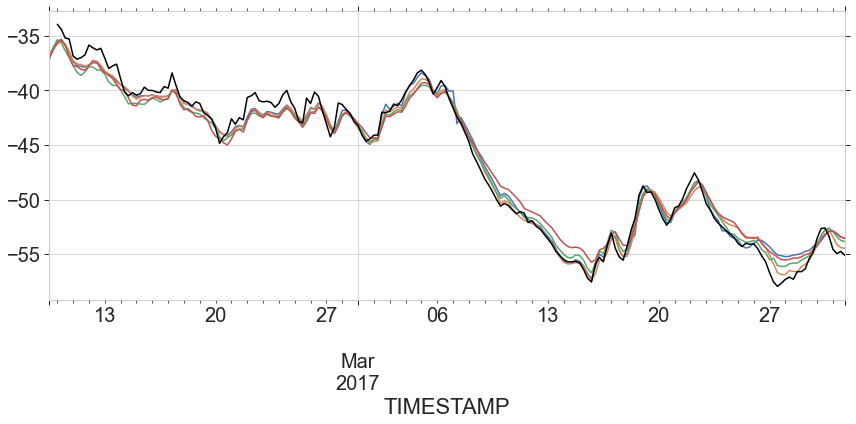

In [316]:
f1,a1=plt.subplots()
dfp5.T_box1[:'3-2017'].plot(ax=a1)
dfp5.T_box2[:'3-2017'].plot(ax=a1)
dfp5.T_box3[:'3-2017'].plot(ax=a1)
dfp5.T_box4[:'3-2017'].plot(ax=a1)
dft5.Therm_temp1['2-10-2017':'3-2017'].plot(ax=a1,color='black')

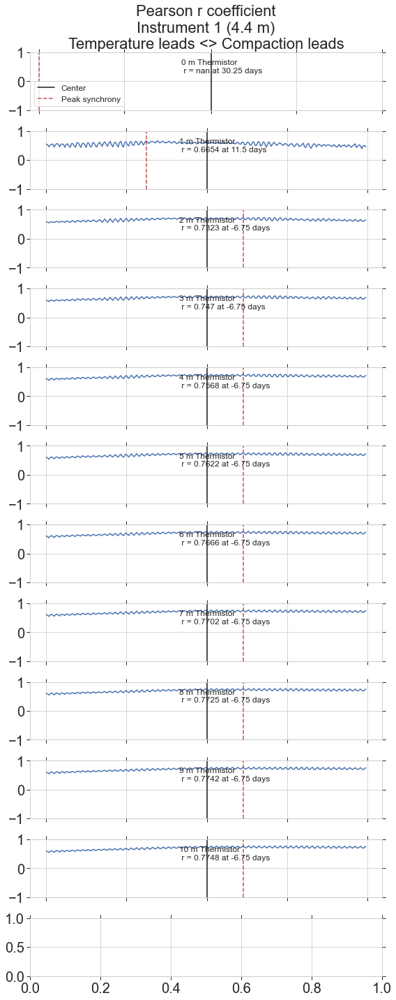

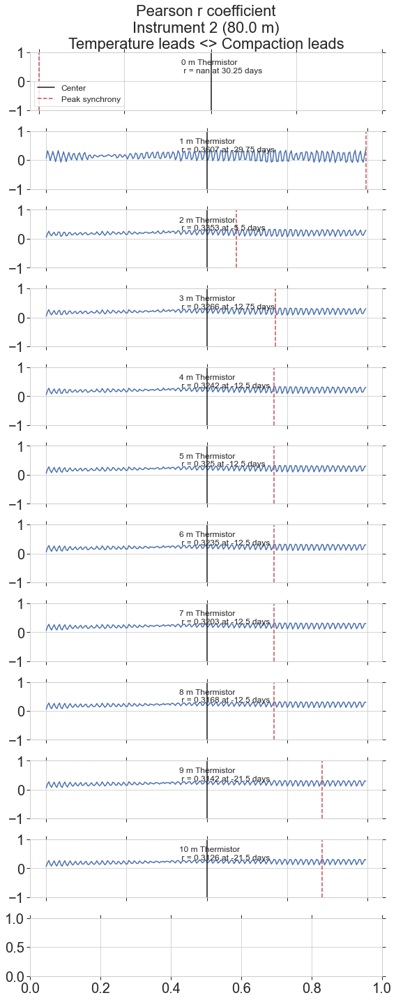

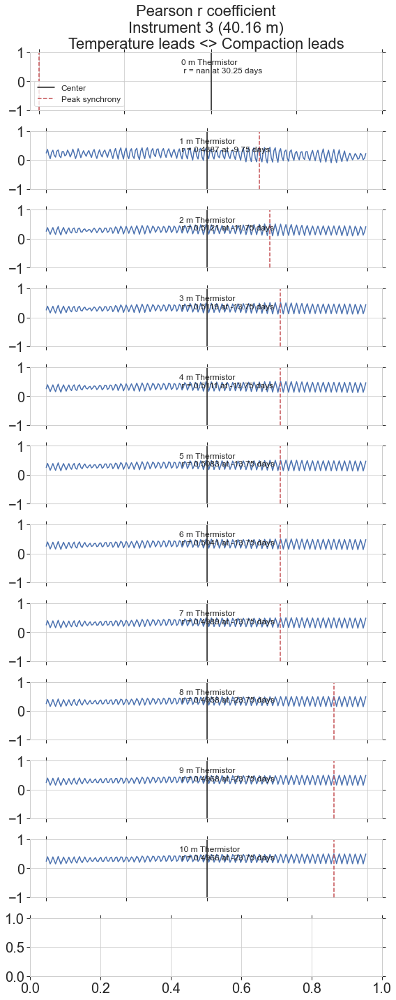

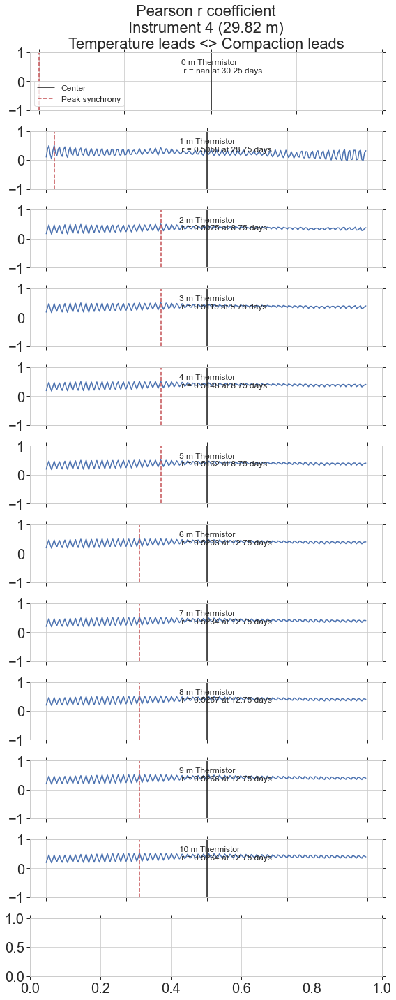

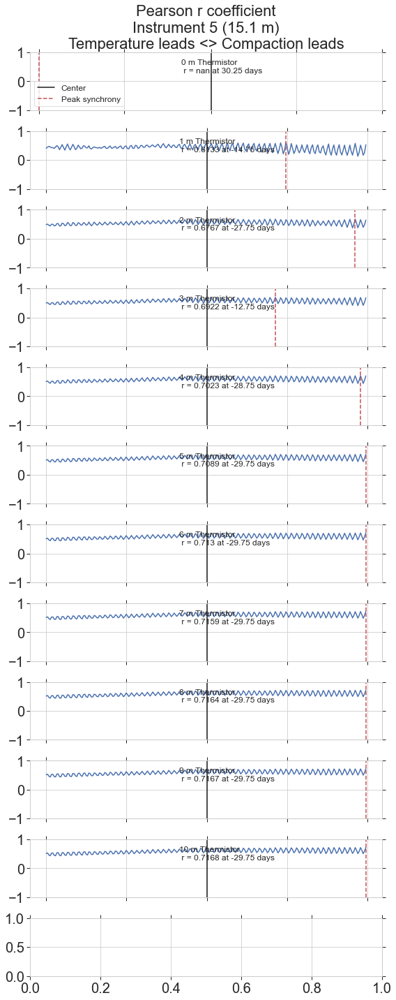

...

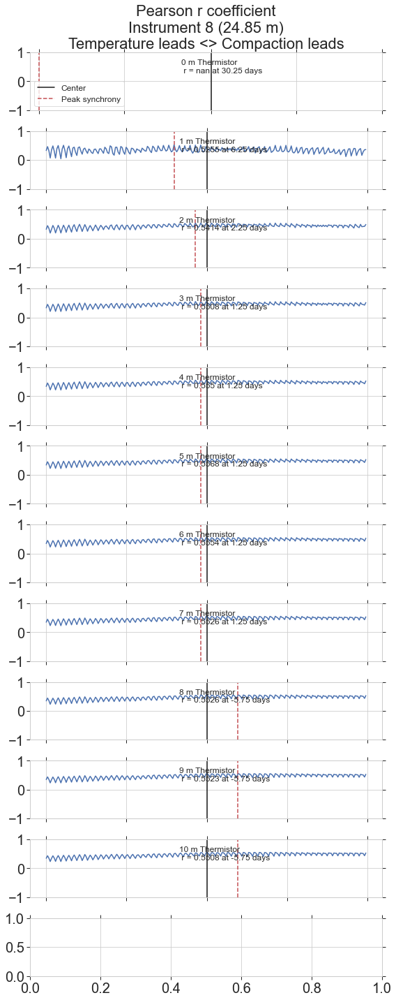

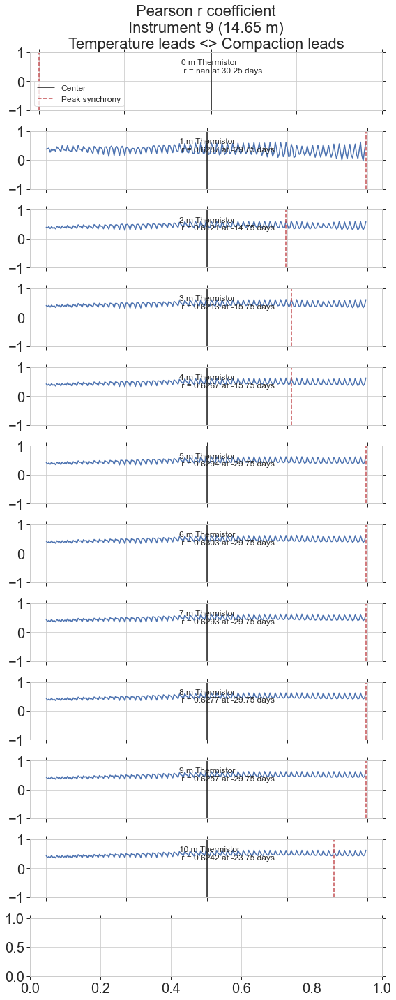

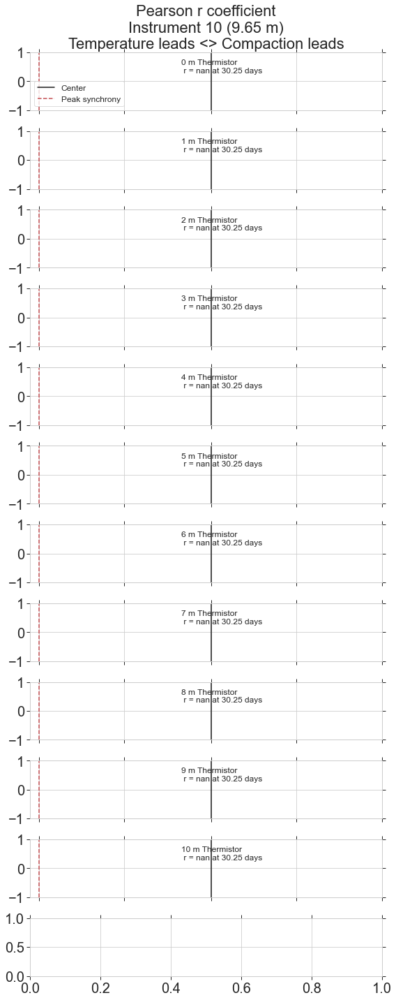

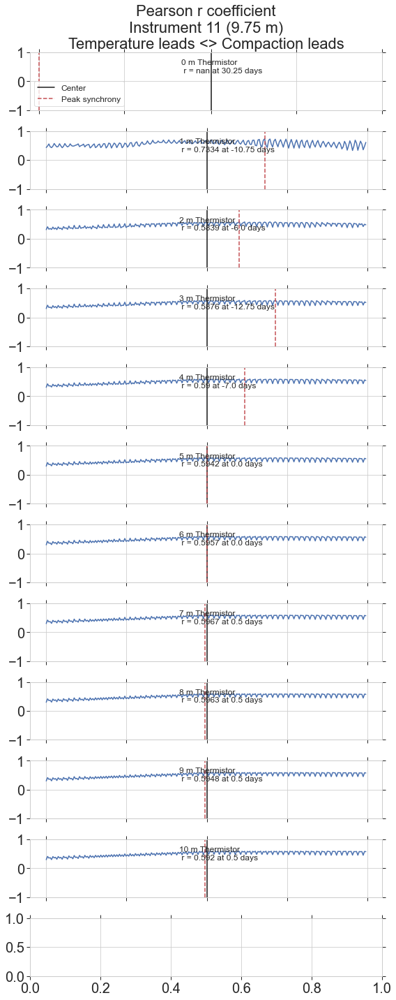

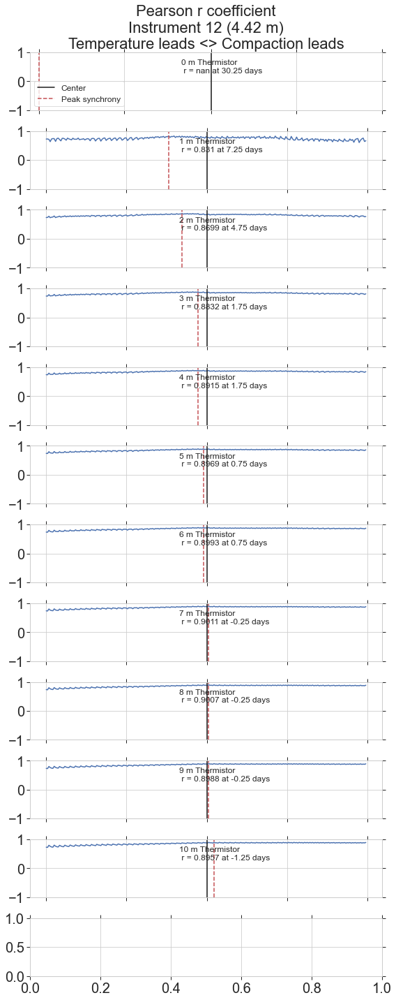

In [438]:
lagrange = 4*30 #lag range, days
# INO = 2
plt.ion()
for mm, Ilabel in enumerate(hole_labels):
    INO = mm+1
#     if INO!=2:
#         continue
    f1, axs = plt.subplots(12,figsize = (8,20))
    for ll,TNO in enumerate(np.arange(0,11)):
    #     TNO = 9
        d2C = dfp6[dfp6.index[0]:dfp6.index[800]]['compaction_rate{}'.format(INO)]
        d1C = df_Ti[dfp6.index[0]:dfp6.index[800]]['m{}'.format(TNO)]
#         d1C = dft5[dfp6.index[0]:dfp6.index[-1]]['Therm_temp{}'.format(TNO)]
        
        rs = [crosscorr(d1C,d2C, lag) for lag in range(-int(lagrange),int(lagrange+1))]
        # in this function d2C gets the shift
        offset = np.ceil(len(rs)/2)-np.argmax(rs)
#         f1,a1=plt.subplots(figsize=(10,4))
        axs[ll].plot(rs);
        axs[ll].axvline(np.ceil(len(rs)/2),color='k',linestyle='-',label='Center');
        axs[ll].axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony');
        if ll == 0:
            axs[ll].set_title('Pearson r coefficient\nInstrument {} ({} m)\nTemperature leads <> Compaction leads'.format(INO,drilled_hole_lengths[mm]));
            axs[ll].legend(loc=3,fontsize=12);
#         axs[ll].set_title(f'Peak r at {offset/4} days = {np.round(np.max(rs),4)}\nInstrument {INO} ({drilled_hole_lengths[mm]} m), Thermistor {TNO} ({tdepths_sorted[ll]} m)\nTemperature leads <> Compaction leads')
        axs[ll].set_ylim([-1,1]);
        # a1.set_xlim([-720,720])
#         a[ll].set_xlabel('Lag (days)')
#         a[ll].set_ylabel('Pearson r')
        xts = np.arange(0,lagrange*2+1,60)
        midind = int(np.floor(len(xts)/2))
        xts[midind:] = xts[midind:] + 1
        axs[ll].set_xticks(xts);
        if ll==11:
            axs[ll].set_xticklabels((np.arange(-lagrange,lagrange+1,60)/4).astype(int));
            axs[ll].set_xlabel('Lag (days)');
        else:
            axs[ll].set_xticklabels([]);
        axs[ll].annotate('{} m Thermistor\n r = {} at {} days'.format(TNO,np.round(np.max(rs),4),offset/4),(100,0.3),fontsize=12);
        
        f1.savefig('CrossCorr_{}_unfilt.pdf'.format(INO));

In [302]:
kks = list(dfp3.columns)

In [303]:
re.findall('compaction\d',kks[1])

['compaction1']

In [304]:
Clist = ['compaction{}'.format(qq) for qq in np.arange(1,13)]

In [305]:
dfp3[Clist]

,compaction1,compaction2,compaction3,compaction4,compaction5,compaction6,compaction7,compaction8,compaction9,compaction10,compaction11,compaction12
TIMESTAMP,,,,,,,,,,,,
2017-01-23 12:00:00,0.004311,0.004827,0.005167,0.004972,0.004959,0.004879,0.005111,0.005480,0.004806,NaN,0.006013,0.005271
2017-01-23 18:00:00,0.004404,0.004971,0.005296,0.005096,0.005074,0.005049,0.005232,0.005613,0.004916,NaN,0.006156,0.005392
2017-01-24 00:00:00,0.004496,0.005115,0.005422,0.005221,0.005186,0.005216,0.005350,0.005744,0.005026,NaN,0.006299,0.005512
2017-01-24 06:00:00,0.004591,0.005257,0.005547,0.005343,0.005298,0.005384,0.005468,0.005876,0.005134,NaN,0.006440,0.005632
2017-01-24 12:00:00,0.004683,0.005400,0.005672,0.005465,0.005409,0.005553,0.005586,0.006007,0.005241,NaN,0.006580,0.005752
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-09 18:00:00,0.091878,0.253137,0.212154,0.198365,0.165352,0.273614,0.180515,0.196145,0.157870,0.145013,0.150065,0.098818
2018-12-10 00:00:00,0.091902,0.253217,0.212217,0.198426,0.165402,0.273699,0.180569,0.196206,0.157915,0.145051,0.150109,0.098842
2018-12-10 06:00:00,0.091925,0.253297,0.212280,0.198487,0.165452,0.273785,0.180623,0.196268,0.157961,0.145088,0.150154,0.098867


In [306]:
# Dlist =[item for sublist in [['hole_length{}'.format(xx),'strain{}'.format(xx)] for xx in np.arange(1,13)] for item in sublist]
Dlist =[item for sublist in [['hole_length{}'.format(xx)] for xx in np.arange(1,13)] for item in sublist]

In [307]:
drilled_hole_lengths

array([  4.4 ,  80.  ,  40.16,  29.82,  15.1 , 106.  ,  19.53,  24.85,
        14.65,   9.65,   9.75,   4.42])

In [308]:
platform_below_surface

array([0.25, 0.25, 0.23, 0.25, 0.25, 0.25, 0.25, 0.2 , 0.22, 0.2 , 0.15,
       0.25])

In [309]:
holes_df = pd.DataFrame({'instrument':np.arange(1,13),'init_borehole_top':platform_below_surface,'init_borehole_bottom':drilled_hole_lengths})
holes_df['init_borehole_length'] = holes_df['init_borehole_bottom'] - holes_df['init_borehole_top']

In [310]:
holes_df.to_csv('USP50_boreholes.csv',index=False)

In [311]:
dfp3[Clist].to_csv('USP50_compaction.csv')

In [312]:
(dfp4[Dlist]).to_csv('USP50_holelengths.csv')

<AxesSubplot:label='6c0413e9-7f35-4778-a376-5062ceaa6acd', xlabel='TIMESTAMP'>

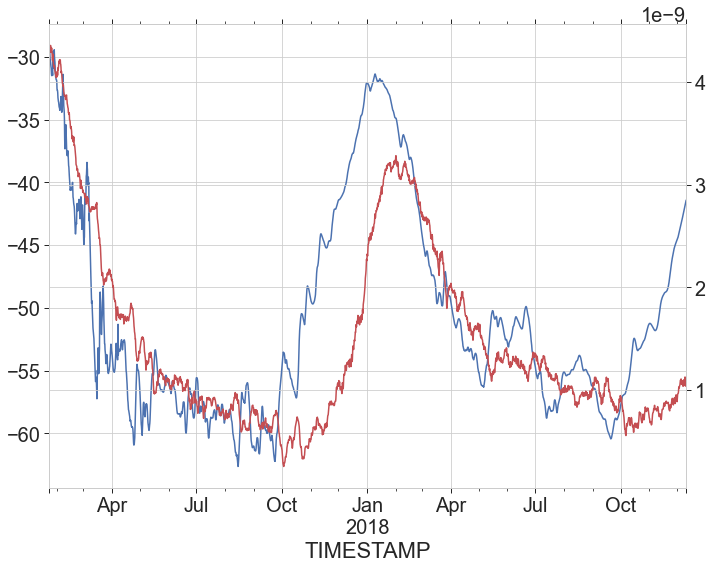

In [313]:
f1,a1 = plt.subplots(figsize=(10,8))
dfp5['T_box1'].plot(ax=a1)
a2 = a1.twinx()
dfp3['compaction_rate1'].plot(ax=a2,color='r')